In [1]:
import pandas as pd
import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import folium
import os
import fastparquet
import geopandas as gpd

In [2]:
%matplotlib inline
pd.set_option('display.max_columns', None)

In [3]:
path="F:/1_Bachelorarbeit/1_Daten/1_Yellow_Cab_Trips_2009-June_2016/5_Dataset_for_Exploration/Exploration_Tripdata_for_Bivariate.parquet"
# Testing the Parquet Files
df=pd.read_parquet(path=path,engine="fastparquet")
df

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff
index,,,,,,,,,,,,,,,,,,
0,2009-06-04 22:02:56,2009-06-04 22:11:56,2,2.099609,-73.983757,40.743824,0,8.101562,POINT (-73.98375701904297 40.74382400512695),Midtown South,164,Manhattan,-73.962143,40.765209,POINT (-73.96214294433594 40.76520919799805),Lenox Hill West,141,Manhattan
1,2009-06-06 22:02:00,2009-06-06 22:30:00,1,4.078125,-73.976387,40.763893,0,16.093750,POINT (-73.97638702392578 40.76389312744141),Midtown North,163,Manhattan,-74.003380,40.734158,POINT (-74.00337982177734 40.73415756225586),West Village,249,Manhattan
2,2009-06-19 17:01:00,2009-06-19 17:09:00,3,0.799805,-73.973450,40.763992,0,5.699219,POINT (-73.97344970703125 40.76399230957031),Midtown North,163,Manhattan,-73.982124,40.756065,POINT (-73.98212432861328 40.75606536865234),Midtown Center,161,Manhattan
3,2009-01-18 19:47:30,2009-01-18 19:53:35,2,2.199219,-73.956551,40.771511,0,7.398438,POINT (-73.95655059814453 40.77151107788086),Lenox Hill West,141,Manhattan,-73.976868,40.743328,POINT (-73.97686767578125 40.74332809448242),Kips Bay,137,Manhattan
4,2009-07-13 09:27:47,2009-07-13 09:39:49,1,1.299805,-73.987587,40.770531,0,7.699219,POINT (-73.98758697509766 40.77053070068359),Lincoln Square West,143,Manhattan,-73.982986,40.758152,POINT (-73.98298645019531 40.75815200805664),Times Sq/Theatre District,230,Manhattan
5,2009-09-15 18:12:00,2009-09-15 18:29:00,1,2.589844,-73.985863,40.741444,0,10.898438,POINT (-73.98586273193359 40.7414436340332),Union Sq,234,Manhattan,-73.966316,40.773003,POINT (-73.96631622314453 40.77300262451172),Upper East Side South,237,Manhattan
6,2009-05-02 20:56:00,2009-05-02 21:06:00,1,2.369141,-73.986504,40.778904,0,8.898438,POINT (-73.98650360107422 40.77890396118164),Lincoln Square West,143,Manhattan,-73.964706,40.806805,POINT (-73.96470642089844 40.80680465698242),Morningside Heights,166,Manhattan
7,2009-02-14 05:55:48,2009-02-14 06:02:13,1,2.800781,-73.994293,40.690109,0,9.000000,POINT (-73.99429321289063 40.69010925292969),Cobble Hill,52,Brooklyn,-74.007790,40.714977,POINT (-74.00778961181641 40.7149772644043),TriBeCa/Civic Center,231,Manhattan
8,2009-07-24 22:29:05,2009-07-24 22:49:13,1,4.398438,-73.966644,40.803864,0,14.500000,POINT (-73.96664428710938 40.80386352539063),Bloomingdale,24,Manhattan,-73.991371,40.752869,POINT (-73.99137115478516 40.75286865234375),Garment District,100,Manhattan


In [4]:
gdf=gpd.GeoDataFrame(df)

In [5]:
gdf.head()

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff
index,,,,,,,,,,,,,,,,,,
0,2009-06-04 22:02:56,2009-06-04 22:11:56,2,2.099609,-73.983757,40.743824,0,8.101562,POINT (-73.98375701904297 40.74382400512695),Midtown South,164,Manhattan,-73.962143,40.765209,POINT (-73.96214294433594 40.76520919799805),Lenox Hill West,141,Manhattan
1,2009-06-06 22:02:00,2009-06-06 22:30:00,1,4.078125,-73.976387,40.763893,0,16.093750,POINT (-73.97638702392578 40.76389312744141),Midtown North,163,Manhattan,-74.003380,40.734158,POINT (-74.00337982177734 40.73415756225586),West Village,249,Manhattan
2,2009-06-19 17:01:00,2009-06-19 17:09:00,3,0.799805,-73.973450,40.763992,0,5.699219,POINT (-73.97344970703125 40.76399230957031),Midtown North,163,Manhattan,-73.982124,40.756065,POINT (-73.98212432861328 40.75606536865234),Midtown Center,161,Manhattan
3,2009-01-18 19:47:30,2009-01-18 19:53:35,2,2.199219,-73.956551,40.771511,0,7.398438,POINT (-73.95655059814453 40.77151107788086),Lenox Hill West,141,Manhattan,-73.976868,40.743328,POINT (-73.97686767578125 40.74332809448242),Kips Bay,137,Manhattan
4,2009-07-13 09:27:47,2009-07-13 09:39:49,1,1.299805,-73.987587,40.770531,0,7.699219,POINT (-73.98758697509766 40.77053070068359),Lincoln Square West,143,Manhattan,-73.982986,40.758152,POINT (-73.98298645019531 40.75815200805664),Times Sq/Theatre District,230,Manhattan


In [6]:
gdf.describe()

,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,LocationID_pickup,Dropoff_Lon,Dropoff_Lat,LocationID_dropoff
count,1.915832e+06,1.915832e+06,1.915832e+06,1.915832e+06,1.915832e+06,1.915832e+06,1.915832e+06,1.915832e+06,1.915832e+06,1.915832e+06
mean,1.687247e+00,2.914142e+00,-7.397531e+01,4.075091e+01,8.960968e-01,1.138768e+01,1.607228e+02,-7.397456e+01,4.075137e+01,1.589840e+02
std,1.309663e+00,3.924014e+01,3.451246e-02,2.674579e-02,3.830549e-01,8.903463e+00,6.637132e+01,3.309852e-02,3.064235e-02,6.929549e+01
min,1.000000e+00,6.000519e-03,-7.423065e+01,4.051488e+01,0.000000e+00,2.900391e+00,1.000000e+00,-7.424289e+01,4.050939e+01,1.000000e+00
25%,1.000000e+00,1.040039e+00,-7.399223e+01,4.073675e+01,1.000000e+00,6.101562e+00,1.130000e+02,-7.399150e+01,4.073568e+01,1.070000e+02
50%,1.000000e+00,1.769531e+00,-7.398209e+01,4.075344e+01,1.000000e+00,8.500000e+00,1.610000e+02,-7.398052e+01,4.075397e+01,1.610000e+02
75%,2.000000e+00,3.199219e+00,-7.396838e+01,4.076765e+01,1.000000e+00,1.300000e+01,2.310000e+02,-7.396518e+01,4.076854e+01,2.310000e+02
max,6.000000e+00,4.499200e+04,-7.371025e+01,4.091128e+01,6.000000e+00,5.000000e+02,2.630000e+02,-7.370098e+01,4.091288e+01,2.630000e+02


In [7]:
gdf.dtypes

Pickup_DateTime       datetime64[ns]
Dropoff_DateTime      datetime64[ns]
Passenger_Count                uint8
Trip_Distance                float32
Pickup_Lon                   float32
Pickup_Lat                   float32
RateCodeID                     uint8
Fare_Amt                     float32
geometry_pickup               object
zone_pickup                   object
LocationID_pickup             uint16
borough_pickup                object
Dropoff_Lon                  float32
Dropoff_Lat                  float32
geometry_dropoff              object
zone_dropoff                  object
LocationID_dropoff            uint16
borough_dropoff               object
dtype: object

In [8]:
gdf.shape

(1915832, 18)

## Theory and Hypothesis

### 1. The Fare should increase if the travelled Distance is longer

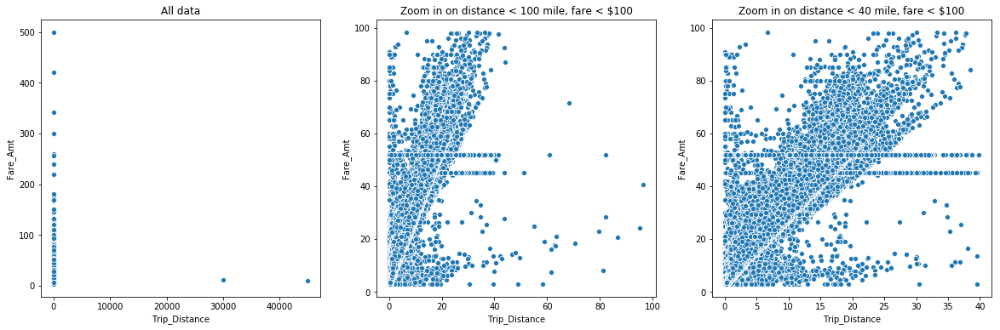

In [9]:
# scatter plot distance - fare
fig, axs = plt.subplots(1, 3, figsize=(20,6))
sns.scatterplot(data=gdf,x="Trip_Distance", y="Fare_Amt",ax=axs[0])
axs[0].set_xlabel('Trip_Distance')
axs[0].set_ylabel('Fare_Amt')
axs[0].set_title('All data')

# zoom in on part of data
idx = (gdf.Trip_Distance < 100) & (gdf.Fare_Amt < 100)
sns.scatterplot(data=gdf,x=gdf[idx].Trip_Distance, y=gdf[idx].Fare_Amt,ax=axs[1])
axs[1].set_xlabel('Trip_Distance')
axs[1].set_ylabel('Fare_Amt')
axs[1].set_title('Zoom in on distance < 100 mile, fare < $100');

# zoom in on part of data
idx = (gdf.Trip_Distance < 40) & (gdf.Fare_Amt < 100)
sns.scatterplot(data=gdf,x=gdf[idx].Trip_Distance, y=gdf[idx].Fare_Amt,ax=axs[2])
axs[2].set_xlabel('Trip_Distance')
axs[2].set_ylabel('Fare_Amt')
axs[2].set_title('Zoom in on distance < 40 mile, fare < $100');

#### Observation:
#### 1. There are trips with small distances but with high fares. (Outliers) -> Maybe because of Traffic? 
#### 2. There are Trips with high distances but with low Fare Amount. (Outliers) or maybe Discount? -> 
#### 3. There are 2 horizontal Lines -> indicator for Manhattan_JFK Airport Trips maybe? , because Manhattan_JFK Airport Trips have Fixed Fees
#### 4. But overall there seems to be a (linear) relation between distance and fare

### How many Trips are Airport Trips?

In [10]:
Newark_Airport_Len=len(gdf[(gdf["zone_pickup"]=="Newark Airport") | (gdf["zone_dropoff"]=="Newark Airport")])
print("Newark_Airport_Trips:"+str(Newark_Airport_Len))
JFK_Airport_Len=len(gdf[(gdf["zone_pickup"]=="JFK Airport") | (gdf["zone_dropoff"]=="JFK Airport")])
print("JFK_Airport_Trips:"+str(JFK_Airport_Len))
LaGuardia_Airport_Len=len(gdf[(gdf["zone_pickup"]=="LaGuardia Airport") | (gdf["zone_dropoff"]=="LaGuardia Airport")])
print("LaGuardia_Airport_Trips:"+str(LaGuardia_Airport_Len))
print("\n")
Airport_Trips=Newark_Airport_Len+JFK_Airport_Len+LaGuardia_Airport_Len
print("Total Airport Trips:"+ str(Airport_Trips))
print("\n")
print(str((Airport_Trips/len(gdf))*100)+" "+"% are Airport Trips")

Newark_Airport_Trips:2591
JFK_Airport_Trips:43813
LaGuardia_Airport_Trips:63626


Total Airport Trips:110030


5.743196689480079 % are Airport Trips


In [11]:
# Create Column Airport Trips with boolean values to show if trip is Airport Trip or not
gdf["Airport_Trip"]=False
gdf.loc[(gdf['zone_pickup'] == "JFK Airport") | (gdf['zone_dropoff'] == "JFK Airport") | (gdf['zone_pickup'] == "LaGuardia Airport") | (gdf['zone_dropoff'] == "LaGuardia Airport") | (gdf['zone_pickup'] == "Newark Airport") | (gdf['zone_dropoff'] == "Newark Airport"),['Airport_Trip']] = True

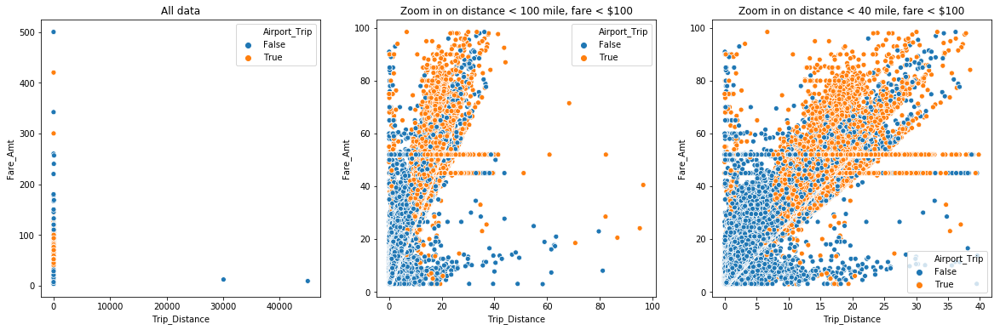

In [12]:
# scatter plot distance - fare
fig, axs = plt.subplots(1, 3, figsize=(20,6))
sns.scatterplot(data=gdf,x="Trip_Distance", y="Fare_Amt",ax=axs[0],hue="Airport_Trip")
axs[0].set_xlabel('Trip_Distance')
axs[0].set_ylabel('Fare_Amt')
axs[0].set_title('All data')

# zoom in on part of data
idx = (gdf.Trip_Distance < 100) & (gdf.Fare_Amt < 100)
sns.scatterplot(data=gdf,x=gdf[idx].Trip_Distance, y=gdf[idx].Fare_Amt,ax=axs[1],hue="Airport_Trip")
axs[1].set_xlabel('Trip_Distance')
axs[1].set_ylabel('Fare_Amt')
axs[1].set_title('Zoom in on distance < 100 mile, fare < $100');

# zoom in on part of data
idx = (gdf.Trip_Distance < 40) & (gdf.Fare_Amt < 100)
sns.scatterplot(data=gdf,x=gdf[idx].Trip_Distance, y=gdf[idx].Fare_Amt,ax=axs[2],hue="Airport_Trip")
axs[2].set_xlabel('Trip_Distance')
axs[2].set_ylabel('Fare_Amt')
axs[2].set_title('Zoom in on distance < 40 mile, fare < $100');

#### Observation:
#### 1.The most Airport Trips are expensive

In [13]:
# Trips between JFK and Manhatten
# Create Manhattan_JFK_Airport_Trip with boolean values to show if trip is Manhattan_JFK Airport Trip or not
gdf["Manhattan_JFK_Airport_Trip"]=False
gdf.loc[((gdf['zone_pickup'] == "JFK Airport") | (gdf['zone_dropoff'] == "JFK Airport")) & ((gdf['borough_pickup'] == "Manhattan") | (gdf['borough_dropoff'] == "Manhattan")) ,['Manhattan_JFK_Airport_Trip']] = True

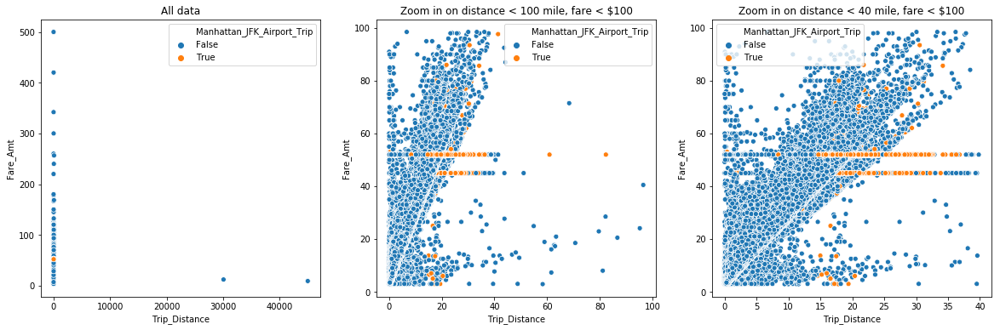

In [14]:
# scatter plot distance - fare
fig, axs = plt.subplots(1, 3, figsize=(20,6))
sns.scatterplot(data=gdf,x="Trip_Distance", y="Fare_Amt",ax=axs[0],hue="Manhattan_JFK_Airport_Trip")
axs[0].set_xlabel('Trip_Distance')
axs[0].set_ylabel('Fare_Amt')
axs[0].set_title('All data')

# zoom in on part of data
idx = (gdf.Trip_Distance < 100) & (gdf.Fare_Amt < 100)
sns.scatterplot(data=gdf,x=gdf[idx].Trip_Distance, y=gdf[idx].Fare_Amt,ax=axs[1],hue="Manhattan_JFK_Airport_Trip")
axs[1].set_xlabel('Trip_Distance')
axs[1].set_ylabel('Fare_Amt')
axs[1].set_title('Zoom in on distance < 100 mile, fare < $100');

# zoom in on part of data
idx = (gdf.Trip_Distance < 40) & (gdf.Fare_Amt < 100)
sns.scatterplot(data=gdf,x=gdf[idx].Trip_Distance, y=gdf[idx].Fare_Amt,ax=axs[2],hue="Manhattan_JFK_Airport_Trip")
axs[2].set_xlabel('Trip_Distance')
axs[2].set_ylabel('Fare_Amt')
axs[2].set_title('Zoom in on distance < 40 mile, fare < $100');

#### Observation:
#### 1. There are Airport Trips between Manhattan and JFK, which are not the Flat Fares like 45 Dollar or 52 Dollar

#### Since July 1st 2012 the Flat Fare between JFK and Manhattan changed from 45 Dollars to 52 Dollars
#### For more Information go to: [Flat Fare](https://www.new-york-city-travel-tips.com/how-transfer-between-jfk-airport-manhattan/)

In [15]:
# Show Dataframe with Manhattan_JFK Trips
gdf[((gdf['zone_pickup'] == "JFK Airport") | (gdf['zone_dropoff'] == "JFK Airport")) & ((gdf['borough_pickup'] == "Manhattan") | (gdf['borough_dropoff'] == "Manhattan"))]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip
index,,,,,,,,,,,,,,,,,,,,
94,2009-03-02 15:02:00,2009-03-02 15:34:00,1,17.015625,-73.786018,40.645683,0,45.000,POINT (-73.78601837158203 40.64568328857422),JFK Airport,132,Queens,-73.964195,40.754452,POINT (-73.96419525146484 40.75445175170898),Sutton Place/Turtle Bay North,229,Manhattan,True,True
317,2009-12-24 11:06:00,2009-12-24 11:40:00,1,21.500000,-74.012398,40.707981,0,45.000,POINT (-74.01239776611328 40.70798110961914),World Trade Center,261,Manhattan,-73.776283,40.645817,POINT (-73.77628326416016 40.64581680297852),JFK Airport,132,Queens,True,True
554,2009-05-08 06:37:05,2009-05-08 07:27:29,1,18.296875,-73.776787,40.645454,0,45.000,POINT (-73.77678680419922 40.64545440673828),JFK Airport,132,Queens,-73.982147,40.722534,POINT (-73.98214721679688 40.7225341796875),Alphabet City,4,Manhattan,True,True
591,2009-12-19 04:00:34,2009-12-19 04:27:31,1,17.703125,-73.986252,40.758804,0,45.000,POINT (-73.98625183105469 40.75880432128906),Times Sq/Theatre District,230,Manhattan,-73.782516,40.648846,POINT (-73.78251647949219 40.64884567260742),JFK Airport,132,Queens,True,True
704,2009-08-08 11:06:00,2009-08-08 11:48:00,5,19.234375,-73.990150,40.746384,0,45.000,POINT (-73.99015045166016 40.74638366699219),Midtown South,164,Manhattan,-73.794220,40.644627,POINT (-73.79421997070313 40.64462661743164),JFK Airport,132,Queens,True,True
782,2009-02-25 17:46:00,2009-02-25 18:22:00,3,17.828125,-73.788101,40.647339,0,45.000,POINT (-73.78810119628906 40.6473388671875),JFK Airport,132,Queens,-73.974548,40.737507,POINT (-73.97454833984375 40.73750686645508),Kips Bay,137,Manhattan,True,True
1085,2009-12-02 12:11:09,2009-12-02 12:41:42,1,19.000000,-73.955482,40.767742,0,45.000,POINT (-73.95548248291016 40.76774215698242),Lenox Hill East,140,Manhattan,-73.798897,40.645226,POINT (-73.79889678955078 40.64522552490234),JFK Airport,132,Queens,True,True
1126,2009-11-01 17:53:00,2009-11-01 18:32:00,1,16.515625,-73.989929,40.755947,0,45.000,POINT (-73.98992919921875 40.75594711303711),Garment District,100,Manhattan,-73.783188,40.643826,POINT (-73.78318786621094 40.64382553100586),JFK Airport,132,Queens,True,True
1345,2009-08-08 14:39:12,2009-08-08 15:21:04,1,16.500000,-73.999725,40.753750,0,45.000,POINT (-73.99972534179688 40.75374984741211),East Chelsea,68,Manhattan,-73.796066,40.644512,POINT (-73.79606628417969 40.64451217651367),JFK Airport,132,Queens,True,True


#### Observation:
#### 1. Flat Fare with RateCodeID = 0 -> should be RateCodeID=2 
#### 2. Negotiated Fares with RateCodeID 5 -> higher Fares than Flat Fare -> to trick unknown Customers for more Fare

In [16]:
# Show me Dataframe with Manhattan_JFK Trips which does not contain Flat Fares(45 Dollars and 52 Dollars)
gdf[((gdf['zone_pickup'] == "JFK Airport") | (gdf['zone_dropoff'] == "JFK Airport")) & ((gdf['borough_pickup'] == "Manhattan") | (gdf['borough_dropoff'] == "Manhattan")) & ((gdf['Fare_Amt'] != 45.0) & (gdf['Fare_Amt'] != 52.0))]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip
index,,,,,,,,,,,,,,,,,,,,
2062,2009-08-07 12:45:41,2009-08-07 14:21:03,2,22.406250,-73.969925,40.784485,0,64.125000,POINT (-73.96992492675781 40.78448486328125),Central Park,43,Manhattan,-73.790215,40.646866,POINT (-73.79021453857422 40.64686584472656),JFK Airport,132,Queens,True,True
8781,2009-06-01 11:05:53,2009-06-01 11:49:58,1,15.296875,-73.977531,40.763733,0,39.687500,POINT (-73.97753143310547 40.76373291015625),Midtown North,163,Manhattan,-73.782059,40.644325,POINT (-73.78205871582031 40.64432525634766),JFK Airport,132,Queens,True,True
9271,2009-05-27 10:29:30,2009-05-27 12:02:05,1,0.700195,-73.984596,40.749691,0,18.906250,POINT (-73.98459625244141 40.74969100952148),Midtown South,164,Manhattan,-73.786110,40.645187,POINT (-73.78610992431641 40.64518737792969),JFK Airport,132,Queens,True,True
12907,2009-02-06 21:28:00,2009-02-06 22:03:00,2,24.234375,-73.790031,40.644291,0,52.906250,POINT (-73.79003143310547 40.64429092407227),JFK Airport,132,Queens,-73.974792,40.717007,POINT (-73.97479248046875 40.71700668334961),Two Bridges/Seward Park,232,Manhattan,True,True
14267,2009-07-25 10:53:03,2009-07-25 11:41:26,1,27.296875,-73.986382,40.747311,0,60.500000,POINT (-73.98638153076172 40.74731063842773),Midtown South,164,Manhattan,-73.776306,40.645424,POINT (-73.77630615234375 40.64542388916016),JFK Airport,132,Queens,True,True
16837,2009-05-17 05:27:35,2009-05-17 09:04:16,1,15.203125,-73.992004,40.731079,0,34.093750,POINT (-73.99200439453125 40.7310791015625),Greenwich Village North,113,Manhattan,-73.794395,40.656216,POINT (-73.79439544677734 40.65621566772461),JFK Airport,132,Queens,True,True
23045,2009-05-01 10:44:53,2009-05-01 15:41:12,1,1.099609,-73.786713,40.641151,0,5.300781,POINT (-73.78671264648438 40.64115142822266),JFK Airport,132,Queens,-73.974167,40.743690,POINT (-73.97416687011719 40.74369049072266),Kips Bay,137,Manhattan,True,True
24382,2009-07-07 16:16:00,2009-07-07 17:22:00,1,20.625000,-73.987267,40.730026,0,49.687500,POINT (-73.98726654052734 40.73002624511719),East Village,79,Manhattan,-73.790337,40.643810,POINT (-73.79033660888672 40.6438102722168),JFK Airport,132,Queens,True,True
24534,2009-12-05 15:06:14,2009-12-05 16:09:59,1,17.406250,-73.982826,40.769150,0,44.093750,POINT (-73.98282623291016 40.76914978027344),Lincoln Square East,142,Manhattan,-73.790176,40.643402,POINT (-73.79017639160156 40.64340209960938),JFK Airport,132,Queens,True,True


#### Observation:
#### 1. Fares with RateCodeID 0 -> Invalid RateCodeID's
#### 2. Fares with RateCodeID 5 -> Negotiated Fares -> higher Fares -> Taxi Driver has tricked some Customer
#### 3. Fares with RateCodeID 1 -> Standard Metered Fare -> Tricked some Customers for higher Fares

#### Solution: We must correct these Data with the Flat Fares

In [17]:
# First Step is to sort the Dataframe on Pickup_DateTime to get a ascending Timeline
gdf_sorted=gdf.sort_values(by="Pickup_DateTime")

In [18]:
# Show me Dataframe with Manhattan_JFK Trips which does not contain Flat Fares(45 Dollars and 52 Dollars)
gdf_sorted[((gdf_sorted['zone_pickup'] == "JFK Airport") | (gdf_sorted['zone_dropoff'] == "JFK Airport")) & ((gdf_sorted['borough_pickup'] == "Manhattan") | (gdf_sorted['borough_dropoff'] == "Manhattan")) & ((gdf_sorted['Fare_Amt'] != 45.0) & (gdf_sorted['Fare_Amt'] != 52.0))]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip
index,,,,,,,,,,,,,,,,,,,,
114123,2009-01-12 23:30:12,2009-01-13 00:04:35,1,17.500000,-73.783607,40.648594,0,3.000000,POINT (-73.78360748291016 40.64859390258789),JFK Airport,132,Queens,-73.978432,40.771774,POINT (-73.97843170166016 40.77177429199219),Central Park,43,Manhattan,True,True
59629,2009-01-16 11:57:00,2009-01-16 12:38:00,5,18.906250,-74.007538,40.732231,0,45.687500,POINT (-74.00753784179688 40.73223114013672),Meatpacking/West Village West,158,Manhattan,-73.776314,40.645931,POINT (-73.77631378173828 40.64593124389648),JFK Airport,132,Queens,True,True
177170,2009-01-23 15:05:49,2009-01-23 16:05:09,2,17.703125,-73.988846,40.722179,0,41.312500,POINT (-73.98884582519531 40.7221794128418),Lower East Side,148,Manhattan,-73.789825,40.643040,POINT (-73.78982543945313 40.64303970336914),JFK Airport,132,Queens,True,True
29985,2009-02-03 07:41:30,2009-02-03 08:27:12,1,18.203125,-74.002792,40.760529,0,45.312500,POINT (-74.00279235839844 40.76052856445313),West Chelsea/Hudson Yards,246,Manhattan,-73.776398,40.645248,POINT (-73.77639770507813 40.64524841308594),JFK Airport,132,Queens,True,True
185482,2009-02-03 21:13:00,2009-02-03 21:38:00,1,8.367188,-73.790245,40.644684,0,22.906250,POINT (-73.79024505615234 40.64468383789063),JFK Airport,132,Queens,-73.973694,40.755836,POINT (-73.97369384765625 40.75583648681641),Midtown East,162,Manhattan,True,True
85500,2009-02-05 00:40:00,2009-02-05 00:44:00,3,0.750000,-73.784599,40.648972,0,4.500000,POINT (-73.78459930419922 40.64897155761719),JFK Airport,132,Queens,-73.973091,40.761761,POINT (-73.97309112548828 40.76176071166992),Midtown North,163,Manhattan,True,True
12907,2009-02-06 21:28:00,2009-02-06 22:03:00,2,24.234375,-73.790031,40.644291,0,52.906250,POINT (-73.79003143310547 40.64429092407227),JFK Airport,132,Queens,-73.974792,40.717007,POINT (-73.97479248046875 40.71700668334961),Two Bridges/Seward Park,232,Manhattan,True,True
169963,2009-02-09 22:04:05,2009-02-09 22:43:42,2,21.906250,-73.789948,40.646698,0,49.812500,POINT (-73.78994750976563 40.64669799804688),JFK Airport,132,Queens,-73.987610,40.710697,POINT (-73.98760986328125 40.71069717407227),Two Bridges/Seward Park,232,Manhattan,True,True
130763,2009-02-11 17:37:00,2009-02-11 18:39:00,2,25.703125,-74.007584,40.705158,0,58.500000,POINT (-74.00758361816406 40.70515823364258),Financial District North,87,Manhattan,-73.783218,40.643848,POINT (-73.78321838378906 40.64384841918945),JFK Airport,132,Queens,True,True


In [19]:
# Show me Dataframe with Manhattan_JFK Trips where Flat Fare is 45 Dollars
gdf_sorted[((gdf_sorted['zone_pickup'] == "JFK Airport") | (gdf_sorted['zone_dropoff'] == "JFK Airport")) & ((gdf_sorted['borough_pickup'] == "Manhattan") | (gdf_sorted['borough_dropoff'] == "Manhattan")) & (gdf_sorted['Fare_Amt'] == 45)]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip
index,,,,,,,,,,,,,,,,,,,,
99316,2009-01-01 14:56:00,2009-01-01 15:29:00,2,18.375000,-73.776726,40.645271,0,45.0,POINT (-73.77672576904297 40.64527130126953),JFK Airport,132,Queens,-73.988907,40.758636,POINT (-73.98890686035156 40.75863647460938),Clinton East,48,Manhattan,True,True
74345,2009-01-01 15:43:00,2009-01-01 16:09:00,2,15.851562,-73.972343,40.755775,0,45.0,POINT (-73.97234344482422 40.75577545166016),Midtown East,162,Manhattan,-73.790421,40.643944,POINT (-73.79042053222656 40.64394378662109),JFK Airport,132,Queens,True,True
40339,2009-01-01 16:07:00,2009-01-01 16:34:00,2,18.296875,-73.978249,40.720501,0,45.0,POINT (-73.97824859619141 40.72050094604492),Alphabet City,4,Manhattan,-73.776360,40.645439,POINT (-73.77635955810547 40.64543914794922),JFK Airport,132,Queens,True,True
198465,2009-01-01 16:18:14,2009-01-01 17:00:29,4,19.000000,-73.790794,40.643200,0,45.0,POINT (-73.79079437255859 40.6431999206543),JFK Airport,132,Queens,-73.982323,40.764137,POINT (-73.98232269287109 40.76413726806641),Midtown North,163,Manhattan,True,True
107855,2009-01-01 16:43:00,2009-01-01 17:08:00,3,17.515625,-73.782387,40.644672,0,45.0,POINT (-73.78238677978516 40.64467239379883),JFK Airport,132,Queens,-73.985725,40.752831,POINT (-73.98572540283203 40.75283050537109),Garment District,100,Manhattan,True,True
187652,2009-01-01 18:31:40,2009-01-01 19:05:16,1,19.703125,-73.792336,40.645012,0,45.0,POINT (-73.79233551025391 40.64501190185547),JFK Airport,132,Queens,-73.973984,40.783997,POINT (-73.97398376464844 40.78399658203125),Upper West Side South,239,Manhattan,True,True
196950,2009-01-01 20:28:13,2009-01-01 20:59:05,2,19.500000,-73.783173,40.648590,0,45.0,POINT (-73.78317260742188 40.64859008789063),JFK Airport,132,Queens,-74.016335,40.716560,POINT (-74.01633453369141 40.71656036376953),Battery Park City,13,Manhattan,True,True
106159,2009-01-02 08:44:00,2009-01-02 09:14:00,1,20.125000,-73.974197,40.795807,0,45.0,POINT (-73.97419738769531 40.79580688476563),Upper West Side North,238,Manhattan,-73.783249,40.643810,POINT (-73.78324890136719 40.6438102722168),JFK Airport,132,Queens,True,True
203961,2009-01-02 11:31:30,2009-01-02 12:07:28,3,17.406250,-73.789284,40.647324,0,45.0,POINT (-73.78928375244141 40.64732360839844),JFK Airport,132,Queens,-73.974335,40.753265,POINT (-73.97433471679688 40.75326538085938),Midtown East,162,Manhattan,True,True


#### Observation:
#### 1. There are Entries with Flat Fare 45 Dollars after July 1st 2012-> Some Devices didn't change rapidly after the new Rule
#### 2. Last Entry of Flat Fare 45 Dollars is in 03.09.2012

In [20]:
# Show me Dataframe with Manhattan_JFK Trips where Flat Fare is 52 Dollars
gdf_sorted[((gdf_sorted['zone_pickup'] == "JFK Airport") | (gdf_sorted['zone_dropoff'] == "JFK Airport")) & ((gdf_sorted['borough_pickup'] == "Manhattan") | (gdf_sorted['borough_dropoff'] == "Manhattan")) & (gdf_sorted['Fare_Amt'] == 52)]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip
index,,,,,,,,,,,,,,,,,,,,
591663,2011-08-26 14:42:50,2011-08-26 15:33:57,2,17.000000,-74.001595,40.740887,5,52.0,POINT (-74.00159454345703 40.74088668823242),Flatiron,90,Manhattan,-73.786316,40.639481,POINT (-73.78631591796875 40.63948059082031),JFK Airport,132,Queens,True,True
618608,2011-09-26 21:20:34,2011-09-26 21:47:28,1,18.906250,-73.783348,40.648659,5,52.0,POINT (-73.78334808349609 40.64865875244141),JFK Airport,132,Queens,-73.946579,40.781517,POINT (-73.94657897949219 40.78151702880859),Yorkville West,263,Manhattan,True,True
755158,2012-09-04 04:54:40,2012-09-04 05:22:23,1,19.593750,-74.003479,40.707779,2,52.0,POINT (-74.00347900390625 40.70777893066406),Seaport,209,Manhattan,-73.779121,40.645111,POINT (-73.77912139892578 40.64511108398438),JFK Airport,132,Queens,True,True
831854,2012-09-04 04:57:00,2012-09-04 05:28:00,5,19.515625,-73.952904,40.780457,2,52.0,POINT (-73.95290374755859 40.78045654296875),Upper East Side North,236,Manhattan,-73.776382,40.645489,POINT (-73.77638244628906 40.64548873901367),JFK Airport,132,Queens,True,True
836951,2012-09-04 08:39:42,2012-09-04 09:45:05,2,18.593750,-73.789871,40.646782,2,52.0,POINT (-73.78987121582031 40.64678192138672),JFK Airport,132,Queens,-74.005669,40.745144,POINT (-74.00566864013672 40.74514389038086),East Chelsea,68,Manhattan,True,True
904470,2012-09-04 10:58:00,2012-09-04 11:36:00,1,18.593750,-73.776726,40.645332,2,52.0,POINT (-73.77672576904297 40.64533233642578),JFK Airport,132,Queens,-74.001144,40.741383,POINT (-74.00114440917969 40.74138259887695),Flatiron,90,Manhattan,True,True
763515,2012-09-04 11:15:00,2012-09-04 11:57:00,2,18.171875,-73.780289,40.647312,2,52.0,POINT (-73.78028869628906 40.64731216430664),JFK Airport,132,Queens,-73.992981,40.746925,POINT (-73.99298095703125 40.74692535400391),Penn Station/Madison Sq West,186,Manhattan,True,True
777471,2012-09-04 14:56:00,2012-09-04 15:34:00,1,17.593750,-73.789421,40.644974,2,52.0,POINT (-73.78942108154297 40.64497375488281),JFK Airport,132,Queens,-73.992851,40.718315,POINT (-73.99285125732422 40.71831512451172),Lower East Side,148,Manhattan,True,True
865900,2012-09-04 16:00:00,2012-09-04 16:43:00,1,17.484375,-73.936272,40.799068,2,52.0,POINT (-73.93627166748047 40.79906845092773),East Harlem North,74,Manhattan,-73.783218,40.648743,POINT (-73.78321838378906 40.64874267578125),JFK Airport,132,Queens,True,True


#### Observation:
#### 1. The real first Entry of the Flat Fare 52 Dollars is in 04.09.2012
#### 2. There are 2 Negotiated Fares with 52 Dollars before 04.09.2012

In [21]:
# Store Pickup_Datetime of all Rows with 45 Dollars Fare Amount and JFK_Manhattan Trip in numpy array
array_pickup_datetime_45 = gdf_sorted[((gdf_sorted['zone_pickup'] == "JFK Airport") | (gdf_sorted['zone_dropoff'] == "JFK Airport")) & ((gdf_sorted['borough_pickup'] == "Manhattan") | (gdf_sorted['borough_dropoff'] == "Manhattan")) & (gdf_sorted['Fare_Amt']== 45)]["Pickup_DateTime"].to_numpy()
# Store Pickup_Datetime of all Rows with 52 Dollars Fare Amount and JFK_Manhattan Trip and RateCodeID 2 in numpy array
array_pickup_datetime_52 = gdf_sorted[((gdf_sorted['zone_pickup'] == "JFK Airport") | (gdf_sorted['zone_dropoff'] == "JFK Airport")) & ((gdf_sorted['borough_pickup'] == "Manhattan") | (gdf_sorted['borough_dropoff'] == "Manhattan"))& (gdf_sorted['Fare_Amt']== 52)]["Pickup_DateTime"].to_numpy()
# Drop Entries where the end element of array_pickup_datetime_45 is bigger than elements of array_pickup_datetime_52
for elements in array_pickup_datetime_52:
    if array_pickup_datetime_45[-3] >= elements:
        array_pickup_datetime_52=np.delete(array_pickup_datetime_52, np.where(array_pickup_datetime_52==elements))
    else:
        pass 
for elements in array_pickup_datetime_45:
    if array_pickup_datetime_52[0] <= elements:
        array_pickup_datetime_45=np.delete(array_pickup_datetime_45, np.where(array_pickup_datetime_45==elements))
    else:
        pass 

In [22]:
# Second Step is to replace all Manhattan_JFK Trips until 2012-09-03 with Fare Amount of 45 Dollars and RateCodeID with 2
# Get first Datetime and convert to date
start_datetime=array_pickup_datetime_45[0]
start_datetime_convert=pd.to_datetime(start_datetime)
start_date=str(start_datetime_convert.date())
# Get last Datetime and convert to date and add 1 day, because it's always one day before (-1)
end_datetime=array_pickup_datetime_45[-1]
end_datetime_convert=pd.to_datetime(end_datetime)
end_date= str(end_datetime_convert.date()+dt.timedelta(days=1))

mask = (gdf_sorted['Pickup_DateTime'] >= start_date) & (gdf_sorted['Pickup_DateTime'] <= end_date)
gdf_sorted.loc[(mask) & ((gdf_sorted['zone_pickup'] == "JFK Airport") | (gdf_sorted['zone_dropoff'] == "JFK Airport")) & ((gdf_sorted['borough_pickup'] == "Manhattan") | (gdf_sorted['borough_dropoff'] == "Manhattan")),['Fare_Amt']]=45
gdf_sorted.loc[(mask) & ((gdf_sorted['zone_pickup'] == "JFK Airport") | (gdf_sorted['zone_dropoff'] == "JFK Airport")) & ((gdf_sorted['borough_pickup'] == "Manhattan") | (gdf_sorted['borough_dropoff'] == "Manhattan")),['RateCodeID']]=2

In [23]:
# Second Step is to replace all Manhattan_JFK Trips until 2016-06-30 with Fare Amount of 52 Dollars and RateCodeID with 2
# Get first Datetime and convert to date
start_datetime=array_pickup_datetime_52[0]
start_datetime_convert=pd.to_datetime(start_datetime)
start_date= str(start_datetime_convert.date())
# Get last Datetime and convert to date and add 1 day, because it's always one day before (-1)
end_datetime=array_pickup_datetime_52[-1]
end_datetime_convert=pd.to_datetime(end_datetime)
end_date= str(end_datetime_convert.date()+dt.timedelta(days=1))

mask = (gdf_sorted['Pickup_DateTime'] >= start_date) & (gdf_sorted['Pickup_DateTime'] <= end_date)
gdf_sorted.loc[(mask) & ((gdf_sorted['zone_pickup'] == "JFK Airport") | (gdf_sorted['zone_dropoff'] == "JFK Airport")) & ((gdf_sorted['borough_pickup'] == "Manhattan") | (gdf_sorted['borough_dropoff'] == "Manhattan")),['Fare_Amt']]=52
gdf_sorted.loc[(mask) & ((gdf_sorted['zone_pickup'] == "JFK Airport") | (gdf_sorted['zone_dropoff'] == "JFK Airport")) & ((gdf_sorted['borough_pickup'] == "Manhattan") | (gdf_sorted['borough_dropoff'] == "Manhattan")),['RateCodeID']]=2

In [24]:
# Show me Dataframe with Manhattan_JFK Trips which does not contain Flat Fares(45 Dollars and 52 Dollars)
gdf_sorted[((gdf_sorted['zone_pickup'] == "JFK Airport") | (gdf_sorted['zone_dropoff'] == "JFK Airport")) & ((gdf_sorted['borough_pickup'] == "Manhattan") | (gdf_sorted['borough_dropoff'] == "Manhattan")) & ((gdf_sorted['Fare_Amt'] != 45.0) & (gdf_sorted['Fare_Amt'] != 52.0))]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip
index,,,,,,,,,,,,,,,,,,,,


#### Observation:
#### 1. Replaced all Manhattan_JFK Airport Trips with the Flat Rates successfully

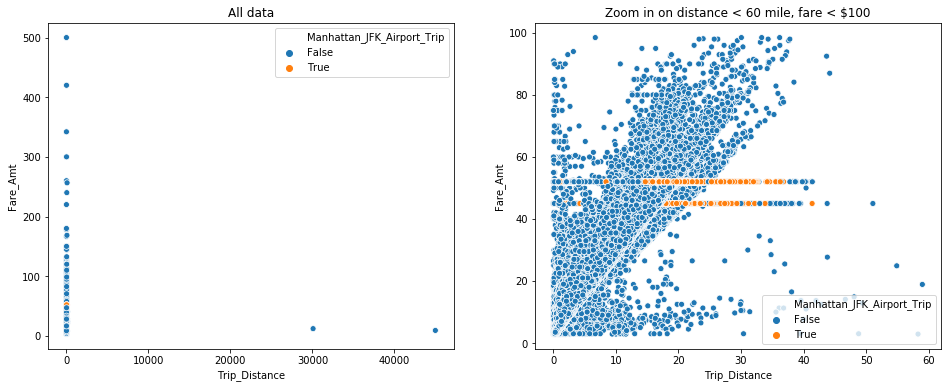

In [25]:
#Evidence that Manhattan_JFK Airport Trips are just Flat Fares
# scatter plot distance - fare
fig, axs = plt.subplots(1, 2, figsize=(16,6))
sns.scatterplot(data=gdf_sorted,x="Trip_Distance", y="Fare_Amt",ax=axs[0],hue="Manhattan_JFK_Airport_Trip")
axs[0].set_xlabel('Trip_Distance')
axs[0].set_ylabel('Fare_Amt')
axs[0].set_title('All data')

# zoom in on part of data
idx = (gdf_sorted.Trip_Distance < 60) & (gdf_sorted.Fare_Amt < 100)
sns.scatterplot(data=gdf_sorted,x=gdf_sorted[idx].Trip_Distance, y=gdf_sorted[idx].Fare_Amt,ax=axs[1],hue="Manhattan_JFK_Airport_Trip")
axs[1].set_xlabel('Trip_Distance')
axs[1].set_ylabel('Fare_Amt')
axs[1].set_title('Zoom in on distance < 60 mile, fare < $100');

#### Proof that Manhattan_JFK Trips has same Amount of RateCodeID 2

In [26]:
len(gdf_sorted.loc[gdf_sorted["Manhattan_JFK_Airport_Trip"]==True])

29819

In [27]:
len(gdf_sorted.loc[((gdf_sorted['zone_pickup'] == "JFK Airport") | (gdf_sorted['zone_dropoff'] == "JFK Airport")) & ((gdf_sorted['borough_pickup'] == "Manhattan") | (gdf_sorted['borough_dropoff'] == "Manhattan")) ])

29819

#### There are Trips which originate in Newark Airport

In [28]:
gdf_sorted.loc[(gdf_sorted['zone_pickup'] == "Newark Airport")]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip
index,,,,,,,,,,,,,,,,,,,,
44504,2009-03-01 02:55:00,2009-03-01 03:10:00,4,4.730469,-74.172623,40.693359,0,13.296875,POINT (-74.17262268066406 40.693359375),Newark Airport,1,EWR,-73.986763,40.717815,POINT (-73.98676300048828 40.71781539916992),Two Bridges/Seward Park,232,Manhattan,True,False
214685,2009-03-01 05:38:56,2009-03-01 05:41:46,1,0.500000,-74.184013,40.691280,0,4.601562,POINT (-74.18401336669922 40.69128036499023),Newark Airport,1,EWR,-74.177521,40.690502,POINT (-74.17752075195313 40.69050216674805),Newark Airport,1,EWR,True,False
105315,2009-03-09 13:17:00,2009-03-09 13:22:00,1,0.660156,-74.183960,40.691658,0,4.101562,POINT (-74.1839599609375 40.69165802001953),Newark Airport,1,EWR,-74.177177,40.691048,POINT (-74.17717742919922 40.69104766845703),Newark Airport,1,EWR,True,False
224072,2009-03-23 13:53:29,2009-03-23 14:21:19,1,15.000000,-74.178299,40.695583,0,34.093750,POINT (-74.17829895019531 40.69558334350586),Newark Airport,1,EWR,-74.002525,40.739620,POINT (-74.00252532958984 40.73962020874023),West Village,249,Manhattan,True,False
29648,2009-05-05 14:22:45,2009-05-05 14:27:39,1,1.200195,-74.177917,40.695469,0,6.898438,POINT (-74.17791748046875 40.69546890258789),Newark Airport,1,EWR,-74.177895,40.690575,POINT (-74.17789459228516 40.69057464599609),Newark Airport,1,EWR,True,False
611,2009-06-24 14:52:25,2009-06-24 14:52:57,1,0.199951,-74.177170,40.694889,0,75.000000,POINT (-74.17716979980469 40.69488906860352),Newark Airport,1,EWR,-74.177345,40.695137,POINT (-74.17734527587891 40.69513702392578),Newark Airport,1,EWR,True,False
429341,2010-03-19 20:56:35,2010-03-19 21:09:33,1,3.199219,-74.177902,40.682438,1,10.500000,POINT (-74.17790222167969 40.68243789672852),Newark Airport,1,EWR,-74.176636,40.681789,POINT (-74.1766357421875 40.68178939819336),Newark Airport,1,EWR,True,False
337030,2010-04-11 16:31:00,2010-04-11 16:37:00,1,2.179688,-74.173378,40.697491,1,6.898438,POINT (-74.17337799072266 40.69749069213867),Newark Airport,1,EWR,-73.953941,40.782112,POINT (-73.95394134521484 40.78211212158203),Upper East Side North,236,Manhattan,True,False
297492,2010-09-14 00:14:23,2010-09-14 00:21:29,1,2.099609,-74.177200,40.694881,1,7.300781,POINT (-74.17720031738281 40.69488143920898),Newark Airport,1,EWR,-74.177200,40.694874,POINT (-74.17720031738281 40.69487380981445),Newark Airport,1,EWR,True,False


#### Drop those Entries because we want to look at Trips which originates in New York City

In [29]:
print(str(len(gdf_sorted.loc[(gdf_sorted['zone_pickup'] == "Newark Airport")]) /len(gdf_sorted)*100) +" "+ "% are pickups in Newark Airport")

0.001774685880599134 % are pickups in Newark Airport


#### Drop Rows with Entries which Newark Airport Originate at

In [30]:
indexNames = gdf_sorted.loc[gdf_sorted["zone_pickup"]=="Newark Airport"].index
gdf_sorted.drop(indexNames , inplace=True)

### Look in Dataframe which has Destination in Newark Airport

#### With RateCodeID=2

In [31]:
gdf_sorted.loc[(gdf_sorted['zone_dropoff'] == "Newark Airport") & (gdf_sorted['RateCodeID'] == 2)]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip
index,,,,,,,,,,,,,,,,,,,,
984358,2012-01-17 05:30:40,2012-01-17 05:52:00,1,14.296875,-73.984192,40.732925,2,45.0,POINT (-73.98419189453125 40.73292541503906),Gramercy,107,Manhattan,-74.176758,40.693542,POINT (-74.1767578125 40.69354248046875),Newark Airport,1,EWR,True,False
766600,2012-06-24 19:42:59,2012-06-24 20:13:37,1,17.406250,-73.992874,40.747066,2,45.0,POINT (-73.99287414550781 40.74706649780273),Penn Station/Madison Sq West,186,Manhattan,-74.177094,40.694962,POINT (-74.17709350585938 40.69496154785156),Newark Airport,1,EWR,True,False
840797,2012-08-27 12:10:34,2012-08-27 12:56:13,1,17.406250,-73.981163,40.760460,2,45.0,POINT (-73.98116302490234 40.76045989990234),Times Sq/Theatre District,230,Manhattan,-74.178123,40.695541,POINT (-74.17812347412109 40.69554138183594),Newark Airport,1,EWR,True,False
1203495,2013-10-23 15:34:15,2013-10-23 15:57:48,1,15.203125,-74.001190,40.759068,2,52.0,POINT (-74.00119018554688 40.75906753540039),West Chelsea/Hudson Yards,246,Manhattan,-74.181442,40.687710,POINT (-74.18144226074219 40.68770980834961),Newark Airport,1,EWR,True,False


#### Observation:
#### 1. Some Customers have payed the Rate for RateCodeID 2 
#### Decision: Drop those Rows, because they don't make sense

In [32]:
print(str(len(gdf_sorted.loc[(gdf_sorted['zone_dropoff'] == "Newark Airport") & (gdf_sorted['RateCodeID'] == 2)]) /len(gdf_sorted)*100) +" "+ "% are dropoffs in Newark Airport and has RateCodeID 2")

0.00020879027955974483 % are dropoffs in Newark Airport and has RateCodeID 2


#### Drop those Rows,because they are faulty

In [33]:
indexNames = gdf_sorted.loc[(gdf_sorted['zone_dropoff'] == "Newark Airport") & (gdf_sorted['RateCodeID'] == 2)].index
gdf_sorted.drop(indexNames , inplace=True)

#### With RateCodeID 5

In [34]:
gdf_sorted.loc[(gdf_sorted['zone_dropoff'] == "Newark Airport") & (gdf_sorted['RateCodeID'] == 5)]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip
index,,,,,,,,,,,,,,,,,,,,
252053,2010-02-21 16:53:00,2010-02-21 17:25:00,1,17.453125,-73.985222,40.758533,5,65.0,POINT (-73.98522186279297 40.7585334777832),Times Sq/Theatre District,230,Manhattan,-74.177963,40.695583,POINT (-74.17796325683594 40.69558334350586),Newark Airport,1,EWR,True,False
259452,2010-06-06 19:48:00,2010-06-06 20:24:00,1,16.656250,-73.991745,40.759548,5,75.0,POINT (-73.99174499511719 40.75954818725586),Clinton East,48,Manhattan,-74.177124,40.691360,POINT (-74.1771240234375 40.69136047363281),Newark Airport,1,EWR,True,False
453795,2010-06-11 07:53:51,2010-06-11 08:27:36,1,16.296875,-73.987350,40.759392,5,75.0,POINT (-73.98735046386719 40.75939178466797),Times Sq/Theatre District,230,Manhattan,-74.184296,40.689457,POINT (-74.18429565429688 40.68945693969727),Newark Airport,1,EWR,True,False
368388,2010-06-17 13:24:00,2010-06-17 14:02:00,1,17.328125,-73.990921,40.746216,5,65.0,POINT (-73.99092102050781 40.7462158203125),Penn Station/Madison Sq West,186,Manhattan,-74.177246,40.690983,POINT (-74.17724609375 40.69098281860352),Newark Airport,1,EWR,True,False
383670,2010-06-20 14:10:00,2010-06-20 14:54:00,1,14.421875,-73.990150,40.746593,5,80.0,POINT (-73.99015045166016 40.7465934753418),Penn Station/Madison Sq West,186,Manhattan,-74.183960,40.691429,POINT (-74.1839599609375 40.69142913818359),Newark Airport,1,EWR,True,False
360635,2010-06-27 11:55:50,2010-06-27 12:27:42,2,20.000000,-73.979805,40.751961,5,70.0,POINT (-73.97980499267578 40.75196075439453),Murray Hill,170,Manhattan,-74.177109,40.694584,POINT (-74.17710876464844 40.69458389282227),Newark Airport,1,EWR,True,False
359826,2010-07-13 22:51:00,2010-07-13 23:29:00,1,19.593750,-73.973335,40.750664,5,70.0,POINT (-73.97333526611328 40.75066375732422),UN/Turtle Bay South,233,Manhattan,-74.181274,40.692062,POINT (-74.1812744140625 40.69206237792969),Newark Airport,1,EWR,True,False
356271,2010-07-21 05:39:31,2010-07-21 05:59:23,1,16.406250,-73.995155,40.758656,5,60.0,POINT (-73.99515533447266 40.7586555480957),Clinton East,48,Manhattan,-74.176903,40.694324,POINT (-74.17690277099609 40.6943244934082),Newark Airport,1,EWR,True,False
339492,2010-11-14 14:13:00,2010-11-14 14:44:00,1,17.312500,-73.988937,40.763298,5,70.0,POINT (-73.98893737792969 40.76329803466797),Clinton East,48,Manhattan,-74.177063,40.694962,POINT (-74.17706298828125 40.69496154785156),Newark Airport,1,EWR,True,False


In [35]:
print(str(len(gdf_sorted.loc[(gdf_sorted['zone_dropoff'] == "Newark Airport") & (gdf_sorted['RateCodeID'] == 5)]) /len(gdf_sorted)*100) +" "+ "% are dropoffs in Newark Airport and has RateCodeID 5")

0.005480756281729664 % are dropoffs in Newark Airport and has RateCodeID 5


#### Drop those Rows, because it's these are Situations where Taxi Driver has tricked Customers

In [36]:
indexNames = gdf_sorted.loc[(gdf_sorted['zone_dropoff'] == "Newark Airport") & (gdf_sorted['RateCodeID'] == 5)].index
gdf_sorted.drop(indexNames , inplace=True)

#### With RateCodeID=3

In [37]:
gdf_sorted.loc[(gdf_sorted['zone_dropoff'] == "Newark Airport") & (gdf_sorted['RateCodeID'] == 3)]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip
index,,,,,,,,,,,,,,,,,,,,
390010,2010-02-11 11:52:00,2010-02-11 12:18:00,5,17.093750,-73.983604,40.760620,3,53.09375,POINT (-73.98360443115234 40.7606201171875),Times Sq/Theatre District,230,Manhattan,-74.177124,40.695034,POINT (-74.1771240234375 40.69503402709961),Newark Airport,1,EWR,True,False
301357,2010-02-12 12:50:00,2010-02-12 13:25:00,1,18.156250,-74.005615,40.706886,3,55.90625,POINT (-74.005615234375 40.70688629150391),Financial District North,87,Manhattan,-74.177124,40.694839,POINT (-74.1771240234375 40.69483947753906),Newark Airport,1,EWR,True,False
463014,2010-02-14 10:06:00,2010-02-14 10:30:00,1,15.921875,-73.999619,40.738640,3,49.50000,POINT (-73.99961853027344 40.73863983154297),Flatiron,90,Manhattan,-74.177643,40.695282,POINT (-74.17764282226563 40.69528198242188),Newark Airport,1,EWR,True,False
303764,2010-02-14 15:53:00,2010-02-14 16:32:00,2,19.375000,-73.985985,40.760937,3,59.50000,POINT (-73.98598480224609 40.76093673706055),Times Sq/Theatre District,230,Manhattan,-74.181564,40.687729,POINT (-74.18156433105469 40.68772888183594),Newark Airport,1,EWR,True,False
312720,2010-02-19 07:53:00,2010-02-19 08:24:00,1,17.640625,-73.980949,40.770988,3,53.90625,POINT (-73.98094940185547 40.77098846435547),Lincoln Square East,142,Manhattan,-74.178032,40.689865,POINT (-74.17803192138672 40.68986511230469),Newark Airport,1,EWR,True,False
315853,2010-02-23 06:23:00,2010-02-23 06:53:00,1,17.671875,-73.978798,40.746868,3,53.90625,POINT (-73.97879791259766 40.74686813354492),Murray Hill,170,Manhattan,-74.177231,40.694950,POINT (-74.17723083496094 40.69495010375977),Newark Airport,1,EWR,True,False
496709,2010-02-25 05:50:00,2010-02-25 06:21:00,1,17.453125,-73.978508,40.764088,3,53.50000,POINT (-73.97850799560547 40.76408767700195),Midtown North,163,Manhattan,-74.183983,40.688736,POINT (-74.18398284912109 40.68873596191406),Newark Airport,1,EWR,True,False
307134,2010-02-25 13:53:00,2010-02-25 14:29:00,5,14.953125,-73.983643,40.741123,3,49.50000,POINT (-73.983642578125 40.74112319946289),Gramercy,107,Manhattan,-74.177773,40.695427,POINT (-74.17777252197266 40.69542694091797),Newark Airport,1,EWR,True,False
367217,2010-02-27 07:25:00,2010-02-27 07:55:00,5,18.125000,-73.978752,40.787853,3,55.50000,POINT (-73.97875213623047 40.7878532409668),Upper West Side South,239,Manhattan,-74.183655,40.688389,POINT (-74.18365478515625 40.68838882446289),Newark Airport,1,EWR,True,False


#### With RateCodeID 1

In [38]:
gdf_sorted.loc[(gdf_sorted['zone_dropoff'] == "Newark Airport") & (gdf_sorted['RateCodeID'] == 1)]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip
index,,,,,,,,,,,,,,,,,,,,
299375,2010-01-05 00:09:53,2010-01-05 00:43:19,1,19.796875,-73.968590,40.759960,1,43.312500,POINT (-73.96858978271484 40.75996017456055),Midtown East,162,Manhattan,-74.181122,40.692089,POINT (-74.18112182617188 40.69208908081055),Newark Airport,1,EWR,True,False
288842,2010-01-05 09:24:00,2010-01-05 09:49:00,1,13.968750,-74.001472,40.709877,1,68.000000,POINT (-74.00147247314453 40.70987701416016),Chinatown,45,Manhattan,-74.177002,40.694534,POINT (-74.177001953125 40.69453430175781),Newark Airport,1,EWR,True,False
375006,2010-01-05 13:27:52,2010-01-05 13:55:27,2,16.500000,-73.982994,40.759083,1,65.000000,POINT (-73.98299407958984 40.75908279418945),Times Sq/Theatre District,230,Manhattan,-74.179176,40.688835,POINT (-74.17917633056641 40.68883514404297),Newark Airport,1,EWR,True,False
420984,2010-01-08 13:19:00,2010-01-08 13:49:00,1,14.593750,-73.983566,40.729977,1,48.687500,POINT (-73.98356628417969 40.72997665405273),East Village,79,Manhattan,-74.177406,40.695164,POINT (-74.17740631103516 40.69516372680664),Newark Airport,1,EWR,True,False
497617,2010-01-08 15:55:00,2010-01-08 16:58:00,1,24.656250,-73.920685,40.772442,1,58.500000,POINT (-73.92068481445313 40.77244186401367),Old Astoria,179,Queens,-74.177834,40.690140,POINT (-74.17783355712891 40.69013977050781),Newark Airport,1,EWR,True,False
319052,2010-01-09 06:19:00,2010-01-09 06:52:00,5,19.500000,-73.961075,40.769890,1,58.687500,POINT (-73.96107482910156 40.76988983154297),Upper East Side South,237,Manhattan,-74.176880,40.694660,POINT (-74.1768798828125 40.69466018676758),Newark Airport,1,EWR,True,False
269349,2010-01-10 14:42:16,2010-01-10 14:55:46,2,1.700195,-73.972206,40.750076,1,7.699219,POINT (-73.97220611572266 40.75007629394531),UN/Turtle Bay South,233,Manhattan,-74.181496,40.687721,POINT (-74.18149566650391 40.68772125244141),Newark Airport,1,EWR,True,False
477758,2010-01-12 15:14:27,2010-01-12 15:29:19,1,2.300781,-73.985382,40.768311,1,10.101562,POINT (-73.98538208007813 40.768310546875),Clinton East,48,Manhattan,-74.178215,40.695671,POINT (-74.17821502685547 40.69567108154297),Newark Airport,1,EWR,True,False
429472,2010-01-12 15:17:00,2010-01-12 15:46:00,3,17.843750,-73.997513,40.755604,1,53.500000,POINT (-73.99751281738281 40.7556037902832),East Chelsea,68,Manhattan,-74.177696,40.690331,POINT (-74.17769622802734 40.69033050537109),Newark Airport,1,EWR,True,False


#### Solution: Replace those with RateCodeID 3, because RateCodeID 3= Standard Metered Fare

In [39]:
gdf_sorted.loc[(gdf_sorted['zone_dropoff'] == "Newark Airport") & (gdf_sorted['RateCodeID'] == 1),["RateCodeID"]]=3

#### With RateCodeID 4

In [40]:
gdf_sorted.loc[(gdf_sorted['zone_dropoff'] == "Newark Airport") & (gdf_sorted['RateCodeID'] == 4)]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip
index,,,,,,,,,,,,,,,,,,,,
421417,2010-04-06 11:49:07,2010-04-06 12:24:10,1,17.796875,-73.975494,40.749363,4,69.3125,POINT (-73.97549438476563 40.74936294555664),Murray Hill,170,Manhattan,-74.177086,40.694843,POINT (-74.17708587646484 40.69484329223633),Newark Airport,1,EWR,True,False
680286,2011-01-15 11:17:10,2011-01-15 11:45:48,1,17.406250,-73.985886,40.752903,4,70.1250,POINT (-73.98588562011719 40.75290298461914),Garment District,100,Manhattan,-74.177551,40.695309,POINT (-74.17755126953125 40.69530868530273),Newark Airport,1,EWR,True,False
512046,2011-05-22 06:35:30,2011-05-22 07:07:47,1,18.703125,-73.971909,40.756584,4,71.6875,POINT (-73.97190856933594 40.75658416748047),Midtown East,162,Manhattan,-74.183746,40.688835,POINT (-74.18374633789063 40.68883514404297),Newark Airport,1,EWR,True,False


In [41]:
print(str(len(gdf_sorted.loc[(gdf_sorted['zone_dropoff'] == "Newark Airport") & (gdf_sorted['RateCodeID'] == 4)]) /len(gdf_sorted)*100) +" "+ "% are dropoffs in Newark Airport and has RateCodeID 4")

0.00015660161957394963 % are dropoffs in Newark Airport and has RateCodeID 4


#### Drop those Rows, because it's faulty

In [42]:
indexNames = gdf_sorted.loc[(gdf_sorted['zone_dropoff'] == "Newark Airport") & (gdf_sorted['RateCodeID'] == 4)].index
gdf_sorted.drop(indexNames , inplace=True)

#### With RateCodeID 6

In [43]:
gdf_sorted.loc[(gdf_sorted['zone_dropoff'] == "Newark Airport") & (gdf_sorted['RateCodeID'] == 6)]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip
index,,,,,,,,,,,,,,,,,,,,


#### With RateCodeID 0

In [44]:
gdf_sorted.loc[(gdf_sorted['zone_dropoff'] == "Newark Airport") & (gdf_sorted['RateCodeID'] == 0)]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip
index,,,,,,,,,,,,,,,,,,,,
162377,2009-01-01 13:56:52,2009-01-01 14:32:33,2,21.203125,-73.953796,40.785118,0,61.90625,POINT (-73.95379638671875 40.78511810302734),Upper East Side North,236,Manhattan,-74.181549,40.687698,POINT (-74.18154907226563 40.68769836425781),Newark Airport,1,EWR,True,False
79846,2009-01-01 15:47:13,2009-01-01 16:15:52,1,17.796875,-73.987457,40.779339,0,54.31250,POINT (-73.98745727539063 40.77933883666992),Lincoln Square West,143,Manhattan,-74.177475,40.695152,POINT (-74.17747497558594 40.69515228271484),Newark Airport,1,EWR,True,False
113872,2009-01-01 16:26:36,2009-01-01 16:56:52,1,18.406250,-73.975723,40.762341,0,55.50000,POINT (-73.97572326660156 40.7623405456543),Midtown Center,161,Manhattan,-74.176872,40.694565,POINT (-74.17687225341797 40.69456481933594),Newark Airport,1,EWR,True,False
93428,2009-01-02 18:27:00,2009-01-02 19:01:00,2,13.226562,-73.999237,40.720100,0,49.50000,POINT (-73.99923706054688 40.72010040283203),Little Italy/NoLiTa,144,Manhattan,-74.177513,40.690552,POINT (-74.17751312255859 40.6905517578125),Newark Airport,1,EWR,True,False
104012,2009-01-03 04:32:00,2009-01-03 05:01:00,2,18.296875,-73.971771,40.749557,0,55.50000,POINT (-73.97177124023438 40.74955749511719),UN/Turtle Bay South,233,Manhattan,-74.177238,40.694962,POINT (-74.17723846435547 40.69496154785156),Newark Airport,1,EWR,True,False
193768,2009-01-05 13:02:00,2009-01-05 13:37:00,5,19.046875,-73.976204,40.790699,0,57.09375,POINT (-73.97620391845703 40.79069900512695),Upper West Side North,238,Manhattan,-74.177147,40.695004,POINT (-74.17714691162109 40.69500350952148),Newark Airport,1,EWR,True,False
40008,2009-01-05 15:54:00,2009-01-05 16:24:48,2,14.500000,-73.990257,40.750919,0,48.31250,POINT (-73.99025726318359 40.75091934204102),Garment District,100,Manhattan,-74.177147,40.694992,POINT (-74.17714691162109 40.69499206542969),Newark Airport,1,EWR,True,False
226644,2009-01-06 15:07:05,2009-01-06 16:13:29,1,34.406250,-73.790649,40.642715,0,90.68750,POINT (-73.7906494140625 40.64271545410156),JFK Airport,132,Queens,-74.182373,40.687683,POINT (-74.182373046875 40.68768310546875),Newark Airport,1,EWR,True,False
213909,2009-01-08 16:22:59,2009-01-08 17:04:01,3,17.093750,-73.983246,40.758289,0,54.68750,POINT (-73.98324584960938 40.7582893371582),Times Sq/Theatre District,230,Manhattan,-74.177254,40.691059,POINT (-74.17725372314453 40.69105911254883),Newark Airport,1,EWR,True,False


#### Solution: Replace those with RateCodeID 3, because RateCodeID 3= Standard Metered Fare

In [45]:
gdf_sorted.loc[(gdf_sorted['zone_dropoff'] == "Newark Airport") & (gdf_sorted['RateCodeID'] == 0),["RateCodeID"]]=3

#### Airport Trips of La Guardia Airport

In [46]:
gdf_sorted.loc[(gdf_sorted['zone_pickup'] == "LaGuardia Airport") | (gdf_sorted['zone_dropoff'] == "LaGuardia Airport")]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip
index,,,,,,,,,,,,,,,,,,,,
137359,2009-01-01 10:00:00,2009-01-01 10:17:00,1,9.968750,-73.972679,40.764278,0,22.500000,POINT (-73.97267913818359 40.76427841186523),Upper East Side South,237,Manhattan,-73.870804,40.774052,POINT (-73.87080383300781 40.77405166625977),LaGuardia Airport,138,Queens,True,False
25966,2009-01-01 10:56:00,2009-01-01 11:21:00,1,11.867188,-73.985329,40.769508,0,28.500000,POINT (-73.98532867431641 40.76950836181641),Lincoln Square East,142,Manhattan,-73.864944,40.770481,POINT (-73.86494445800781 40.77048110961914),LaGuardia Airport,138,Queens,True,False
171052,2009-01-01 12:42:00,2009-01-01 13:04:00,1,8.421875,-73.979874,40.761791,0,20.906250,POINT (-73.97987365722656 40.76179122924805),Times Sq/Theatre District,230,Manhattan,-73.865265,40.770699,POINT (-73.86526489257813 40.77069854736328),LaGuardia Airport,138,Queens,True,False
130780,2009-01-01 14:07:00,2009-01-01 14:31:00,2,11.148438,-73.979118,40.764713,0,26.093750,POINT (-73.97911834716797 40.76471328735352),Midtown North,163,Manhattan,-73.861588,40.768284,POINT (-73.86158752441406 40.76828384399414),LaGuardia Airport,138,Queens,True,False
39301,2009-01-01 15:24:23,2009-01-01 15:38:08,1,8.601562,-73.971107,40.748203,0,20.093750,POINT (-73.97110748291016 40.74820327758789),UN/Turtle Bay South,233,Manhattan,-73.872643,40.774563,POINT (-73.87264251708984 40.77456283569336),LaGuardia Airport,138,Queens,True,False
31371,2009-01-01 15:31:00,2009-01-01 15:52:00,1,9.632812,-73.971535,40.762741,0,23.296875,POINT (-73.97153472900391 40.76274108886719),Midtown North,163,Manhattan,-73.872330,40.774517,POINT (-73.87232971191406 40.77451705932617),LaGuardia Airport,138,Queens,True,False
43632,2009-01-01 17:18:47,2009-01-01 17:35:29,1,9.203125,-73.870934,40.773739,0,21.296875,POINT (-73.87093353271484 40.77373886108398),LaGuardia Airport,138,Queens,-73.981796,40.719826,POINT (-73.98179626464844 40.71982574462891),Two Bridges/Seward Park,232,Manhattan,True,False
20047,2009-01-01 18:04:00,2009-01-01 18:33:00,1,11.539062,-73.862747,40.768871,0,29.296875,POINT (-73.86274719238281 40.76887130737305),LaGuardia Airport,138,Queens,-73.978844,40.762146,POINT (-73.97884368896484 40.76214599609375),Times Sq/Theatre District,230,Manhattan,True,False
231048,2009-01-01 23:04:49,2009-01-01 23:25:35,1,12.000000,-73.870583,40.773609,0,28.203125,POINT (-73.87058258056641 40.77360916137695),LaGuardia Airport,138,Queens,-73.997810,40.754124,POINT (-73.99781036376953 40.75412368774414),East Chelsea,68,Manhattan,True,False


#### Observation:
#### Some Entries have RateCodeID 0 -> because some Taxi Drivers don't know Rate yet or faulty Entry

#### With RateCodeID=2

In [47]:
gdf_sorted.loc[((gdf_sorted['zone_pickup'] == "LaGuardia Airport") | (gdf_sorted['zone_dropoff'] == "LaGuardia Airport")) & (gdf_sorted['RateCodeID'] == 2)]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip
index,,,,,,,,,,,,,,,,,,,,
365376,2010-02-08 17:41:00,2010-02-08 18:02:00,1,9.843750,-73.989578,40.751961,2,22.906250,POINT (-73.98957824707031 40.75196075439453),Garment District,100,Manhattan,-73.861534,40.768234,POINT (-73.86153411865234 40.76823425292969),LaGuardia Airport,138,Queens,True,False
408526,2010-03-17 17:11:00,2010-03-17 17:49:00,1,9.531250,-73.875381,40.773777,2,28.093750,POINT (-73.87538146972656 40.77377700805664),LaGuardia Airport,138,Queens,-73.985565,40.763474,POINT (-73.98556518554688 40.76347351074219),Clinton East,48,Manhattan,True,False
463035,2010-04-01 17:37:00,2010-04-01 18:12:00,1,13.312500,-73.864555,40.771385,2,31.296875,POINT (-73.86455535888672 40.77138519287109),LaGuardia Airport,138,Queens,-74.009277,40.709812,POINT (-74.00927734375 40.70981216430664),Financial District North,87,Manhattan,True,False
379550,2010-04-04 20:51:27,2010-04-04 20:53:29,2,0.700195,-73.871132,40.773941,2,45.000000,POINT (-73.87113189697266 40.77394104003906),LaGuardia Airport,138,Queens,-73.881821,40.769249,POINT (-73.88182067871094 40.76924896240234),LaGuardia Airport,138,Queens,True,False
256161,2010-05-18 21:15:04,2010-05-18 21:32:55,1,10.601562,-73.865189,40.768177,2,45.000000,POINT (-73.86518859863281 40.7681770324707),LaGuardia Airport,138,Queens,-73.927956,40.865215,POINT (-73.92795562744141 40.86521530151367),Washington Heights North,243,Manhattan,True,False
296482,2010-06-07 11:35:00,2010-06-07 11:36:00,2,0.119995,-73.862785,40.768841,2,45.000000,POINT (-73.86278533935547 40.76884078979492),LaGuardia Airport,138,Queens,-73.864029,40.769615,POINT (-73.86402893066406 40.76961517333984),LaGuardia Airport,138,Queens,True,False
279947,2010-07-15 11:13:43,2010-07-15 11:14:44,1,0.500000,-73.863281,40.769859,2,45.000000,POINT (-73.86328125 40.76985931396484),LaGuardia Airport,138,Queens,-73.863953,40.769772,POINT (-73.86395263671875 40.76977157592773),LaGuardia Airport,138,Queens,True,False
435678,2010-08-13 14:37:16,2010-08-13 15:39:22,1,19.906250,-74.006439,40.708317,2,45.000000,POINT (-74.00643920898438 40.70831680297852),Financial District North,87,Manhattan,-73.873192,40.774376,POINT (-73.87319183349609 40.77437591552734),LaGuardia Airport,138,Queens,True,False
254270,2010-08-14 21:44:42,2010-08-15 00:14:57,3,51.093750,-74.004410,40.707680,2,45.000000,POINT (-74.00440979003906 40.70767974853516),Financial District North,87,Manhattan,-73.870468,40.772549,POINT (-73.87046813964844 40.77254867553711),LaGuardia Airport,138,Queens,True,False


In [48]:
print(str(len(gdf_sorted.loc[((gdf_sorted['zone_pickup'] == "LaGuardia Airport") | (gdf_sorted['zone_dropoff'] == "LaGuardia Airport")) & (gdf_sorted['RateCodeID'] == 2)]) /len(gdf_sorted)*100) +" "+ "% LaGuardia Airport Trips and has RateCodeID 2")

0.0032886391611151307 % LaGuardia Airport Trips and has RateCodeID 2


#### Drop those Rows,because they are faulty

In [49]:
indexNames = gdf_sorted.loc[((gdf_sorted['zone_pickup'] == "LaGuardia Airport") | (gdf_sorted['zone_dropoff'] == "LaGuardia Airport")) & (gdf_sorted['RateCodeID'] == 2)].index
gdf_sorted.drop(indexNames , inplace=True)

#### With RateCodeID 5

In [50]:
gdf_sorted.loc[((gdf_sorted['zone_pickup'] == "LaGuardia Airport") | (gdf['zone_dropoff'] == "LaGuardia Airport")) & (gdf_sorted['RateCodeID'] == 5)]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip
index,,,,,,,,,,,,,,,,,,,,
255130,2010-03-26 17:13:00,2010-03-26 17:14:00,1,0.469971,-73.880714,40.769825,5,100.000000,POINT (-73.88071441650391 40.76982498168945),LaGuardia Airport,138,Queens,-73.884094,40.768116,POINT (-73.88409423828125 40.76811599731445),LaGuardia Airport,138,Queens,True,False
454069,2010-08-26 13:46:18,2010-08-26 14:06:45,1,7.800781,-73.964699,40.760811,5,35.000000,POINT (-73.96469879150391 40.76081085205078),Lenox Hill West,141,Manhattan,-73.885475,40.773151,POINT (-73.88547515869141 40.77315139770508),LaGuardia Airport,138,Queens,True,False
267136,2010-10-07 02:29:00,2010-10-07 03:01:00,1,23.687500,-73.863213,40.769604,5,90.000000,POINT (-73.86321258544922 40.76960372924805),LaGuardia Airport,138,Queens,-73.862968,40.767635,POINT (-73.86296844482422 40.76763534545898),LaGuardia Airport,138,Queens,True,False
722785,2011-03-14 11:02:21,2011-03-14 11:18:56,1,7.300781,-73.946487,40.780907,5,17.296875,POINT (-73.94648742675781 40.78090667724609),Yorkville West,263,Manhattan,-73.870720,40.773972,POINT (-73.87071990966797 40.77397155761719),LaGuardia Airport,138,Queens,True,False
659397,2011-04-14 17:41:00,2011-04-14 18:25:00,1,0.950195,-73.877502,40.772221,5,63.000000,POINT (-73.87750244140625 40.77222061157227),LaGuardia Airport,138,Queens,-73.992317,40.749603,POINT (-73.99231719970703 40.74960327148438),Penn Station/Madison Sq West,186,Manhattan,True,False
690955,2011-07-11 04:31:00,2011-07-11 04:52:00,1,9.906250,-73.984764,40.758202,5,40.000000,POINT (-73.98476409912109 40.75820159912109),Times Sq/Theatre District,230,Manhattan,-73.870598,40.773785,POINT (-73.87059783935547 40.77378463745117),LaGuardia Airport,138,Queens,True,False
521095,2011-08-09 15:26:51,2011-08-09 15:27:14,2,0.700195,-73.873398,40.774200,5,35.000000,POINT (-73.87339782714844 40.77420043945313),LaGuardia Airport,138,Queens,-73.873497,40.773998,POINT (-73.87349700927734 40.77399826049805),LaGuardia Airport,138,Queens,True,False
666176,2011-09-15 15:31:28,2011-09-15 15:42:34,1,8.601562,-73.766487,40.775105,5,420.000000,POINT (-73.76648712158203 40.77510452270508),Bayside,16,Queens,-73.870712,40.773678,POINT (-73.87071228027344 40.77367782592773),LaGuardia Airport,138,Queens,True,False
554898,2011-09-21 15:57:45,2011-09-21 16:09:49,1,1.200195,-73.993256,40.762596,5,8.000000,POINT (-73.99325561523438 40.76259613037109),Clinton East,48,Manhattan,-73.875183,40.773823,POINT (-73.87518310546875 40.77382278442383),LaGuardia Airport,138,Queens,True,False


In [51]:
print(str(len(gdf_sorted.loc[((gdf_sorted['zone_pickup'] == "LaGuardia Airport") | (gdf_sorted['zone_dropoff'] == "LaGuardia Airport")) & (gdf_sorted['RateCodeID'] == 5)]) /len(gdf_sorted)*100) +" "+ "% are LaGuardia Airport Trips and has RateCodeID 5")

0.0019314865190071325 % are LaGuardia Airport Trips and has RateCodeID 5


#### Drop those Rows, because it's faulty

In [52]:
indexNames = gdf_sorted.loc[((gdf_sorted['zone_pickup'] == "LaGuardia Airport") | (gdf_sorted['zone_dropoff'] == "LaGuardia Airport")) & (gdf_sorted['RateCodeID'] == 5)].index
gdf_sorted.drop(indexNames , inplace=True)

#### With RateCodeID=3

In [53]:
gdf_sorted.loc[((gdf_sorted['zone_pickup'] == "LaGuardia Airport") | (gdf_sorted['zone_dropoff'] == "LaGuardia Airport")) & (gdf_sorted['RateCodeID'] == 3)]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip
index,,,,,,,,,,,,,,,,,,,,
159974,2009-03-15 18:37:26,2009-03-15 19:36:29,1,27.000000,-73.862778,40.770306,3,77.875000,POINT (-73.86277770996094 40.77030563354492),LaGuardia Airport,138,Queens,-74.177193,40.695061,POINT (-74.17719268798828 40.69506072998047),Newark Airport,1,EWR,True,False
145683,2009-07-02 08:00:36,2009-07-02 09:05:18,3,27.593750,-73.870628,40.773563,3,63.687500,POINT (-73.87062835693359 40.77356338500977),LaGuardia Airport,138,Queens,-74.181389,40.687759,POINT (-74.18138885498047 40.68775939941406),Newark Airport,1,EWR,True,False
377920,2010-02-10 19:45:00,2010-02-10 20:09:00,5,5.210938,-73.870972,40.773788,3,15.703125,POINT (-73.8709716796875 40.77378845214844),LaGuardia Airport,138,Queens,-73.886703,40.766510,POINT (-73.88670349121094 40.76651000976563),Jackson Heights,129,Queens,True,False
368249,2010-02-11 15:50:00,2010-02-11 16:18:00,3,10.429688,-73.978607,40.764229,3,27.296875,POINT (-73.97860717773438 40.76422882080078),Midtown North,163,Manhattan,-73.870895,40.774082,POINT (-73.87089538574219 40.77408218383789),LaGuardia Airport,138,Queens,True,False
261556,2010-02-16 19:48:00,2010-02-16 20:08:00,1,8.320312,-73.872925,40.774086,3,20.906250,POINT (-73.8729248046875 40.77408599853516),LaGuardia Airport,138,Queens,-73.955208,40.776257,POINT (-73.95520782470703 40.7762565612793),Yorkville West,263,Manhattan,True,False
429471,2010-02-17 15:41:00,2010-02-17 16:19:00,1,10.062500,-73.991867,40.749947,3,28.500000,POINT (-73.99186706542969 40.74994659423828),Penn Station/Madison Sq West,186,Manhattan,-73.861732,40.768341,POINT (-73.86173248291016 40.76834106445313),LaGuardia Airport,138,Queens,True,False
401332,2010-02-17 19:46:00,2010-02-17 20:17:00,1,9.773438,-73.863510,40.769829,3,26.906250,POINT (-73.86351013183594 40.76982879638672),LaGuardia Airport,138,Queens,-73.981903,40.764572,POINT (-73.98190307617188 40.76457214355469),Midtown North,163,Manhattan,True,False
312064,2010-02-25 15:39:00,2010-02-25 16:24:00,2,12.953125,-73.870972,40.773788,3,31.703125,POINT (-73.8709716796875 40.77378845214844),LaGuardia Airport,138,Queens,-73.981049,40.763126,POINT (-73.98104858398438 40.76312637329102),Times Sq/Theatre District,230,Manhattan,True,False
464529,2010-03-08 15:41:00,2010-03-08 16:14:00,1,14.218750,-73.989044,40.726738,3,32.500000,POINT (-73.98904418945313 40.72673797607422),East Village,79,Manhattan,-73.864761,40.770313,POINT (-73.86476135253906 40.77031326293945),LaGuardia Airport,138,Queens,True,False


#### Drop Rows where RateCodeID is 3 and Destination is not Newark Airport

In [54]:
gdf_sorted.loc[(gdf_sorted['RateCodeID'] == 3) & (gdf_sorted['zone_dropoff'] != "Newark Airport")]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip
index,,,,,,,,,,,,,,,,,,,,
460344,2010-02-08 15:44:00,2010-02-08 16:01:00,1,2.169922,-73.977448,40.751625,3,10.500000,POINT (-73.97744750976563 40.75162506103516),Murray Hill,170,Manhattan,-73.982674,40.770508,POINT (-73.98267364501953 40.7705078125),Lincoln Square East,142,Manhattan,False,False
452104,2010-02-08 15:52:00,2010-02-08 16:02:00,1,1.290039,-74.004799,40.712536,3,6.500000,POINT (-74.00479888916016 40.7125358581543),TriBeCa/Civic Center,231,Manhattan,-74.009575,40.701900,POINT (-74.00957489013672 40.70190048217773),Financial District South,88,Manhattan,False,False
496668,2010-02-08 15:57:00,2010-02-08 16:08:00,1,2.330078,-73.892349,40.781261,3,8.500000,POINT (-73.89234924316406 40.7812614440918),Steinway,223,Queens,-73.888107,40.788624,POINT (-73.88810729980469 40.78862380981445),Rikers Island,199,Bronx,False,False
306894,2010-02-08 19:53:00,2010-02-08 20:02:00,5,1.669922,-73.992210,40.738167,3,7.300781,POINT (-73.99221038818359 40.73816680908203),Union Sq,234,Manhattan,-73.988083,40.720913,POINT (-73.98808288574219 40.72091293334961),Lower East Side,148,Manhattan,False,False
314402,2010-02-08 19:54:00,2010-02-08 20:02:00,1,1.360352,-73.995720,40.727238,3,6.101562,POINT (-73.99571990966797 40.72723770141602),Greenwich Village South,114,Manhattan,-73.978287,40.728924,POINT (-73.97828674316406 40.72892379760742),Alphabet City,4,Manhattan,False,False
494875,2010-02-08 19:55:00,2010-02-08 20:03:00,1,1.530273,-73.983704,40.775398,3,6.500000,POINT (-73.98370361328125 40.77539825439453),Lincoln Square East,142,Manhattan,-74.002586,40.760643,POINT (-74.00258636474609 40.76064300537109),West Chelsea/Hudson Yards,246,Manhattan,False,False
266859,2010-02-09 15:53:00,2010-02-09 16:00:00,5,1.280273,-73.985161,40.745106,3,6.101562,POINT (-73.98516082763672 40.7451057434082),Midtown South,164,Manhattan,-73.973045,40.753044,POINT (-73.97304534912109 40.75304412841797),Midtown East,162,Manhattan,False,False
364950,2010-02-09 19:59:00,2010-02-09 20:11:00,1,3.349609,-73.989357,40.739838,3,10.101562,POINT (-73.98935699462891 40.73983764648438),Union Sq,234,Manhattan,-73.982460,40.770462,POINT (-73.98246002197266 40.77046203613281),Lincoln Square East,142,Manhattan,False,False
270959,2010-02-10 15:58:00,2010-02-10 16:06:00,4,0.810059,-73.974663,40.759876,3,5.699219,POINT (-73.97466278076172 40.7598762512207),Midtown Center,161,Manhattan,-73.972321,40.753525,POINT (-73.97232055664063 40.75352478027344),UN/Turtle Bay South,233,Manhattan,False,False


In [55]:
print(str(len(gdf_sorted.loc[(gdf_sorted['RateCodeID'] == 3) & (gdf_sorted['zone_dropoff'] != "Newark Airport")])/len(gdf_sorted)*100) + " "+ "% have RateCodeID 3 and there Destination is not Newark Airport")

0.01795795124833863 % have RateCodeID 3 and there Destination is not Newark Airport


#### Drop those Rows

In [56]:
indexNames = gdf_sorted.loc[(gdf_sorted['RateCodeID'] == 3) & (gdf_sorted['zone_dropoff'] != "Newark Airport")].index
gdf_sorted.drop(indexNames , inplace=True)

#### With RateCodeID 1

In [57]:
gdf_sorted.loc[((gdf_sorted['zone_pickup'] == "LaGuardia Airport") | (gdf_sorted['zone_dropoff'] == "LaGuardia Airport")) & (gdf_sorted['RateCodeID'] == 1)]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip
index,,,,,,,,,,,,,,,,,,,,
455405,2010-01-01 08:02:00,2010-01-01 08:14:00,5,9.359375,-73.988319,40.720039,1,21.296875,POINT (-73.98831939697266 40.72003936767578),Lower East Side,148,Manhattan,-73.872856,40.774315,POINT (-73.87285614013672 40.77431488037109),LaGuardia Airport,138,Queens,True,False
489325,2010-01-01 10:03:04,2010-01-01 10:23:26,1,10.500000,-73.863113,40.769211,1,25.296875,POINT (-73.86311340332031 40.76921081542969),LaGuardia Airport,138,Queens,-73.987587,40.768894,POINT (-73.98758697509766 40.76889419555664),Clinton East,48,Manhattan,True,False
314655,2010-01-01 10:14:19,2010-01-01 10:27:17,1,9.601562,-73.956161,40.763397,1,21.703125,POINT (-73.95616149902344 40.76339721679688),Lenox Hill East,140,Manhattan,-73.872276,40.774353,POINT (-73.87227630615234 40.77435302734375),LaGuardia Airport,138,Queens,True,False
496062,2010-01-01 11:15:00,2010-01-01 11:35:00,1,10.046875,-73.863235,40.769382,1,23.703125,POINT (-73.86323547363281 40.76938247680664),LaGuardia Airport,138,Queens,-73.981598,40.758377,POINT (-73.98159790039063 40.75837707519531),Times Sq/Theatre District,230,Manhattan,True,False
392713,2010-01-01 15:08:00,2010-01-01 15:30:00,2,10.789062,-73.978561,40.759892,1,25.703125,POINT (-73.97856140136719 40.75989151000977),Midtown Center,161,Manhattan,-73.872665,40.774315,POINT (-73.87266540527344 40.77431488037109),LaGuardia Airport,138,Queens,True,False
430826,2010-01-01 15:36:00,2010-01-01 16:00:00,1,15.703125,-73.872940,40.774063,1,34.906250,POINT (-73.87294006347656 40.77406311035156),LaGuardia Airport,138,Queens,-74.010559,40.712341,POINT (-74.01055908203125 40.71234130859375),TriBeCa/Civic Center,231,Manhattan,True,False
321530,2010-01-01 18:15:00,2010-01-01 18:39:00,3,9.546875,-73.870850,40.773708,1,23.703125,POINT (-73.870849609375 40.77370834350586),LaGuardia Airport,138,Queens,-73.993111,40.759487,POINT (-73.99311065673828 40.75948715209961),Clinton East,48,Manhattan,True,False
486162,2010-01-01 19:27:00,2010-01-01 19:41:05,4,8.101562,-73.870850,40.773792,1,19.703125,POINT (-73.870849609375 40.7737922668457),LaGuardia Airport,138,Queens,-73.979530,40.747227,POINT (-73.97953033447266 40.74722671508789),Murray Hill,170,Manhattan,True,False
340032,2010-01-01 21:01:00,2010-01-01 21:18:00,1,9.312500,-73.873062,40.774124,1,22.093750,POINT (-73.87306213378906 40.77412414550781),LaGuardia Airport,138,Queens,-73.959923,40.767624,POINT (-73.95992279052734 40.76762390136719),Lenox Hill West,141,Manhattan,True,False


#### With RateCodeID 4

In [58]:
gdf_sorted.loc[((gdf_sorted['zone_pickup'] == "LaGuardia Airport") | (gdf_sorted['zone_dropoff'] == "LaGuardia Airport")) & (gdf_sorted['RateCodeID'] == 4)]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip
index,,,,,,,,,,,,,,,,,,,,
486463,2010-02-15 09:31:00,2010-02-15 09:46:00,1,9.062500,-73.973808,40.754910,4,21.296875,POINT (-73.97380828857422 40.75490951538086),Midtown East,162,Manhattan,-73.873344,40.774277,POINT (-73.87334442138672 40.77427673339844),LaGuardia Airport,138,Queens,True,False
400887,2010-02-15 19:24:00,2010-02-15 19:48:00,1,15.976562,-73.862900,40.768578,4,37.687500,POINT (-73.86289978027344 40.76857757568359),LaGuardia Airport,138,Queens,-73.908295,40.896622,POINT (-73.90829467773438 40.89662170410156),Riverdale/North Riverdale/Fieldston,200,Bronx,True,False
404879,2010-03-08 12:20:00,2010-03-08 12:57:00,1,9.617188,-73.916092,40.815929,4,28.500000,POINT (-73.91609191894531 40.8159294128418),Melrose South,159,Bronx,-73.873520,40.774254,POINT (-73.87351989746094 40.77425384521484),LaGuardia Airport,138,Queens,True,False
307193,2010-03-10 09:17:00,2010-03-10 09:38:00,1,7.898438,-73.957298,40.801872,4,24.906250,POINT (-73.95729827880859 40.80187225341797),Central Harlem,41,Manhattan,-73.861488,40.768150,POINT (-73.86148834228516 40.76815032958984),LaGuardia Airport,138,Queens,True,False
447118,2010-03-17 19:37:00,2010-03-17 19:57:00,1,8.757812,-73.885498,40.773121,4,21.296875,POINT (-73.885498046875 40.77312088012695),LaGuardia Airport,138,Queens,-73.961296,40.765179,POINT (-73.96129608154297 40.76517868041992),Lenox Hill West,141,Manhattan,True,False
488047,2010-03-18 17:32:00,2010-03-18 18:15:00,5,9.046875,-73.873833,40.773846,4,28.906250,POINT (-73.87383270263672 40.77384567260742),LaGuardia Airport,138,Queens,-73.978294,40.761372,POINT (-73.97829437255859 40.76137161254883),Midtown Center,161,Manhattan,True,False
491350,2010-04-03 11:20:00,2010-04-03 11:28:00,1,3.009766,-73.874580,40.773903,4,8.500000,POINT (-73.87458038330078 40.77390289306641),LaGuardia Airport,138,Queens,-73.918320,40.773350,POINT (-73.91831970214844 40.77334976196289),Steinway,223,Queens,True,False
431372,2010-04-08 15:55:00,2010-04-08 16:21:00,1,9.421875,-73.862755,40.768791,4,23.296875,POINT (-73.86275482177734 40.76879119873047),LaGuardia Airport,138,Queens,-73.772064,40.765514,POINT (-73.77206420898438 40.7655143737793),Bayside,16,Queens,True,False
458281,2010-04-14 11:34:00,2010-04-14 11:38:00,1,0.709961,-73.873100,40.774147,4,4.500000,POINT (-73.87310028076172 40.77414703369141),LaGuardia Airport,138,Queens,-73.872772,40.774090,POINT (-73.87277221679688 40.77408981323242),LaGuardia Airport,138,Queens,True,False


In [59]:
print(str(len(gdf_sorted.loc[((gdf_sorted['zone_pickup'] == "LaGuardia Airport") | (gdf_sorted['zone_dropoff'] == "LaGuardia Airport")) & (gdf_sorted['RateCodeID'] == 4)]) /len(gdf_sorted)*100) +" "+ "% are LaGuardia Airport Trips and has RateCodeID 4")

0.003654890609124069 % are LaGuardia Airport Trips and has RateCodeID 4


#### Drop those Rows, because it's faulty

In [60]:
indexNames = gdf_sorted.loc[((gdf_sorted['zone_pickup'] == "LaGuardia Airport") | (gdf_sorted['zone_dropoff'] == "LaGuardia Airport")) & (gdf_sorted['RateCodeID'] == 4)].index
gdf_sorted.drop(indexNames , inplace=True)

#### With RateCodeID 6

In [61]:
gdf_sorted.loc[((gdf_sorted['zone_pickup'] == "LaGuardia Airport") | (gdf_sorted['zone_dropoff'] == "LaGuardia Airport")) & (gdf_sorted['RateCodeID'] == 6)]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip
index,,,,,,,,,,,,,,,,,,,,


#### Drop those Rows, because it's faulty

In [62]:
indexNames = gdf_sorted.loc[((gdf_sorted['zone_pickup'] == "LaGuardia Airport") | (gdf_sorted['zone_dropoff'] == "LaGuardia Airport")) & (gdf_sorted['RateCodeID'] == 6)].index
gdf_sorted.drop(indexNames , inplace=True)

#### With RateCodeID 0

In [63]:
gdf_sorted.loc[((gdf_sorted['zone_pickup'] == "LaGuardia Airport") | (gdf['zone_dropoff'] == "LaGuardia Airport")) & (gdf_sorted['RateCodeID'] == 0)]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip
index,,,,,,,,,,,,,,,,,,,,
137359,2009-01-01 10:00:00,2009-01-01 10:17:00,1,9.968750,-73.972679,40.764278,0,22.500000,POINT (-73.97267913818359 40.76427841186523),Upper East Side South,237,Manhattan,-73.870804,40.774052,POINT (-73.87080383300781 40.77405166625977),LaGuardia Airport,138,Queens,True,False
25966,2009-01-01 10:56:00,2009-01-01 11:21:00,1,11.867188,-73.985329,40.769508,0,28.500000,POINT (-73.98532867431641 40.76950836181641),Lincoln Square East,142,Manhattan,-73.864944,40.770481,POINT (-73.86494445800781 40.77048110961914),LaGuardia Airport,138,Queens,True,False
171052,2009-01-01 12:42:00,2009-01-01 13:04:00,1,8.421875,-73.979874,40.761791,0,20.906250,POINT (-73.97987365722656 40.76179122924805),Times Sq/Theatre District,230,Manhattan,-73.865265,40.770699,POINT (-73.86526489257813 40.77069854736328),LaGuardia Airport,138,Queens,True,False
130780,2009-01-01 14:07:00,2009-01-01 14:31:00,2,11.148438,-73.979118,40.764713,0,26.093750,POINT (-73.97911834716797 40.76471328735352),Midtown North,163,Manhattan,-73.861588,40.768284,POINT (-73.86158752441406 40.76828384399414),LaGuardia Airport,138,Queens,True,False
39301,2009-01-01 15:24:23,2009-01-01 15:38:08,1,8.601562,-73.971107,40.748203,0,20.093750,POINT (-73.97110748291016 40.74820327758789),UN/Turtle Bay South,233,Manhattan,-73.872643,40.774563,POINT (-73.87264251708984 40.77456283569336),LaGuardia Airport,138,Queens,True,False
31371,2009-01-01 15:31:00,2009-01-01 15:52:00,1,9.632812,-73.971535,40.762741,0,23.296875,POINT (-73.97153472900391 40.76274108886719),Midtown North,163,Manhattan,-73.872330,40.774517,POINT (-73.87232971191406 40.77451705932617),LaGuardia Airport,138,Queens,True,False
43632,2009-01-01 17:18:47,2009-01-01 17:35:29,1,9.203125,-73.870934,40.773739,0,21.296875,POINT (-73.87093353271484 40.77373886108398),LaGuardia Airport,138,Queens,-73.981796,40.719826,POINT (-73.98179626464844 40.71982574462891),Two Bridges/Seward Park,232,Manhattan,True,False
20047,2009-01-01 18:04:00,2009-01-01 18:33:00,1,11.539062,-73.862747,40.768871,0,29.296875,POINT (-73.86274719238281 40.76887130737305),LaGuardia Airport,138,Queens,-73.978844,40.762146,POINT (-73.97884368896484 40.76214599609375),Times Sq/Theatre District,230,Manhattan,True,False
231048,2009-01-01 23:04:49,2009-01-01 23:25:35,1,12.000000,-73.870583,40.773609,0,28.203125,POINT (-73.87058258056641 40.77360916137695),LaGuardia Airport,138,Queens,-73.997810,40.754124,POINT (-73.99781036376953 40.75412368774414),East Chelsea,68,Manhattan,True,False


#### Solution: Replace those with RateCodeID 1

In [64]:
gdf_sorted.loc[((gdf_sorted['zone_pickup'] == "LaGuardia Airport") | (gdf_sorted['zone_dropoff'] == "LaGuardia Airport")) & (gdf_sorted['RateCodeID'] == 0),["RateCodeID"]]=1

### Check Entries with RateCodeID 4,5,6

#### RateCodeID 4

In [65]:
gdf_sorted.loc[(gdf_sorted["RateCodeID"]==4)]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip
index,,,,,,,,,,,,,,,,,,,,
441643,2010-02-08 07:47:00,2010-02-08 07:52:00,1,0.950195,-73.958656,40.768768,4,4.898438,POINT (-73.95865631103516 40.76876831054688),Lenox Hill West,141,Manhattan,-73.967087,40.758389,POINT (-73.96708679199219 40.75838851928711),Sutton Place/Turtle Bay North,229,Manhattan,False,False
403793,2010-02-11 21:26:00,2010-02-11 21:35:00,2,1.940430,-73.978638,40.729713,4,12.898438,POINT (-73.9786376953125 40.72971343994141),Stuy Town/Peter Cooper Village,224,Manhattan,-74.004379,40.728527,POINT (-74.00437927246094 40.7285270690918),West Village,249,Manhattan,False,False
453334,2010-02-11 22:03:00,2010-02-11 22:17:00,1,2.820312,-74.000122,40.737774,4,10.101562,POINT (-74.0001220703125 40.73777389526367),West Village,249,Manhattan,-73.978218,40.766670,POINT (-73.97821807861328 40.76667022705078),Central Park,43,Manhattan,False,False
381341,2010-02-12 05:19:00,2010-02-12 05:24:00,5,1.219727,-73.991623,40.749855,4,6.101562,POINT (-73.99162292480469 40.74985504150391),Penn Station/Madison Sq West,186,Manhattan,-73.984428,40.759731,POINT (-73.98442840576172 40.75973129272461),Times Sq/Theatre District,230,Manhattan,False,False
266754,2010-02-13 10:23:00,2010-02-13 10:30:00,2,1.030273,-73.981430,40.747204,4,5.300781,POINT (-73.98143005371094 40.7472038269043),Midtown South,164,Manhattan,-73.995636,40.747471,POINT (-73.99563598632813 40.74747085571289),Penn Station/Madison Sq West,186,Manhattan,False,False
467244,2010-02-13 11:48:00,2010-02-13 11:56:00,2,1.150391,-73.924675,40.860989,4,10.500000,POINT (-73.92467498779297 40.86098861694336),Highbridge Park,120,Manhattan,-73.926514,40.857708,POINT (-73.926513671875 40.85770797729492),Washington Heights North,243,Manhattan,False,False
399430,2010-02-13 15:49:00,2010-02-13 16:03:00,1,2.880859,-73.986237,40.762253,4,12.500000,POINT (-73.98623657226563 40.76225280761719),Clinton East,48,Manhattan,-73.996490,40.732086,POINT (-73.99649047851563 40.73208618164063),Greenwich Village North,113,Manhattan,False,False
448854,2010-02-14 00:06:00,2010-02-14 00:25:00,1,3.960938,-73.996483,40.719025,4,23.296875,POINT (-73.99648284912109 40.71902465820313),Little Italy/NoLiTa,144,Manhattan,-73.982315,40.756802,POINT (-73.98231506347656 40.75680160522461),Midtown Center,161,Manhattan,False,False
331091,2010-02-14 01:36:00,2010-02-14 01:46:00,1,3.039062,-73.999763,40.738247,4,15.296875,POINT (-73.99976348876953 40.73824691772461),West Village,249,Manhattan,-74.008888,40.706566,POINT (-74.00888824462891 40.70656585693359),Financial District North,87,Manhattan,False,False


#### How many Entries has RateCodeID 4?

In [66]:
len(gdf_sorted.loc[(gdf_sorted["RateCodeID"]==4)])/len(gdf_sorted)*100

0.08270797609823034

#### Decision: Drop those rows because they are just 0.08 Percent of the dataframe

In [67]:
indexNames = gdf_sorted.loc[(gdf_sorted["RateCodeID"]==4)].index
gdf_sorted.drop(indexNames , inplace=True)

#### RateCodeID 5

In [68]:
gdf_sorted.loc[(gdf_sorted["RateCodeID"]==5)]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip
index,,,,,,,,,,,,,,,,,,,,
344380,2010-02-25 23:06:00,2010-02-25 23:07:00,1,0.059998,-74.005829,40.709003,5,25.000000,POINT (-74.00582885742188 40.70900344848633),Financial District North,87,Manhattan,-74.006142,40.708893,POINT (-74.00614166259766 40.70889282226563),Financial District North,87,Manhattan,False,False
426039,2010-03-21 17:52:00,2010-03-21 17:54:00,1,0.229980,-73.985390,40.752651,5,10.000000,POINT (-73.98538970947266 40.75265121459961),Midtown South,164,Manhattan,-73.988014,40.753849,POINT (-73.98801422119141 40.75384902954102),Garment District,100,Manhattan,False,False
406550,2010-03-29 16:52:00,2010-03-29 16:53:00,1,0.379883,-73.809784,40.691170,5,220.000000,POINT (-73.80978393554688 40.69116973876953),South Jamaica,215,Queens,-73.809853,40.691277,POINT (-73.80985260009766 40.69127655029297),South Jamaica,215,Queens,False,False
434224,2010-04-26 06:26:00,2010-04-26 06:46:00,1,9.007812,-73.974602,40.759441,5,31.000000,POINT (-73.97460174560547 40.75944137573242),Midtown Center,161,Manhattan,-73.876335,40.771290,POINT (-73.87633514404297 40.77128982543945),Jackson Heights,129,Queens,False,False
339328,2010-05-01 02:40:29,2010-05-01 02:42:52,1,0.300049,-73.991028,40.736168,5,40.000000,POINT (-73.99102783203125 40.73616790771484),Union Sq,234,Manhattan,-73.994576,40.734711,POINT (-73.99457550048828 40.73471069335938),Greenwich Village North,113,Manhattan,False,False
434417,2010-05-02 03:16:00,2010-05-02 03:17:00,1,0.040009,-73.990334,40.756962,5,40.000000,POINT (-73.99033355712891 40.75696182250977),Clinton East,48,Manhattan,-73.991768,40.757771,POINT (-73.99176788330078 40.75777053833008),Clinton East,48,Manhattan,False,False
410993,2010-05-02 16:21:35,2010-05-02 19:11:32,4,40.406250,-73.961830,40.760029,5,50.000000,POINT (-73.96183013916016 40.76002883911133),Lenox Hill West,141,Manhattan,-73.985207,40.778343,POINT (-73.98520660400391 40.77834320068359),Lincoln Square West,143,Manhattan,False,False
416325,2010-05-23 06:00:14,2010-05-23 06:02:54,1,0.199951,-73.787437,40.645836,5,55.000000,POINT (-73.78743743896484 40.64583587646484),JFK Airport,132,Queens,-73.791039,40.646374,POINT (-73.79103851318359 40.6463737487793),JFK Airport,132,Queens,True,False
332198,2010-06-09 19:49:55,2010-06-09 20:39:21,1,16.000000,-73.976509,40.764717,5,50.000000,POINT (-73.97650909423828 40.76471710205078),Midtown North,163,Manhattan,-73.806763,40.683758,POINT (-73.8067626953125 40.68375778198242),South Ozone Park,216,Queens,False,False


#### How many Entries has RateCodeID 5?

In [69]:
len(gdf_sorted.loc[(gdf_sorted["RateCodeID"]==5)])/len(gdf_sorted)*100

0.01588638724741167

#### Decision: Drop those rows because they are just 0.02 Percent of the dataframe

In [70]:
indexNames = gdf_sorted.loc[(gdf_sorted["RateCodeID"]==5)].index
gdf_sorted.drop(indexNames , inplace=True)

#### RateCodeID 6

In [71]:
gdf_sorted.loc[(gdf_sorted["RateCodeID"]==6)]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip
index,,,,,,,,,,,,,,,,,,,,
391190,2010-12-13 03:29:51,2010-12-13 04:08:55,1,4.500000,-73.960213,40.710934,6,8.5,POINT (-73.96021270751953 40.71093368530273),Williamsburg (South Side),256,Brooklyn,-73.971573,40.753750,POINT (-73.97157287597656 40.75374984741211),UN/Turtle Bay South,233,Manhattan,False,False
865769,2012-06-01 19:18:48,2012-06-01 19:48:38,1,1.599609,-73.999474,40.731045,6,8.5,POINT (-73.99947357177734 40.73104476928711),Greenwich Village South,114,Manhattan,-73.991516,40.734402,POINT (-73.99151611328125 40.73440170288086),Greenwich Village North,113,Manhattan,False,False


#### How many Entries has RateCodeID 6?

In [72]:
len(gdf_sorted.loc[(gdf_sorted["RateCodeID"]==6)])/len(gdf_sorted)*100

0.00010453231198295705

#### Decision: Drop those rows because they are just 0.0001 Percent of the dataframe

In [73]:
indexNames = gdf_sorted.loc[(gdf_sorted["RateCodeID"]==6)].index
gdf_sorted.drop(indexNames , inplace=True)

#### How many Entries remain?

In [74]:
origin_length=2000000
print(str(len(gdf_sorted)/origin_length*100) + " "+ "%")

95.66409999999999 %


In [75]:
gdf_sorted.shape

(1913282, 20)

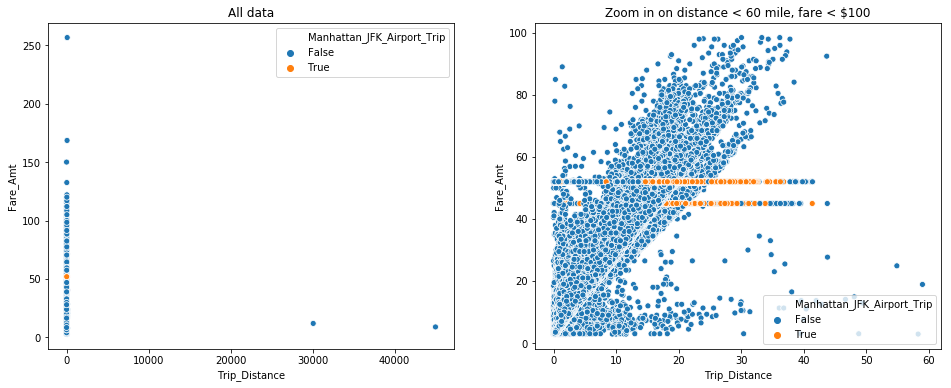

In [76]:
# scatter plot distance - fare
fig, axs = plt.subplots(1, 2, figsize=(16,6))
sns.scatterplot(data=gdf_sorted,x="Trip_Distance", y="Fare_Amt",ax=axs[0],hue="Manhattan_JFK_Airport_Trip")
axs[0].set_xlabel('Trip_Distance')
axs[0].set_ylabel('Fare_Amt')
axs[0].set_title('All data')

# zoom in on part of data
idx = (gdf_sorted.Trip_Distance < 60) & (gdf_sorted.Fare_Amt < 100)
sns.scatterplot(data=gdf_sorted,x=gdf_sorted[idx].Trip_Distance, y=gdf_sorted[idx].Fare_Amt,ax=axs[1],hue="Manhattan_JFK_Airport_Trip")
axs[1].set_xlabel('Trip_Distance')
axs[1].set_ylabel('Fare_Amt')
axs[1].set_title('Zoom in on distance < 60 mile, fare < $100');

### What about the 2 Outlier Cases?
#### 1. Short Distances and High Fare Amount.
#### 2. Long Distances and Low Fare Amount.
#### Idea: Taxi Mileage= Initial Charge + Distance Charge + Time Charge
#### Initial Charge= 2.5 Dollars, Distance Charge= 50 Cents per 1/5 Miles , Time Charge= 50 Cents per 60 seconds in slow traffic or when the vehicle is stopped
#### ->Fares should be at least Formula: 2.5 Dollars+ 2.5 Dollars per Mile, but different Times means differen Fare Structure
#### -> Fares should be not too much higher or lower than Formula: 2.5 Dollars+ 2.5 Dollars per Mile 
#### For more Information go to [Taxi Fare](https://www1.nyc.gov/site/tlc/passengers/taxi-fare.page)
#### Need to find better Solution.....

### Check those 2 Outliers in more Detail

In [77]:
# First create a Column with Duration of Ride
gdf_sorted['Trip_Duration'] = (gdf_sorted['Dropoff_DateTime'] - gdf_sorted['Pickup_DateTime'])
gdf_sorted['Trip_Duration_Seconds'] = gdf_sorted['Trip_Duration'].dt.total_seconds()
gdf_sorted['Trip_Duration_Minutes'] = gdf_sorted['Trip_Duration'].dt.total_seconds()//60

#### Short Distances with High Fare Amount

In [78]:
#2.Short Distances with High Fare Amount ( Fare Amount > 52 & Trip Distance <=9)
gdf_sorted.loc[(gdf_sorted["Fare_Amt"]>52) & (gdf_sorted["Trip_Distance"]<=9)]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Trip_Duration,Trip_Duration_Seconds,Trip_Duration_Minutes
index,,,,,,,,,,,,,,,,,,,,,,,
60163,2009-05-01 19:13:26,2009-05-01 19:19:23,1,1.099609,-73.989014,40.756660,0,65.00000,POINT (-73.989013671875 40.75666046142578),Garment District,100,Manhattan,-73.977516,40.764385,POINT (-73.97751617431641 40.76438522338867),Midtown North,163,Manhattan,False,False,00:05:57,357.0,5.0
160946,2009-07-03 04:56:15,2009-07-03 04:56:52,1,1.000000,-73.969063,40.757359,0,150.00000,POINT (-73.96906280517578 40.75735855102539),Sutton Place/Turtle Bay North,229,Manhattan,-73.970711,40.758369,POINT (-73.97071075439453 40.75836944580078),Midtown East,162,Manhattan,False,False,00:00:37,37.0,0.0
246004,2009-10-30 17:02:00,2009-10-30 17:03:00,1,0.300049,-73.802048,40.675091,0,85.00000,POINT (-73.80204772949219 40.67509078979492),South Ozone Park,216,Queens,-73.801788,40.674549,POINT (-73.80178833007813 40.6745491027832),South Ozone Park,216,Queens,False,False,00:01:00,60.0,1.0
90479,2009-11-21 04:39:00,2009-11-21 04:40:00,1,0.219971,-73.997948,40.760757,0,78.00000,POINT (-73.99794769287109 40.76075744628906),Clinton West,50,Manhattan,-74.000381,40.762489,POINT (-74.00038146972656 40.76248931884766),Clinton West,50,Manhattan,False,False,00:01:00,60.0,1.0
63891,2009-12-22 11:08:00,2009-12-22 11:43:00,1,1.610352,-73.981674,40.737186,3,52.68750,POINT (-73.98167419433594 40.73718643188477),Gramercy,107,Manhattan,-74.182541,40.687748,POINT (-74.18254089355469 40.68774795532227),Newark Airport,1,EWR,True,False,00:35:00,2100.0,35.0
380293,2010-01-08 01:35:00,2010-01-08 01:36:00,1,0.189941,-73.989716,40.729847,1,53.00000,POINT (-73.98971557617188 40.7298469543457),East Village,79,Manhattan,-73.989944,40.729477,POINT (-73.98994445800781 40.72947692871094),East Village,79,Manhattan,False,False,00:01:00,60.0,1.0
324500,2010-06-14 15:43:00,2010-06-14 16:13:00,1,1.860352,-74.011131,40.724598,3,55.50000,POINT (-74.01113128662109 40.7245979309082),TriBeCa/Civic Center,231,Manhattan,-74.177711,40.690277,POINT (-74.17771148681641 40.69027709960938),Newark Airport,1,EWR,True,False,00:30:00,1800.0,30.0
729398,2011-01-12 16:06:00,2011-01-12 16:34:00,1,1.870117,-73.987221,40.758018,3,55.90625,POINT (-73.98722076416016 40.75801849365234),Times Sq/Theatre District,230,Manhattan,-74.185341,40.690891,POINT (-74.18534088134766 40.69089126586914),Newark Airport,1,EWR,True,False,00:28:00,1680.0,28.0
724182,2011-01-26 11:48:00,2011-01-26 12:42:00,1,2.660156,-73.871193,40.773640,3,76.31250,POINT (-73.87119293212891 40.77363967895508),LaGuardia Airport,138,Queens,-74.176743,40.694389,POINT (-74.17674255371094 40.69438934326172),Newark Airport,1,EWR,True,False,00:54:00,3240.0,54.0


#### Observation:
#### 1. Most of the Rides have the RateCodeID=1
#### 2. Sometimes the Trip_Distance doesn't make sense like the Distance between Midtown North Manhattan to Newark Airport are 3 Miles? -> Taxi Finder but says 17.3 Miles
#### 3. That means some Trip_Distances are wrong

In [79]:
#Check how many Percent has RateCodeID=5 and so on
High_Fare_Amt_Short_Distance=gdf_sorted.loc[(gdf_sorted["Fare_Amt"]>52) & (gdf_sorted["Trip_Distance"]<=9)]
print(str(len(High_Fare_Amt_Short_Distance.loc[High_Fare_Amt_Short_Distance["RateCodeID"]==5])/len(High_Fare_Amt_Short_Distance)*100) + " "+ "Percent"+ " "+ "are RateCodeID 5")
print(str(len(High_Fare_Amt_Short_Distance.loc[High_Fare_Amt_Short_Distance["RateCodeID"]==1])/len(High_Fare_Amt_Short_Distance)*100) + " "+ "Percent"+ " "+ "are RateCodeID 1")
print(str(len(High_Fare_Amt_Short_Distance.loc[High_Fare_Amt_Short_Distance["RateCodeID"]==0])/len(High_Fare_Amt_Short_Distance)*100) + " "+ "Percent"+ " "+ "are RateCodeID 0")
print(str(len(High_Fare_Amt_Short_Distance.loc[High_Fare_Amt_Short_Distance["RateCodeID"]==3])/len(High_Fare_Amt_Short_Distance)*100) + " "+ "Percent"+ " "+ "are RateCodeID 3")

0.0 Percent are RateCodeID 5
60.46511627906976 Percent are RateCodeID 1
9.30232558139535 Percent are RateCodeID 0
30.23255813953488 Percent are RateCodeID 3


In [80]:
# Look into Dataframe with RateCodeID=1
High_Fare_Amt_Short_Distance.loc[High_Fare_Amt_Short_Distance["RateCodeID"]==1]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Trip_Duration,Trip_Duration_Seconds,Trip_Duration_Minutes
index,,,,,,,,,,,,,,,,,,,,,,,
380293,2010-01-08 01:35:00,2010-01-08 01:36:00,1,0.189941,-73.989716,40.729847,1,53.00000,POINT (-73.98971557617188 40.7298469543457),East Village,79,Manhattan,-73.989944,40.729477,POINT (-73.98994445800781 40.72947692871094),East Village,79,Manhattan,False,False,00:01:00,60.0,1.0
746618,2011-10-01 18:46:00,2011-10-01 19:35:00,1,2.619141,-73.776749,40.645355,1,56.90625,POINT (-73.77674865722656 40.64535522460938),JFK Airport,132,Queens,-74.107002,40.638706,POINT (-74.10700225830078 40.63870620727539),West Brighton,245,Staten Island,True,False,00:49:00,2940.0,49.0
861593,2012-10-31 07:01:35,2012-10-31 08:44:48,2,7.601562,-73.863960,40.730946,1,58.50000,POINT (-73.86396026611328 40.7309455871582),Rego Park,196,Queens,-73.960480,40.773884,POINT (-73.96047973632813 40.77388381958008),Upper East Side South,237,Manhattan,False,False,01:43:13,6193.0,103.0
954353,2012-10-31 08:41:11,2012-10-31 10:24:50,2,4.500000,-73.955704,40.781952,1,57.00000,POINT (-73.95570373535156 40.78195190429688),Upper East Side North,236,Manhattan,-73.990555,40.746807,POINT (-73.99055480957031 40.74680709838867),Penn Station/Madison Sq West,186,Manhattan,False,False,01:43:39,6219.0,103.0
818619,2012-10-31 14:13:00,2012-10-31 15:52:00,5,4.160156,-73.915680,40.743202,1,53.00000,POINT (-73.91567993164063 40.74320220947266),Sunnyside,226,Queens,-73.980408,40.760849,POINT (-73.98040771484375 40.76084899902344),Times Sq/Theatre District,230,Manhattan,False,False,01:39:00,5940.0,99.0
822624,2012-11-01 08:22:08,2012-11-01 10:05:12,1,6.398438,-73.915924,40.743122,1,61.50000,POINT (-73.91592407226563 40.74312210083008),Sunnyside,226,Queens,-73.912552,40.804989,POINT (-73.91255187988281 40.80498886108398),Mott Haven/Port Morris,168,Bronx,False,False,01:43:04,6184.0,103.0
996119,2012-11-07 18:22:40,2012-11-07 20:11:59,1,4.101562,-73.989471,40.759628,1,70.00000,POINT (-73.98947143554688 40.75962829589844),Clinton East,48,Manhattan,-73.941597,40.793613,POINT (-73.94159698486328 40.79361343383789),East Harlem North,74,Manhattan,False,False,01:49:19,6559.0,109.0
895198,2012-12-10 15:06:00,2012-12-10 15:54:00,3,1.900391,-73.789963,40.644012,1,55.50000,POINT (-73.78996276855469 40.64401245117188),JFK Airport,132,Queens,-74.001862,40.611557,POINT (-74.00186157226563 40.61155700683594),Bensonhurst West,22,Brooklyn,True,False,00:48:00,2880.0,48.0
1240268,2013-01-20 18:01:00,2013-01-20 18:40:00,1,2.599609,-73.781944,40.644855,1,69.00000,POINT (-73.78194427490234 40.64485549926758),JFK Airport,132,Queens,-74.103340,40.576454,POINT (-74.10334014892578 40.57645416259766),New Dorp/Midland Beach,172,Staten Island,True,False,00:39:00,2340.0,39.0


#### Observation:
#### 1. Most Trips have high Trip_Duration
#### 2. Longer Distances doesn't always mean higher Trip_Duration
#### 3. Sometimes even though the Trip_Distance is shorter, it takes longer than a longer Trip_Distance
#### 4. Sometimes a shorter Trip_Distance has more Fare_Amount, because his Trip_Duration is longer -> More Traffic
#### 5. Sometimes a shorter Trip_Distance has more Fare_Amount, because his Trip_Duration is shorter 

In [81]:
#1. Plot on Map to see where does these Trips happen
High_Fare_Amt_Short_Distance=gdf_sorted.loc[(gdf_sorted["Fare_Amt"]>52) & (gdf_sorted["Trip_Distance"]<=11)]

High_Fare_Amt_Short_Distance_Pickup=High_Fare_Amt_Short_Distance[['Pickup_Lat','Pickup_Lon']]
High_Fare_Amt_Short_Distance_Dropoff=High_Fare_Amt_Short_Distance[['Dropoff_Lat','Dropoff_Lon']]

In [82]:
########################Lat,Lon#################################
m_High_Fare_Amt_Short_Distance = folium.Map(location=[40.730610, -73.935242])

for row in High_Fare_Amt_Short_Distance_Pickup.itertuples(index=False):

    folium.CircleMarker(
        location=[row[0],row[1]],
        radius=1,
        color="green",
        fill=True,
        fill_opacity=0.5
    ).add_to(m_High_Fare_Amt_Short_Distance)
    
for row in High_Fare_Amt_Short_Distance_Dropoff.itertuples(index=False):

    folium.CircleMarker(
        location=[row[0],row[1]],
        radius=1,
        color="red",
        fill=True,
        fill_opacity=0.5
    ).add_to(m_High_Fare_Amt_Short_Distance)

In [83]:
m_High_Fare_Amt_Short_Distance

#### Observation:
#### 1.Most of the Short Distances with High Fare Amount are in Area of Lower and Midtown Manhattan
#### 2. But also at the Airports are a high Density of Pickups and Dropoffs
#### 3. There are more Dropoffs than Pickups in Brooklyn
#### 4. There are Dropoffs mostly in Newark Airport

#### Long Distances with small Fare Amount

In [84]:
#1.Long Distances with low Fare Amount ( Fare Amount < 40 & Trip Distance >= 20)
gdf_sorted.loc[(gdf_sorted["Fare_Amt"]<45) & (gdf_sorted["Trip_Distance"]>=20)]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Trip_Duration,Trip_Duration_Seconds,Trip_Duration_Minutes
index,,,,,,,,,,,,,,,,,,,,,,,
61552,2009-01-05 02:44:15,2009-01-05 02:58:30,1,30.406250,-73.983620,40.760353,0,3.000000,POINT (-73.98361968994141 40.76035308837891),Times Sq/Theatre District,230,Manhattan,-73.958366,40.768974,POINT (-73.95836639404297 40.76897430419922),Lenox Hill West,141,Manhattan,False,False,00:14:15,855.0,14.0
71055,2009-01-26 23:43:32,2009-01-27 00:07:43,1,20.000000,-73.784248,40.648632,0,43.812500,POINT (-73.78424835205078 40.64863204956055),JFK Airport,132,Queens,-73.955109,40.694302,POINT (-73.95510864257813 40.69430160522461),Bedford,17,Brooklyn,True,False,00:24:11,1451.0,24.0
148051,2009-02-12 23:06:47,2009-02-12 23:30:04,1,39.500000,-73.983521,40.768417,0,3.000000,POINT (-73.9835205078125 40.76841735839844),Lincoln Square East,142,Manhattan,-73.989807,40.725479,POINT (-73.98980712890625 40.72547912597656),East Village,79,Manhattan,False,False,00:23:17,1397.0,23.0
112471,2009-02-15 23:58:25,2009-02-16 00:23:21,1,20.000000,-73.786880,40.641609,0,43.812500,POINT (-73.78688049316406 40.64160919189453),JFK Airport,132,Queens,-74.038620,40.618015,POINT (-74.03861999511719 40.61801528930664),Bay Ridge,14,Brooklyn,True,False,00:24:56,1496.0,24.0
63265,2009-02-21 23:35:20,2009-02-22 04:47:44,1,48.812500,-73.994202,40.751232,0,3.000000,POINT (-73.99420166015625 40.7512321472168),East Chelsea,68,Manhattan,-73.941185,40.669334,POINT (-73.94118499755859 40.66933441162109),Crown Heights North,61,Brooklyn,False,False,05:12:24,18744.0,312.0
13726,2009-02-25 19:14:00,2009-02-25 19:45:00,1,20.265625,-73.789719,40.643047,0,44.500000,POINT (-73.78971862792969 40.64304733276367),JFK Airport,132,Queens,-73.991379,40.683884,POINT (-73.99137878417969 40.68388366699219),Boerum Hill,25,Brooklyn,True,False,00:31:00,1860.0,31.0
122566,2009-03-10 23:01:35,2009-03-10 23:27:35,1,20.203125,-73.782104,40.644779,0,44.187500,POINT (-73.7821044921875 40.64477920532227),JFK Airport,132,Queens,-73.847733,40.891045,POINT (-73.84773254394531 40.89104461669922),Woodlawn/Wakefield,259,Bronx,True,False,00:26:00,1560.0,26.0
79138,2009-04-15 16:35:00,2009-04-15 17:09:00,5,20.546875,-73.781906,40.644814,0,44.500000,POINT (-73.78190612792969 40.64481353759766),JFK Airport,132,Queens,-73.907310,40.846783,POINT (-73.90731048583984 40.84678268432617),Mount Hope,169,Bronx,True,False,00:34:00,2040.0,34.0
176931,2009-05-02 01:10:17,2009-05-02 01:34:26,1,20.093750,-73.781807,40.644814,0,42.906250,POINT (-73.78180694580078 40.64481353759766),JFK Airport,132,Queens,-73.910622,40.848488,POINT (-73.91062164306641 40.84848785400391),Mount Hope,169,Bronx,True,False,00:24:09,1449.0,24.0


#### Observation:
#### 1. Most of the Trips have the RateCodeID=1

In [85]:
#Check how many Percent has RateCodeID=5 and so on
Small_Fare_Amt_High_Distance=gdf_sorted.loc[(gdf_sorted["Fare_Amt"]<45) & (gdf_sorted["Trip_Distance"]>=20)]
print(str(len(Small_Fare_Amt_High_Distance.loc[Small_Fare_Amt_High_Distance["RateCodeID"]==5])/len(Small_Fare_Amt_High_Distance)*100) + " "+ "Percent"+ " "+ "are RateCodeID 5")
print(str(len(Small_Fare_Amt_High_Distance.loc[Small_Fare_Amt_High_Distance["RateCodeID"]==1])/len(Small_Fare_Amt_High_Distance)*100) + " "+ "Percent"+ " "+ "are RateCodeID 1")
print(str(len(Small_Fare_Amt_High_Distance.loc[Small_Fare_Amt_High_Distance["RateCodeID"]==0])/len(Small_Fare_Amt_High_Distance)*100) + " "+ "Percent"+ " "+ "are RateCodeID 0")
print(str(len(Small_Fare_Amt_High_Distance.loc[Small_Fare_Amt_High_Distance["RateCodeID"]==3])/len(Small_Fare_Amt_High_Distance)*100) + " "+ "Percent"+ " "+ "are RateCodeID 3")
print(str(len(Small_Fare_Amt_High_Distance.loc[Small_Fare_Amt_High_Distance["RateCodeID"]==6])/len(Small_Fare_Amt_High_Distance)*100) + " "+ "Percent"+ " "+ "are RateCodeID 6")

0.0 Percent are RateCodeID 5
81.03448275862068 Percent are RateCodeID 1
17.81609195402299 Percent are RateCodeID 0
0.5747126436781609 Percent are RateCodeID 3
0.0 Percent are RateCodeID 6


#### Looking into Dataframe with RateCodeID 1 and Small Fare with High Distance Trip

In [86]:
Small_Fare_Amt_High_Distance.loc[Small_Fare_Amt_High_Distance["RateCodeID"]==1]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Trip_Duration,Trip_Duration_Seconds,Trip_Duration_Minutes
index,,,,,,,,,,,,,,,,,,,,,,,
184190,2009-10-09 22:28:00,2009-10-09 22:57:00,4,20.140625,-73.871033,40.773762,1,44.09375,POINT (-73.87103271484375 40.77376174926758),LaGuardia Airport,138,Queens,-73.911972,40.609913,POINT (-73.91197204589844 40.60991287231445),Marine Park/Mill Basin,155,Brooklyn,True,False,00:29:00,1740.0,29.0
452863,2010-01-22 22:52:00,2010-01-22 23:21:00,2,20.375000,-73.982430,40.692123,1,44.50000,POINT (-73.98242950439453 40.69212341308594),Downtown Brooklyn/MetroTech,65,Brooklyn,-73.881241,40.873810,POINT (-73.88124084472656 40.87380981445313),Norwood,174,Bronx,False,False,00:29:00,1740.0,29.0
497708,2010-01-24 18:10:00,2010-01-24 18:40:00,1,20.640625,-73.776794,40.645340,1,44.90625,POINT (-73.77679443359375 40.64533996582031),JFK Airport,132,Queens,-74.035942,40.622383,POINT (-74.03594207763672 40.62238311767578),Bay Ridge,14,Brooklyn,True,False,00:30:00,1800.0,30.0
265761,2010-02-17 22:03:00,2010-02-17 22:34:00,2,20.765625,-73.776695,40.645275,1,44.90625,POINT (-73.77669525146484 40.6452751159668),JFK Airport,132,Queens,-73.963043,40.717266,POINT (-73.96304321289063 40.71726608276367),Williamsburg (North Side),255,Brooklyn,True,False,00:31:00,1860.0,31.0
435832,2010-03-28 06:42:00,2010-03-28 07:09:00,2,20.875000,-73.999855,40.743378,1,44.90625,POINT (-73.99985504150391 40.74337768554688),Flatiron,90,Manhattan,-73.800606,40.669762,POINT (-73.80060577392578 40.66976165771484),Baisley Park,10,Queens,False,False,00:27:00,1620.0,27.0
414471,2010-03-28 21:37:00,2010-03-28 22:08:00,2,20.562500,-73.788811,40.642105,1,44.09375,POINT (-73.78881072998047 40.64210510253906),JFK Airport,132,Queens,-73.995750,40.680035,POINT (-73.99575042724609 40.68003463745117),Carroll Gardens,40,Brooklyn,True,False,00:31:00,1860.0,31.0
451675,2010-03-29 04:49:00,2010-03-29 05:16:00,1,20.437500,-73.816101,40.702812,1,44.50000,POINT (-73.81610107421875 40.70281219482422),Briarwood/Jamaica Hills,28,Queens,-73.844971,40.877846,POINT (-73.844970703125 40.87784576416016),Eastchester,81,Bronx,False,False,00:27:00,1620.0,27.0
285177,2010-03-29 22:07:00,2010-03-29 22:46:00,3,20.125000,-73.786743,40.640007,1,44.90625,POINT (-73.7867431640625 40.64000701904297),JFK Airport,132,Queens,-73.905220,40.828827,POINT (-73.90522003173828 40.82882690429688),Morrisania/Melrose,167,Bronx,True,False,00:39:00,2340.0,39.0
343626,2010-04-25 04:11:00,2010-04-25 04:43:00,2,20.984375,-73.781502,40.644802,1,44.90625,POINT (-73.78150177001953 40.64480209350586),JFK Airport,132,Queens,-73.992668,40.681198,POINT (-73.99266815185547 40.68119812011719),Carroll Gardens,40,Brooklyn,True,False,00:32:00,1920.0,32.0


In [87]:
#1. Plot on Map to see where does these Trips happen
Small_Fare_Amt_High_Distance=gdf_sorted.loc[(gdf_sorted["Fare_Amt"]<45) & (gdf_sorted["Trip_Distance"]>=20)]

Small_Fare_Amt_High_Distance_Pickup=Small_Fare_Amt_High_Distance[['Pickup_Lat','Pickup_Lon']]
Small_Fare_Amt_High_Distance_Dropoff=Small_Fare_Amt_High_Distance[['Dropoff_Lat','Dropoff_Lon']]

In [88]:
########################Lat,Lon#################################
m_Small_Fare_Amt_High_Distance = folium.Map(location=[40.730610, -73.935242])

for row in Small_Fare_Amt_High_Distance_Pickup.itertuples(index=False):

    folium.CircleMarker(
        location=[row[0],row[1]],
        radius=1,
        color="green",
        fill=True,
        fill_opacity=0.5
    ).add_to(m_Small_Fare_Amt_High_Distance)
    
for row in Small_Fare_Amt_High_Distance_Dropoff.itertuples(index=False):

    folium.CircleMarker(
        location=[row[0],row[1]],
        radius=1,
        color="red",
        fill=True,
        fill_opacity=0.5
    ).add_to(m_Small_Fare_Amt_High_Distance)

In [89]:
m_Small_Fare_Amt_High_Distance

#### Observation:
#### 1.Most of the Long Distances with Small Fare Amount are in Area of Lower and Midtown Manhattan
#### 2. But also at the Airports are a high Density of Pickups and Dropoffs
#### 3. There are more Dropoffs than Pickups in Brooklyn

### How many Datapoints remain?

In [90]:
origin_length=2000000
print(str(len(gdf_sorted)/origin_length*100) + " " + "%")

95.66409999999999 %


### How many Datapoints contains the RateCodeID 0? -> because after the Data Cleaning they must be RateCodeID 1

In [91]:
RateCodeID_equals_zero=gdf_sorted.loc[gdf_sorted["RateCodeID"]==0]
RateCodeID_equals_zero

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Trip_Duration,Trip_Duration_Seconds,Trip_Duration_Minutes
index,,,,,,,,,,,,,,,,,,,,,,,
110742,2009-01-01 00:15:31,2009-01-01 00:26:47,4,4.398438,-73.961845,40.800648,0,13.000000,POINT (-73.96184539794922 40.8006477355957),Bloomingdale,24,Manhattan,-73.936188,40.848152,POINT (-73.93618774414063 40.84815216064453),Washington Heights South,244,Manhattan,False,False,00:11:16,676.0,11.0
107744,2009-01-01 00:18:28,2009-01-01 00:26:30,4,2.300781,-73.975883,40.775955,0,8.203125,POINT (-73.97588348388672 40.77595520019531),Central Park,43,Manhattan,-73.964355,40.804085,POINT (-73.96435546875 40.80408477783203),Morningside Heights,166,Manhattan,False,False,00:08:02,482.0,8.0
210569,2009-01-01 00:19:58,2009-01-01 00:27:00,2,1.000000,-73.959457,40.767616,0,5.699219,POINT (-73.95945739746094 40.76761627197266),Lenox Hill West,141,Manhattan,-73.961426,40.777248,POINT (-73.96142578125 40.77724838256836),Upper East Side North,236,Manhattan,False,False,00:07:02,422.0,7.0
241310,2009-01-01 00:20:22,2009-01-01 00:34:22,1,1.200195,-73.992119,40.748291,0,9.000000,POINT (-73.99211883544922 40.748291015625),Penn Station/Madison Sq West,186,Manhattan,-73.977127,40.743259,POINT (-73.97712707519531 40.74325942993164),Kips Bay,137,Manhattan,False,False,00:14:00,840.0,14.0
123511,2009-01-01 00:20:27,2009-01-01 00:22:31,2,0.399902,-73.979027,40.777214,0,3.300781,POINT (-73.97902679443359 40.77721405029297),Lincoln Square East,142,Manhattan,-73.979668,40.773609,POINT (-73.97966766357422 40.77360916137695),Lincoln Square East,142,Manhattan,False,False,00:02:04,124.0,2.0
58781,2009-01-01 00:20:31,2009-01-01 00:35:57,1,3.099609,-73.973984,40.751244,0,11.398438,POINT (-73.97398376464844 40.75124359130859),UN/Turtle Bay South,233,Manhattan,-73.999573,40.719433,POINT (-73.99957275390625 40.71943283081055),Little Italy/NoLiTa,144,Manhattan,False,False,00:15:26,926.0,15.0
103740,2009-01-01 00:21:33,2009-01-01 00:28:31,1,1.000000,-73.975723,40.744865,0,6.199219,POINT (-73.97572326660156 40.74486541748047),Murray Hill,170,Manhattan,-73.969849,40.751698,POINT (-73.9698486328125 40.7516975402832),UN/Turtle Bay South,233,Manhattan,False,False,00:06:58,418.0,6.0
234,2009-01-01 00:22:24,2009-01-01 00:47:14,1,4.101562,-73.978012,40.725197,0,15.796875,POINT (-73.97801208496094 40.72519683837891),Alphabet City,4,Manhattan,-73.987656,40.760220,POINT (-73.98765563964844 40.76021957397461),Clinton East,48,Manhattan,False,False,00:24:50,1490.0,24.0
205837,2009-01-01 00:24:21,2009-01-01 00:35:37,2,3.000000,-73.989807,40.739082,0,10.203125,POINT (-73.98980712890625 40.73908233642578),Union Sq,234,Manhattan,-74.016190,40.706070,POINT (-74.01618957519531 40.70606994628906),World Trade Center,261,Manhattan,False,False,00:11:16,676.0,11.0


In [92]:
print(str(len(gdf_sorted.loc[(gdf_sorted["RateCodeID"]==0)])/len(gdf_sorted)*100)+ " " +"% have RateCodeID 0")

12.000112895014952 % have RateCodeID 0


#### Replace all RateCodeID=0 with RateCodeID=1

In [93]:
gdf_sorted.loc[(gdf_sorted["RateCodeID"]==0),["RateCodeID"]]=1

#### Proof that there is no RateCodeID equals Zero anymore

In [94]:
gdf_sorted.loc[gdf_sorted["RateCodeID"]==0]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Trip_Duration,Trip_Duration_Seconds,Trip_Duration_Minutes
index,,,,,,,,,,,,,,,,,,,,,,,


### Are the Trip_Distance really True?
#### Strategy: We use the Haversine distance to compute the line between two Coordinates on Sphere.
#### For more Information go to [Haversine Distance](https://en.wikipedia.org/wiki/Haversine_formula)
#### The end Units will be in km, so in the end we have to convert it back to miles

#### Is Trip_Distance smaller or equals Haversine? -> yes -> Is Fare_Amt smaller or equals computed_harvesine_Fare? ->yes -> Fare_Amt=computed haversine Fare
#### Is Trip_Distance smaller or equals Haversine? -> yes -> Is Fare_Amt bigger than computed_harvesine_Fare? ok
#### Is Trip_Distance smaller or equals Haversine? -> no -> Is Fare_Amt smaller or equals computed normal Fare? -> yes -> Fare_Amt= computed normal Fare
#### Is Trip_Distance smaller or equals Haversine? -> no -> Is Fare_Amt smaller or equals computed normal Fare? -> no -> ok

In [95]:
# Radius of the earth in kilometers
R = 6378
# conversion factor for miles
conv_fac = 0.621371

def haversine(lon1, lat1, lon2, lat2):
    """
    Calculate the great circle distance between two points
    on the earth (specified in decimal degrees)

    All args must be of equal length.    
    
    source: https://stackoverflow.com/a/29546836

    """
    # Convert latitude and longitude to radians
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])

    # Find the differences
    dlon = lon2 - lon1
    dlat = lat2 - lat1

    # Apply the formula 
    a = np.sin(dlat/2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2.0)**2
    # Calculate the angle (in radians)
    c = 2 * np.arcsin(np.sqrt(a))
    # Convert to kilometers
    km = R * c

    # calculate miles
    miles = km * conv_fac
    
    return miles

In [96]:
#compute Haversine Distance
gdf_sorted['computed_haversine'] =  haversine(gdf_sorted['Pickup_Lon'], gdf_sorted['Pickup_Lat'],gdf_sorted['Dropoff_Lon'], gdf_sorted['Dropoff_Lat']) 
#compute new Fare Amount with Trip_Distance
gdf_sorted["Calculated_Fare_Amt_normal"]=0.0
gdf_sorted["Calculated_Fare_Amt_normal"]=2.5+2.5*gdf_sorted["Trip_Distance"]
#compute new Fare Amount with Haversine Distance
gdf_sorted["Calculated_Fare_Amt_haversine"]=0.0
gdf_sorted["Calculated_Fare_Amt_haversine"]=2.5+2.5*gdf_sorted["computed_haversine"]

### Check how many Rows the Trip_Distance is smaller than the Haversine Distance

In [97]:
print(str(len(gdf_sorted.loc[(gdf_sorted["Trip_Distance"]<=gdf_sorted["computed_haversine"])]) / len(gdf_sorted)*100) + " "+ "% are lower than Harversine Distance")

5.855331310282541 % are lower than Harversine Distance


In [98]:
gdf_sorted.loc[(gdf_sorted["Trip_Distance"]<=gdf_sorted["computed_haversine"])]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Trip_Duration,Trip_Duration_Seconds,Trip_Duration_Minutes,computed_haversine,Calculated_Fare_Amt_normal,Calculated_Fare_Amt_haversine
index,,,,,,,,,,,,,,,,,,,,,,,,,,
13743,2009-01-01 01:25:51,2009-01-01 01:27:10,1,0.500000,-73.967987,40.792103,1,3.800781,POINT (-73.96798706054688 40.7921028137207),Upper West Side North,238,Manhattan,-73.972916,40.785404,POINT (-73.97291564941406 40.78540420532227),Upper West Side South,239,Manhattan,False,False,00:01:19,79.0,1.0,0.530559,3.750000,3.826399
122748,2009-01-01 01:57:44,2009-01-01 02:03:17,1,1.000000,-73.959175,40.814579,1,5.300781,POINT (-73.95917510986328 40.81457901000977),Morningside Heights,166,Manhattan,-73.970665,40.798561,POINT (-73.97066497802734 40.79856109619141),Manhattan Valley,151,Manhattan,False,False,00:05:33,333.0,5.0,1.260616,5.000000,5.651540
74032,2009-01-01 02:29:55,2009-01-01 02:32:00,1,0.300049,-73.996941,40.757675,1,3.800781,POINT (-73.99694061279297 40.75767517089844),West Chelsea/Hudson Yards,246,Manhattan,-73.994080,40.761700,POINT (-73.99407958984375 40.76169967651367),Clinton West,50,Manhattan,False,False,00:02:05,125.0,2.0,0.316092,3.250122,3.290230
167194,2009-01-01 03:08:55,2009-01-01 03:11:57,4,0.399902,-73.949867,40.705235,1,4.199219,POINT (-73.94986724853516 40.70523452758789),South Williamsburg,217,Brooklyn,-73.957886,40.708492,POINT (-73.9578857421875 40.70849227905273),Williamsburg (South Side),256,Brooklyn,False,False,00:03:02,182.0,3.0,0.477036,3.499756,3.692589
204685,2009-01-01 04:31:50,2009-01-01 04:44:40,1,4.898438,-73.984756,40.745270,1,15.000000,POINT (-73.98475646972656 40.74526977539063),Midtown South,164,Manhattan,-73.939606,40.808647,POINT (-73.93960571289063 40.80864715576172),Central Harlem North,42,Manhattan,False,False,00:12:50,770.0,12.0,4.980917,14.746094,14.952293
105778,2009-01-01 06:41:10,2009-01-01 07:02:49,1,1.200195,-73.988457,40.721607,1,6.101562,POINT (-73.98845672607422 40.72160720825195),Lower East Side,148,Manhattan,-74.004684,40.751976,POINT (-74.00468444824219 40.75197601318359),West Chelsea/Hudson Yards,246,Manhattan,False,False,00:21:39,1299.0,21.0,2.266136,5.500488,8.165340
31768,2009-01-01 08:10:09,2009-01-01 08:18:45,3,2.400391,-73.973755,40.794605,1,8.500000,POINT (-73.9737548828125 40.79460525512695),Upper West Side North,238,Manhattan,-73.996185,40.763882,POINT (-73.99618530273438 40.76388168334961),Clinton West,50,Manhattan,False,False,00:08:36,516.0,8.0,2.428373,8.500977,8.570933
242378,2009-01-01 10:15:35,2009-01-01 10:18:43,1,1.299805,-73.961037,40.760746,1,4.898438,POINT (-73.96103668212891 40.76074600219727),Lenox Hill East,140,Manhattan,-73.948761,40.777924,POINT (-73.94876098632813 40.77792358398438),Yorkville West,263,Manhattan,False,False,00:03:08,188.0,3.0,1.351164,5.749512,5.877910
135478,2009-01-01 11:39:07,2009-01-01 11:39:57,1,0.199951,-73.965935,40.753990,1,2.900391,POINT (-73.96593475341797 40.75399017333984),Sutton Place/Turtle Bay North,229,Manhattan,-73.963989,40.757118,POINT (-73.9639892578125 40.75711822509766),Sutton Place/Turtle Bay North,229,Manhattan,False,False,00:00:50,50.0,0.0,0.239211,2.999878,3.098027


#### Decision: change those false Entry to Haversine Value

In [99]:
# Change Trip_Distance to Haversine Distance , if they are smaller
gdf_sorted["is_Haversine_Distance"]=False
gdf_sorted.loc[(gdf_sorted["Trip_Distance"]<=gdf_sorted["computed_haversine"]),["is_Haversine_Distance"]]=True
gdf_sorted.loc[(gdf_sorted["Trip_Distance"]<=gdf_sorted["computed_haversine"]),["Trip_Distance"]]=gdf_sorted["computed_haversine"]

### Check how many Rows the Trip_Distance is smaller than the Haversine Distance & Fare Amount is smaller than computed haversine Fare

In [100]:
print(str(len(gdf_sorted.loc[(gdf_sorted["is_Haversine_Distance"]==True) & (gdf_sorted["Fare_Amt"]<=gdf_sorted["Calculated_Fare_Amt_haversine"])]) / len(gdf_sorted)*100) + " "+ "% are lower than Harversine Distance and computed Haversine Fare")

1.7994210994511002 % are lower than Harversine Distance and computed Haversine Fare


In [101]:
gdf_sorted.loc[(gdf_sorted["is_Haversine_Distance"]==True) & (gdf_sorted["Fare_Amt"]<=gdf_sorted["Calculated_Fare_Amt_haversine"])]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Trip_Duration,Trip_Duration_Seconds,Trip_Duration_Minutes,computed_haversine,Calculated_Fare_Amt_normal,Calculated_Fare_Amt_haversine,is_Haversine_Distance
index,,,,,,,,,,,,,,,,,,,,,,,,,,,
13743,2009-01-01 01:25:51,2009-01-01 01:27:10,1,0.530559,-73.967987,40.792103,1,3.800781,POINT (-73.96798706054688 40.7921028137207),Upper West Side North,238,Manhattan,-73.972916,40.785404,POINT (-73.97291564941406 40.78540420532227),Upper West Side South,239,Manhattan,False,False,00:01:19,79.0,1.0,0.530559,3.750000,3.826399,True
122748,2009-01-01 01:57:44,2009-01-01 02:03:17,1,1.260616,-73.959175,40.814579,1,5.300781,POINT (-73.95917510986328 40.81457901000977),Morningside Heights,166,Manhattan,-73.970665,40.798561,POINT (-73.97066497802734 40.79856109619141),Manhattan Valley,151,Manhattan,False,False,00:05:33,333.0,5.0,1.260616,5.000000,5.651540,True
105778,2009-01-01 06:41:10,2009-01-01 07:02:49,1,2.266136,-73.988457,40.721607,1,6.101562,POINT (-73.98845672607422 40.72160720825195),Lower East Side,148,Manhattan,-74.004684,40.751976,POINT (-74.00468444824219 40.75197601318359),West Chelsea/Hudson Yards,246,Manhattan,False,False,00:21:39,1299.0,21.0,2.266136,5.500488,8.165340,True
31768,2009-01-01 08:10:09,2009-01-01 08:18:45,3,2.428373,-73.973755,40.794605,1,8.500000,POINT (-73.9737548828125 40.79460525512695),Upper West Side North,238,Manhattan,-73.996185,40.763882,POINT (-73.99618530273438 40.76388168334961),Clinton West,50,Manhattan,False,False,00:08:36,516.0,8.0,2.428373,8.500977,8.570933,True
242378,2009-01-01 10:15:35,2009-01-01 10:18:43,1,1.351164,-73.961037,40.760746,1,4.898438,POINT (-73.96103668212891 40.76074600219727),Lenox Hill East,140,Manhattan,-73.948761,40.777924,POINT (-73.94876098632813 40.77792358398438),Yorkville West,263,Manhattan,False,False,00:03:08,188.0,3.0,1.351164,5.749512,5.877910,True
135478,2009-01-01 11:39:07,2009-01-01 11:39:57,1,0.239211,-73.965935,40.753990,1,2.900391,POINT (-73.96593475341797 40.75399017333984),Sutton Place/Turtle Bay North,229,Manhattan,-73.963989,40.757118,POINT (-73.9639892578125 40.75711822509766),Sutton Place/Turtle Bay North,229,Manhattan,False,False,00:00:50,50.0,0.0,0.239211,2.999878,3.098027,True
128155,2009-01-01 11:52:37,2009-01-01 11:56:39,1,1.383315,-73.979126,40.744904,1,5.300781,POINT (-73.9791259765625 40.74490356445313),Murray Hill,170,Manhattan,-73.965759,40.762150,POINT (-73.96575927734375 40.76214981079102),Lenox Hill West,141,Manhattan,False,False,00:04:02,242.0,4.0,1.383315,5.749512,5.958288,True
189834,2009-01-01 12:25:23,2009-01-01 12:27:57,2,1.349691,-73.974747,40.747540,1,4.898438,POINT (-73.97474670410156 40.74753952026367),Murray Hill,170,Manhattan,-73.986450,40.730156,POINT (-73.9864501953125 40.73015594482422),East Village,79,Manhattan,False,False,00:02:34,154.0,2.0,1.349691,5.749512,5.874227,True
113602,2009-01-01 12:44:00,2009-01-01 12:47:00,2,6.309884,-73.862061,40.830463,1,3.300781,POINT (-73.862060546875 40.83046340942383),Soundview/Bruckner,212,Bronx,-73.956657,40.773949,POINT (-73.95665740966797 40.77394866943359),Lenox Hill West,141,Manhattan,False,False,00:03:00,180.0,3.0,6.309884,3.425293,18.274710,True


#### Decision: change those false Entry to min. Value, because later on we still can get rid of it.

In [102]:
# Change Fare_Amt to computed_normal Fare when Fare_Amt is smaller or equals computed Fare normal
gdf_sorted["is_haversine_fare"]=False
gdf_sorted.loc[(gdf_sorted["is_Haversine_Distance"]==True)&(gdf_sorted["Fare_Amt"]<=gdf_sorted["Calculated_Fare_Amt_haversine"])  & (gdf_sorted["Manhattan_JFK_Airport_Trip"]!=True),["is_haversine_fare"]]=True
gdf_sorted.loc[(gdf_sorted["is_Haversine_Distance"]==True)&(gdf_sorted["Fare_Amt"]<=gdf_sorted["Calculated_Fare_Amt_haversine"])  & (gdf_sorted["Manhattan_JFK_Airport_Trip"]!=True),["Fare_Amt"]]=gdf_sorted["Calculated_Fare_Amt_haversine"]

### Check how many Rows the Trip_Distance is smaller than the Haversine Distance & Fare Amount is bigger than computed haversine Fare

In [103]:
print(str(len(gdf_sorted.loc[(gdf_sorted["is_Haversine_Distance"]==True) & (gdf_sorted["Fare_Amt"]>gdf_sorted["Calculated_Fare_Amt_haversine"])]) / len(gdf_sorted)*100) + " "+ "% are lower than Harversine Distance and bigger than computed Haversine Fare")

4.05591021083144 % are lower than Harversine Distance and bigger than computed Haversine Fare


In [104]:
gdf_sorted.loc[(gdf_sorted["is_Haversine_Distance"]==True) & (gdf_sorted["Fare_Amt"]>gdf_sorted["Calculated_Fare_Amt_haversine"])]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Trip_Duration,Trip_Duration_Seconds,Trip_Duration_Minutes,computed_haversine,Calculated_Fare_Amt_normal,Calculated_Fare_Amt_haversine,is_Haversine_Distance,is_haversine_fare
index,,,,,,,,,,,,,,,,,,,,,,,,,,,,
74032,2009-01-01 02:29:55,2009-01-01 02:32:00,1,0.316092,-73.996941,40.757675,1,3.800781,POINT (-73.99694061279297 40.75767517089844),West Chelsea/Hudson Yards,246,Manhattan,-73.994080,40.761700,POINT (-73.99407958984375 40.76169967651367),Clinton West,50,Manhattan,False,False,00:02:05,125.0,2.0,0.316092,3.250122,3.290230,True,False
167194,2009-01-01 03:08:55,2009-01-01 03:11:57,4,0.477036,-73.949867,40.705235,1,4.199219,POINT (-73.94986724853516 40.70523452758789),South Williamsburg,217,Brooklyn,-73.957886,40.708492,POINT (-73.9578857421875 40.70849227905273),Williamsburg (South Side),256,Brooklyn,False,False,00:03:02,182.0,3.0,0.477036,3.499756,3.692589,True,False
204685,2009-01-01 04:31:50,2009-01-01 04:44:40,1,4.980917,-73.984756,40.745270,1,15.000000,POINT (-73.98475646972656 40.74526977539063),Midtown South,164,Manhattan,-73.939606,40.808647,POINT (-73.93960571289063 40.80864715576172),Central Harlem North,42,Manhattan,False,False,00:12:50,770.0,12.0,4.980917,14.746094,14.952293,True,False
136678,2009-01-01 17:03:27,2009-01-01 17:06:46,3,0.469969,-73.981331,40.770947,1,4.101562,POINT (-73.98133087158203 40.77094650268555),Lincoln Square East,142,Manhattan,-73.982002,40.777721,POINT (-73.98200225830078 40.7777214050293),Lincoln Square East,142,Manhattan,False,False,00:03:19,199.0,3.0,0.469969,3.499756,3.674922,True,False
117200,2009-01-01 18:47:29,2009-01-01 18:50:13,1,0.370368,-73.982224,40.777866,1,3.699219,POINT (-73.98222351074219 40.77786636352539),Lincoln Square West,143,Manhattan,-73.982468,40.772514,POINT (-73.98246765136719 40.77251434326172),Lincoln Square East,142,Manhattan,False,False,00:02:44,164.0,2.0,0.370368,3.250122,3.425919,True,False
137015,2009-01-02 01:48:30,2009-01-02 01:52:41,1,0.547394,-73.993340,40.736225,1,4.101562,POINT (-73.99333953857422 40.73622512817383),Union Sq,234,Manhattan,-74.001511,40.741158,POINT (-74.00151062011719 40.74115753173828),East Chelsea,68,Manhattan,False,False,00:04:11,251.0,4.0,0.547394,3.750000,3.868486,True,False
219762,2009-01-02 11:26:38,2009-01-02 11:29:10,1,0.634879,-73.957993,40.808052,1,4.101562,POINT (-73.95799255371094 40.80805206298828),Morningside Heights,166,Manhattan,-73.962700,40.799591,POINT (-73.96269989013672 40.79959106445313),Bloomingdale,24,Manhattan,False,False,00:02:32,152.0,2.0,0.634879,4.000244,4.087196,True,False
139611,2009-01-02 12:14:18,2009-01-02 12:26:30,2,1.846256,-73.979927,40.783997,1,7.699219,POINT (-73.97992706298828 40.78399658203125),Upper West Side South,239,Manhattan,-73.992317,40.759007,POINT (-73.99231719970703 40.75900650024414),Clinton East,48,Manhattan,False,False,00:12:12,732.0,12.0,1.846256,6.999512,7.115641,True,False
240123,2009-01-02 12:15:00,2009-01-02 12:20:00,1,0.758347,-73.981514,40.774906,1,4.500000,POINT (-73.98151397705078 40.77490615844727),Lincoln Square East,142,Manhattan,-73.976799,40.785271,POINT (-73.97679901123047 40.78527069091797),Upper West Side South,239,Manhattan,False,False,00:05:00,300.0,5.0,0.758347,4.350586,4.395867,True,False


### Check how many Rows the Trip_Distance is bigger than the Haversine Distance & Fare Amount is smaller than computed normal Fare

In [105]:
print(str(len(gdf_sorted.loc[(gdf_sorted["is_Haversine_Distance"]==False) & (gdf_sorted["Fare_Amt"]<=gdf_sorted["Calculated_Fare_Amt_normal"])]) / len(gdf_sorted)*100) + " "+ "% are bigger than Harversine Distance and smaller than computed Normal Fare")

16.32670981068133 % are bigger than Harversine Distance and smaller than computed Normal Fare


In [106]:
gdf_sorted.loc[(gdf_sorted["is_Haversine_Distance"]==False) & (gdf_sorted["Fare_Amt"]<=gdf_sorted["Calculated_Fare_Amt_normal"])]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Trip_Duration,Trip_Duration_Seconds,Trip_Duration_Minutes,computed_haversine,Calculated_Fare_Amt_normal,Calculated_Fare_Amt_haversine,is_Haversine_Distance,is_haversine_fare
index,,,,,,,,,,,,,,,,,,,,,,,,,,,,
110742,2009-01-01 00:15:31,2009-01-01 00:26:47,4,4.398438,-73.961845,40.800648,1,13.000000,POINT (-73.96184539794922 40.8006477355957),Bloomingdale,24,Manhattan,-73.936188,40.848152,POINT (-73.93618774414063 40.84815216064453),Washington Heights South,244,Manhattan,False,False,00:11:16,676.0,11.0,3.549594,13.496094,11.373985,False,False
107744,2009-01-01 00:18:28,2009-01-01 00:26:30,4,2.300781,-73.975883,40.775955,1,8.203125,POINT (-73.97588348388672 40.77595520019531),Central Park,43,Manhattan,-73.964355,40.804085,POINT (-73.96435546875 40.80408477783203),Morningside Heights,166,Manhattan,False,False,00:08:02,482.0,8.0,2.036933,8.251953,7.592333,False,False
123511,2009-01-01 00:20:27,2009-01-01 00:22:31,2,0.399902,-73.979027,40.777214,1,3.300781,POINT (-73.97902679443359 40.77721405029297),Lincoln Square East,142,Manhattan,-73.979668,40.773609,POINT (-73.97966766357422 40.77360916137695),Lincoln Square East,142,Manhattan,False,False,00:02:04,124.0,2.0,0.251423,3.499756,3.128557,False,False
54409,2009-01-01 01:13:50,2009-01-01 01:27:43,1,8.500000,-73.789322,40.647297,1,20.593750,POINT (-73.78932189941406 40.64729690551758),JFK Airport,132,Queens,-73.902863,40.658176,POINT (-73.90286254882813 40.65817642211914),Brownsville,35,Brooklyn,True,False,00:13:53,833.0,13.0,6.005816,23.750000,17.514542,False,False
116977,2009-01-01 01:33:15,2009-01-01 01:53:39,2,7.101562,-73.950935,40.825916,1,18.906250,POINT (-73.95093536376953 40.8259162902832),Hamilton Heights,116,Manhattan,-73.988785,40.744495,POINT (-73.98878479003906 40.7444953918457),Union Sq,234,Manhattan,False,False,00:20:24,1224.0,20.0,5.970327,20.253906,17.425817,False,False
80565,2009-01-01 01:41:28,2009-01-01 01:47:50,2,2.099609,-74.002014,40.750828,1,7.398438,POINT (-74.00201416015625 40.75082778930664),West Chelsea/Hudson Yards,246,Manhattan,-73.981895,40.776070,POINT (-73.98189544677734 40.77606964111328),Lincoln Square East,142,Manhattan,False,False,00:06:22,382.0,6.0,2.039284,7.749023,7.598209,False,False
204511,2009-01-01 01:51:22,2009-01-01 02:08:22,2,5.199219,-73.986702,40.744595,1,15.398438,POINT (-73.98670196533203 40.74459457397461),Midtown South,164,Manhattan,-73.931282,40.765640,POINT (-73.93128204345703 40.76564025878906),Astoria,7,Queens,False,False,00:17:00,1020.0,17.0,3.248198,15.498047,10.620495,False,False
85136,2009-01-01 01:58:12,2009-01-01 02:17:56,1,6.101562,-73.961197,40.771961,1,16.593750,POINT (-73.96119689941406 40.7719612121582),Upper East Side South,237,Manhattan,-73.893990,40.771637,POINT (-73.89398956298828 40.77163696289063),Steinway,223,Queens,False,False,00:19:44,1184.0,19.0,3.520684,17.753906,11.301709,False,False
163742,2009-01-01 02:23:50,2009-01-01 02:32:51,2,3.000000,-74.005135,40.740524,1,9.796875,POINT (-74.00513458251953 40.74052429199219),West Village,249,Manhattan,-74.015305,40.708370,POINT (-74.01530456542969 40.70837020874023),World Trade Center,261,Manhattan,False,False,00:09:01,541.0,9.0,2.287011,10.000000,8.217528,False,False


#### Decision: change those false Entry to min. Value, because later on we still can get rid of it.

In [107]:
# Change Fare_Amt to computed_normal Fare when Fare_Amt is smaller or equals computed Fare normal
gdf_sorted["is_normal_fare"]=False
gdf_sorted.loc[(gdf_sorted["is_Haversine_Distance"]==False) &(gdf_sorted["Fare_Amt"]<=gdf_sorted["Calculated_Fare_Amt_normal"])  & (gdf_sorted["Manhattan_JFK_Airport_Trip"]!=True),["is_normal_fare"]]=True
gdf_sorted.loc[(gdf_sorted["is_Haversine_Distance"]==False) &(gdf_sorted["Fare_Amt"]<=gdf_sorted["Calculated_Fare_Amt_normal"])  & (gdf_sorted["Manhattan_JFK_Airport_Trip"]!=True),["Fare_Amt"]]=gdf_sorted["Calculated_Fare_Amt_normal"]

### Check how many Rows the Trip_Distance is bigger than the Haversine Distance & Fare Amount is bigger than computed normal Fare

In [108]:
print(str(len(gdf_sorted.loc[(gdf_sorted["is_Haversine_Distance"]==False) & (gdf_sorted["Fare_Amt"]>gdf_sorted["Calculated_Fare_Amt_normal"])]) / len(gdf_sorted)*100) + " "+ "% are bigger than Harversine Distance and bigger than computed Normal Fare")

77.81795887903613 % are bigger than Harversine Distance and bigger than computed Normal Fare


In [109]:
gdf_sorted.loc[(gdf_sorted["is_Haversine_Distance"]==False) & (gdf_sorted["Fare_Amt"]>gdf_sorted["Calculated_Fare_Amt_normal"])]

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Trip_Duration,Trip_Duration_Seconds,Trip_Duration_Minutes,computed_haversine,Calculated_Fare_Amt_normal,Calculated_Fare_Amt_haversine,is_Haversine_Distance,is_haversine_fare,is_normal_fare
index,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
210569,2009-01-01 00:19:58,2009-01-01 00:27:00,2,1.000000,-73.959457,40.767616,1,5.699219,POINT (-73.95945739746094 40.76761627197266),Lenox Hill West,141,Manhattan,-73.961426,40.777248,POINT (-73.96142578125 40.77724838256836),Upper East Side North,236,Manhattan,False,False,00:07:02,422.0,7.0,0.674116,5.000000,4.185290,False,False,False
241310,2009-01-01 00:20:22,2009-01-01 00:34:22,1,1.200195,-73.992119,40.748291,1,9.000000,POINT (-73.99211883544922 40.748291015625),Penn Station/Madison Sq West,186,Manhattan,-73.977127,40.743259,POINT (-73.97712707519531 40.74325942993164),Kips Bay,137,Manhattan,False,False,00:14:00,840.0,14.0,0.859251,5.500488,4.648127,False,False,False
58781,2009-01-01 00:20:31,2009-01-01 00:35:57,1,3.099609,-73.973984,40.751244,1,11.398438,POINT (-73.97398376464844 40.75124359130859),UN/Turtle Bay South,233,Manhattan,-73.999573,40.719433,POINT (-73.99957275390625 40.71943283081055),Little Italy/NoLiTa,144,Manhattan,False,False,00:15:26,926.0,15.0,2.577000,10.249023,8.942501,False,False,False
103740,2009-01-01 00:21:33,2009-01-01 00:28:31,1,1.000000,-73.975723,40.744865,1,6.199219,POINT (-73.97572326660156 40.74486541748047),Murray Hill,170,Manhattan,-73.969849,40.751698,POINT (-73.9698486328125 40.7516975402832),UN/Turtle Bay South,233,Manhattan,False,False,00:06:58,418.0,6.0,0.564062,5.000000,3.910154,False,False,False
234,2009-01-01 00:22:24,2009-01-01 00:47:14,1,4.101562,-73.978012,40.725197,1,15.796875,POINT (-73.97801208496094 40.72519683837891),Alphabet City,4,Manhattan,-73.987656,40.760220,POINT (-73.98765563964844 40.76021957397461),Clinton East,48,Manhattan,False,False,00:24:50,1490.0,24.0,2.474593,12.753906,8.686483,False,False,False
205837,2009-01-01 00:24:21,2009-01-01 00:35:37,2,3.000000,-73.989807,40.739082,1,10.203125,POINT (-73.98980712890625 40.73908233642578),Union Sq,234,Manhattan,-74.016190,40.706070,POINT (-74.01618957519531 40.70606994628906),World Trade Center,261,Manhattan,False,False,00:11:16,676.0,11.0,2.669761,10.000000,9.174404,False,False,False
111083,2009-01-01 00:30:03,2009-01-01 00:33:24,3,0.600098,-73.947868,40.778793,1,4.601562,POINT (-73.94786834716797 40.77879333496094),Yorkville East,262,Manhattan,-73.947456,40.775135,POINT (-73.94745635986328 40.7751350402832),Yorkville East,262,Manhattan,False,False,00:03:21,201.0,3.0,0.254166,4.000244,3.135415,False,False,False
221508,2009-01-01 00:30:55,2009-01-01 00:48:14,2,2.500000,-73.986694,40.766758,1,11.296875,POINT (-73.9866943359375 40.76675796508789),Clinton East,48,Manhattan,-73.955315,40.765923,POINT (-73.95531463623047 40.76592254638672),Lenox Hill East,140,Manhattan,False,False,00:17:19,1039.0,17.0,1.644821,8.750000,6.612053,False,False,False
129753,2009-01-01 00:38:06,2009-01-01 00:49:18,4,1.500000,-73.977234,40.746765,1,8.203125,POINT (-73.97723388671875 40.74676513671875),Murray Hill,170,Manhattan,-73.994476,40.738880,POINT (-73.99447631835938 40.7388801574707),Union Sq,234,Manhattan,False,False,00:11:12,672.0,11.0,1.055630,6.250000,5.139074,False,False,False


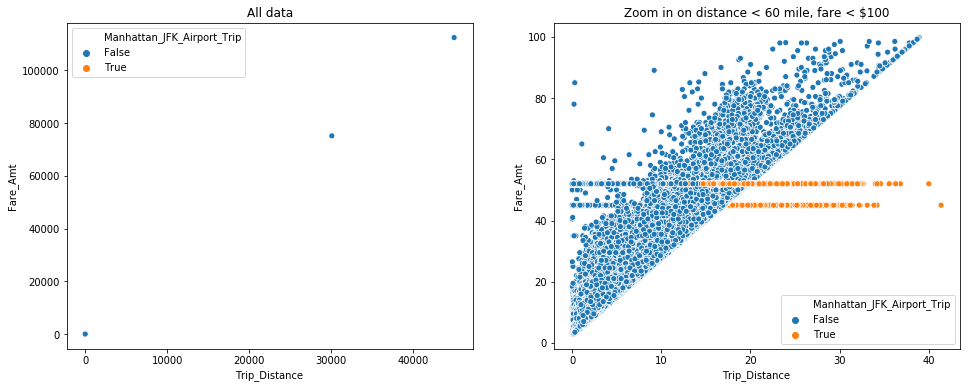

In [110]:
# scatter plot distance - fare
fig, axs = plt.subplots(1, 2, figsize=(16,6))
sns.scatterplot(data=gdf_sorted,x="Trip_Distance", y="Fare_Amt",ax=axs[0],hue="Manhattan_JFK_Airport_Trip")
axs[0].set_xlabel('Trip_Distance')
axs[0].set_ylabel('Fare_Amt')
axs[0].set_title('All data')

# zoom in on part of data
idx = (gdf_sorted.Trip_Distance < 60) & (gdf_sorted.Fare_Amt < 100)
sns.scatterplot(data=gdf_sorted,x=gdf_sorted[idx].Trip_Distance, y=gdf_sorted[idx].Fare_Amt,ax=axs[1],hue="Manhattan_JFK_Airport_Trip")
axs[1].set_xlabel('Trip_Distance')
axs[1].set_ylabel('Fare_Amt')
axs[1].set_title('Zoom in on distance < 60 mile, fare < $100');

In [111]:
# How many Data is left?
origin_length=2000000
print(str(len(gdf_sorted)/origin_length *100) + " "+ " % is left of the origin")

95.66409999999999  % is left of the origin


### 2. Speed of Ride

In [112]:
#extract Year from Datetime Object
gdf_sorted["Pickup_Year"]=gdf_sorted["Pickup_DateTime"].dt.year
#extract Month from Datetime Object
gdf_sorted["Pickup_Month"]=gdf_sorted["Pickup_DateTime"].dt.month
#extract Day from Datetime Object
gdf_sorted["Pickup_Day"]=gdf_sorted["Pickup_DateTime"].dt.day
#extract Day of Week from Datetime Object
gdf_sorted["Pickup_Weekday"]=gdf_sorted["Pickup_DateTime"].dt.day_name()
gdf_sorted["Pickup_Weekday_Int"]=gdf_sorted["Pickup_DateTime"].dt.dayofweek
#extract Hour from Datetime Object
gdf_sorted["Pickup_Hour"]=gdf_sorted["Pickup_DateTime"].dt.hour

In [113]:
# Create Column Speed
gdf_sorted["Speed"]=0.0
# Conversion factor to convert miles to km
conversion_factor = 1.609
# Get Speed in km/h
gdf_sorted["Speed"]=(((gdf_sorted["Trip_Distance"]*conversion_factor)/gdf_sorted["Trip_Duration_Seconds"])*3600)
# Floor Values of Speed because we don't need the fraction
gdf_sorted["Speed"]=gdf_sorted["Speed"].apply(np.floor)

In [114]:
gdf_sorted

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Trip_Duration,Trip_Duration_Seconds,Trip_Duration_Minutes,computed_haversine,Calculated_Fare_Amt_normal,Calculated_Fare_Amt_haversine,is_Haversine_Distance,is_haversine_fare,is_normal_fare,Pickup_Year,Pickup_Month,Pickup_Day,Pickup_Weekday,Pickup_Weekday_Int,Pickup_Hour,Speed
index,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
110742,2009-01-01 00:15:31,2009-01-01 00:26:47,4,4.398438,-73.961845,40.800648,1,13.496094,POINT (-73.96184539794922 40.8006477355957),Bloomingdale,24,Manhattan,-73.936188,40.848152,POINT (-73.93618774414063 40.84815216064453),Washington Heights South,244,Manhattan,False,False,00:11:16,676.0,11.0,3.549594,13.496094,11.373985,False,False,True,2009,1,1,Thursday,3,0,37.0
107744,2009-01-01 00:18:28,2009-01-01 00:26:30,4,2.300781,-73.975883,40.775955,1,8.251953,POINT (-73.97588348388672 40.77595520019531),Central Park,43,Manhattan,-73.964355,40.804085,POINT (-73.96435546875 40.80408477783203),Morningside Heights,166,Manhattan,False,False,00:08:02,482.0,8.0,2.036933,8.251953,7.592333,False,False,True,2009,1,1,Thursday,3,0,27.0
210569,2009-01-01 00:19:58,2009-01-01 00:27:00,2,1.000000,-73.959457,40.767616,1,5.699219,POINT (-73.95945739746094 40.76761627197266),Lenox Hill West,141,Manhattan,-73.961426,40.777248,POINT (-73.96142578125 40.77724838256836),Upper East Side North,236,Manhattan,False,False,00:07:02,422.0,7.0,0.674116,5.000000,4.185290,False,False,False,2009,1,1,Thursday,3,0,13.0
241310,2009-01-01 00:20:22,2009-01-01 00:34:22,1,1.200195,-73.992119,40.748291,1,9.000000,POINT (-73.99211883544922 40.748291015625),Penn Station/Madison Sq West,186,Manhattan,-73.977127,40.743259,POINT (-73.97712707519531 40.74325942993164),Kips Bay,137,Manhattan,False,False,00:14:00,840.0,14.0,0.859251,5.500488,4.648127,False,False,False,2009,1,1,Thursday,3,0,8.0
123511,2009-01-01 00:20:27,2009-01-01 00:22:31,2,0.399902,-73.979027,40.777214,1,3.499756,POINT (-73.97902679443359 40.77721405029297),Lincoln Square East,142,Manhattan,-73.979668,40.773609,POINT (-73.97966766357422 40.77360916137695),Lincoln Square East,142,Manhattan,False,False,00:02:04,124.0,2.0,0.251423,3.499756,3.128557,False,False,True,2009,1,1,Thursday,3,0,18.0
58781,2009-01-01 00:20:31,2009-01-01 00:35:57,1,3.099609,-73.973984,40.751244,1,11.398438,POINT (-73.97398376464844 40.75124359130859),UN/Turtle Bay South,233,Manhattan,-73.999573,40.719433,POINT (-73.99957275390625 40.71943283081055),Little Italy/NoLiTa,144,Manhattan,False,False,00:15:26,926.0,15.0,2.577000,10.249023,8.942501,False,False,False,2009,1,1,Thursday,3,0,19.0
103740,2009-01-01 00:21:33,2009-01-01 00:28:31,1,1.000000,-73.975723,40.744865,1,6.199219,POINT (-73.97572326660156 40.74486541748047),Murray Hill,170,Manhattan,-73.969849,40.751698,POINT (-73.9698486328125 40.7516975402832),UN/Turtle Bay South,233,Manhattan,False,False,00:06:58,418.0,6.0,0.564062,5.000000,3.910154,False,False,False,2009,1,1,Thursday,3,0,13.0
234,2009-01-01 00:22:24,2009-01-01 00:47:14,1,4.101562,-73.978012,40.725197,1,15.796875,POINT (-73.97801208496094 40.72519683837891),Alphabet City,4,Manhattan,-73.987656,40.760220,POINT (-73.98765563964844 40.76021957397461),Clinton East,48,Manhattan,False,False,00:24:50,1490.0,24.0,2.474593,12.753906,8.686483,False,False,False,2009,1,1,Thursday,3,0,15.0
205837,2009-01-01 00:24:21,2009-01-01 00:35:37,2,3.000000,-73.989807,40.739082,1,10.203125,POINT (-73.98980712890625 40.73908233642578),Union Sq,234,Manhattan,-74.016190,40.706070,POINT (-74.01618957519531 40.70606994628906),World Trade Center,261,Manhattan,False,False,00:11:16,676.0,11.0,2.669761,10.000000,9.174404,False,False,False,2009,1,1,Thursday,3,0,25.0


In [115]:
gdf_sorted["Speed"].describe()

count    1.913282e+06
mean     2.086455e+01
std      3.564531e+02
min      0.000000e+00
25%      1.300000e+01
50%      1.800000e+01
75%      2.400000e+01
max      4.516660e+05
Name: Speed, dtype: float64

#### Observation:
#### 1. max. Speed is 451666 km/h 
#### 2. min. Speed is 0 km/h

### In residential neighborhood areas outside of New York City range between 30–40 mph and 35–45 mph on suburban/urban arterial routes.
#### For more Information go to [New York](https://en.m.wikipedia.org/wiki/Speed_limits_in_the_United_States_by_jurisdiction)

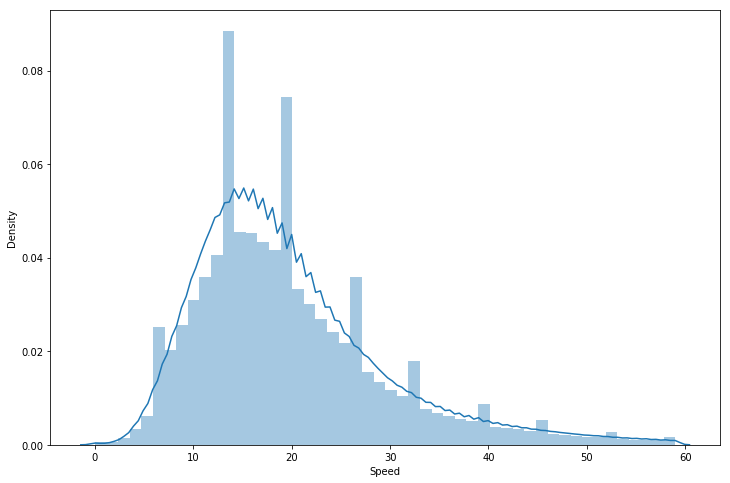

In [116]:
# Create Dataframe for Speed under 60 km/h
df_speed_under_60_kmh=gdf_sorted.loc[gdf_sorted["Speed"]<60]["Speed"]
# Plot Distribution of Speed
plt.figure(figsize = (12, 8))
plt.xlabel('Speed in km/h') 
plt.ylabel('Density')
sns.distplot(df_speed_under_60_kmh);

### How does the Speed vary during the day?

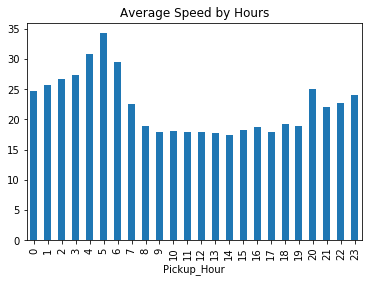

In [117]:
# Plot Average Speed during the Day
plt.title('Average Speed by Hours')
gdf_sorted.groupby("Pickup_Hour")["Speed"].agg("mean").plot.bar()

#### Observation:
#### 1. The average speed is lower during the day, because of busy traffic

### How does the Speed vary during Weekdays?

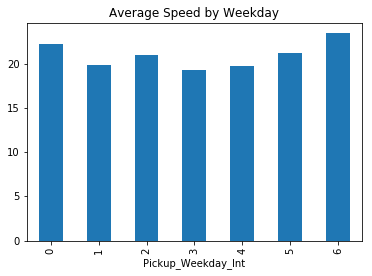

In [118]:
# Plot Average Speed during the Week
plt.title('Average Speed by Weekday')
gdf_sorted.groupby("Pickup_Weekday_Int")["Speed"].agg("mean").plot.bar()

#### Observation:
#### 1.Our taxis appear to be travelling faster on the weekend and on a Monday than during the rest of the week.

In [119]:
print(str(len(gdf_sorted.loc[gdf_sorted["Speed"]>70])/len(gdf_sorted)*100))

0.2737181450512784


In [120]:
print(str(len(gdf_sorted.loc[gdf_sorted["Speed"]==0])/len(gdf_sorted)*100))

0.03883379449553176


#### Decision: Remove Datapoints with 0 Speed and and Speed above 70 km/h

In [121]:
indexNames = gdf_sorted.loc[(gdf_sorted['Speed'] == 0) | (gdf_sorted['Speed'] > 70)].index
gdf_sorted.drop(indexNames , inplace=True)

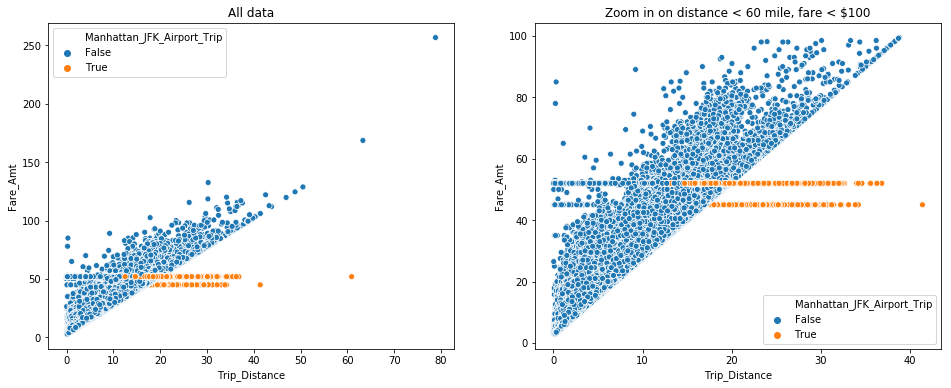

In [122]:
# scatter plot distance - fare
fig, axs = plt.subplots(1, 2, figsize=(16,6))
sns.scatterplot(data=gdf_sorted,x="Trip_Distance", y="Fare_Amt",ax=axs[0],hue="Manhattan_JFK_Airport_Trip")
axs[0].set_xlabel('Trip_Distance')
axs[0].set_ylabel('Fare_Amt')
axs[0].set_title('All data')

# zoom in on part of data
idx = (gdf_sorted.Trip_Distance < 60) & (gdf_sorted.Fare_Amt < 100)
sns.scatterplot(data=gdf_sorted,x=gdf_sorted[idx].Trip_Distance, y=gdf_sorted[idx].Fare_Amt,ax=axs[1],hue="Manhattan_JFK_Airport_Trip")
axs[1].set_xlabel('Trip_Distance')
axs[1].set_ylabel('Fare_Amt')
axs[1].set_title('Zoom in on distance < 60 mile, fare < $100');

### How about the Fare per Miles?

In [123]:
# Create Column Fare_per_Mile
gdf_sorted["Fare_Per_Mile"]=0.0
# Get Fare per Miles
gdf_sorted["Fare_Per_Mile"]=gdf_sorted["Fare_Amt"]/gdf_sorted["Trip_Distance"]

In [124]:
gdf_sorted

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Trip_Duration,Trip_Duration_Seconds,Trip_Duration_Minutes,computed_haversine,Calculated_Fare_Amt_normal,Calculated_Fare_Amt_haversine,is_Haversine_Distance,is_haversine_fare,is_normal_fare,Pickup_Year,Pickup_Month,Pickup_Day,Pickup_Weekday,Pickup_Weekday_Int,Pickup_Hour,Speed,Fare_Per_Mile
index,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
110742,2009-01-01 00:15:31,2009-01-01 00:26:47,4,4.398438,-73.961845,40.800648,1,13.496094,POINT (-73.96184539794922 40.8006477355957),Bloomingdale,24,Manhattan,-73.936188,40.848152,POINT (-73.93618774414063 40.84815216064453),Washington Heights South,244,Manhattan,False,False,00:11:16,676.0,11.0,3.549594,13.496094,11.373985,False,False,True,2009,1,1,Thursday,3,0,37.0,3.068384
107744,2009-01-01 00:18:28,2009-01-01 00:26:30,4,2.300781,-73.975883,40.775955,1,8.251953,POINT (-73.97588348388672 40.77595520019531),Central Park,43,Manhattan,-73.964355,40.804085,POINT (-73.96435546875 40.80408477783203),Morningside Heights,166,Manhattan,False,False,00:08:02,482.0,8.0,2.036933,8.251953,7.592333,False,False,True,2009,1,1,Thursday,3,0,27.0,3.586587
210569,2009-01-01 00:19:58,2009-01-01 00:27:00,2,1.000000,-73.959457,40.767616,1,5.699219,POINT (-73.95945739746094 40.76761627197266),Lenox Hill West,141,Manhattan,-73.961426,40.777248,POINT (-73.96142578125 40.77724838256836),Upper East Side North,236,Manhattan,False,False,00:07:02,422.0,7.0,0.674116,5.000000,4.185290,False,False,False,2009,1,1,Thursday,3,0,13.0,5.699219
241310,2009-01-01 00:20:22,2009-01-01 00:34:22,1,1.200195,-73.992119,40.748291,1,9.000000,POINT (-73.99211883544922 40.748291015625),Penn Station/Madison Sq West,186,Manhattan,-73.977127,40.743259,POINT (-73.97712707519531 40.74325942993164),Kips Bay,137,Manhattan,False,False,00:14:00,840.0,14.0,0.859251,5.500488,4.648127,False,False,False,2009,1,1,Thursday,3,0,8.0,7.498779
123511,2009-01-01 00:20:27,2009-01-01 00:22:31,2,0.399902,-73.979027,40.777214,1,3.499756,POINT (-73.97902679443359 40.77721405029297),Lincoln Square East,142,Manhattan,-73.979668,40.773609,POINT (-73.97966766357422 40.77360916137695),Lincoln Square East,142,Manhattan,False,False,00:02:04,124.0,2.0,0.251423,3.499756,3.128557,False,False,True,2009,1,1,Thursday,3,0,18.0,8.751526
58781,2009-01-01 00:20:31,2009-01-01 00:35:57,1,3.099609,-73.973984,40.751244,1,11.398438,POINT (-73.97398376464844 40.75124359130859),UN/Turtle Bay South,233,Manhattan,-73.999573,40.719433,POINT (-73.99957275390625 40.71943283081055),Little Italy/NoLiTa,144,Manhattan,False,False,00:15:26,926.0,15.0,2.577000,10.249023,8.942501,False,False,False,2009,1,1,Thursday,3,0,19.0,3.677379
103740,2009-01-01 00:21:33,2009-01-01 00:28:31,1,1.000000,-73.975723,40.744865,1,6.199219,POINT (-73.97572326660156 40.74486541748047),Murray Hill,170,Manhattan,-73.969849,40.751698,POINT (-73.9698486328125 40.7516975402832),UN/Turtle Bay South,233,Manhattan,False,False,00:06:58,418.0,6.0,0.564062,5.000000,3.910154,False,False,False,2009,1,1,Thursday,3,0,13.0,6.199219
234,2009-01-01 00:22:24,2009-01-01 00:47:14,1,4.101562,-73.978012,40.725197,1,15.796875,POINT (-73.97801208496094 40.72519683837891),Alphabet City,4,Manhattan,-73.987656,40.760220,POINT (-73.98765563964844 40.76021957397461),Clinton East,48,Manhattan,False,False,00:24:50,1490.0,24.0,2.474593,12.753906,8.686483,False,False,False,2009,1,1,Thursday,3,0,15.0,3.851429
205837,2009-01-01 00:24:21,2009-01-01 00:35:37,2,3.000000,-73.989807,40.739082,1,10.203125,POINT (-73.98980712890625 40.73908233642578),Union Sq,234,Manhattan,-74.016190,40.706070,POINT (-74.01618957519531 40.70606994628906),World Trade Center,261,Manhattan,False,False,00:11:16,676.0,11.0,2.669761,10.000000,9.174404,False,False,False,2009,1,1,Thursday,3,0,25.0,3.401

In [125]:
gdf_sorted["Fare_Per_Mile"].describe()

count    1.907302e+06
mean     5.404521e+00
std      1.508804e+01
min      8.537712e-01
25%      3.784232e+00
50%      4.783822e+00
75%      6.154771e+00
max      5.198889e+03
Name: Fare_Per_Mile, dtype: float64

#### Observation:
#### 1. max. Fare per Mile= 5198 Dollars per Mile
#### 2. min. Fare per Mile= 0,854 Dollar per Mile

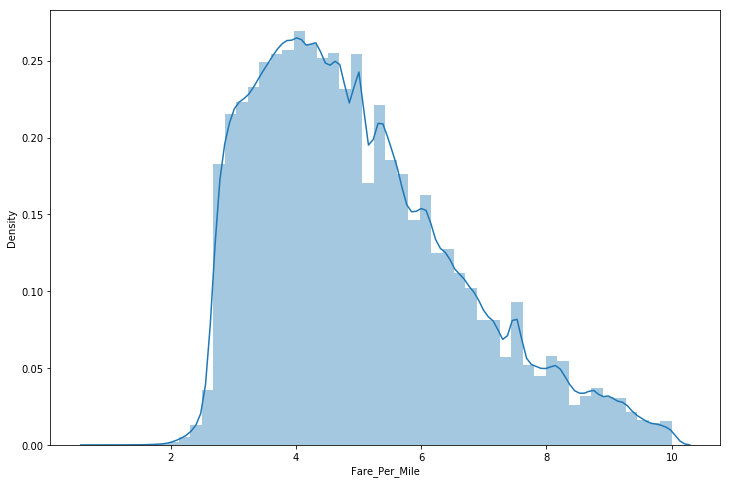

In [126]:
# Create Dataframe for Fare per Mile under 10 
df_fare_per_mile_under_10=gdf_sorted.loc[gdf_sorted["Fare_Per_Mile"]<10]["Fare_Per_Mile"]
# Plot Distribution of Speed
plt.figure(figsize = (12, 8))
plt.xlabel('Fare_Per_Mile') 
plt.ylabel('Density')
sns.distplot(df_fare_per_mile_under_10);

In [127]:
print(str(len(gdf_sorted.loc[gdf_sorted["Fare_Per_Mile"]>10])/len(gdf_sorted)*100))

3.513601936138063


In [128]:
print(str(len(gdf_sorted.loc[gdf_sorted["Fare_Per_Mile"]<2.5])/len(gdf_sorted)*100))

0.3579401688877797


#### Decision: Remove Datapoints with Fare_Per_Mile smaller than 1.5  and bigger than 15

In [129]:
indexNames = gdf_sorted.loc[(gdf_sorted['Fare_Per_Mile'] < 1.5) | (gdf_sorted['Fare_Per_Mile'] > 15) & (gdf_sorted['Manhattan_JFK_Airport_Trip'] != True)].index
gdf_sorted.drop(indexNames , inplace=True)

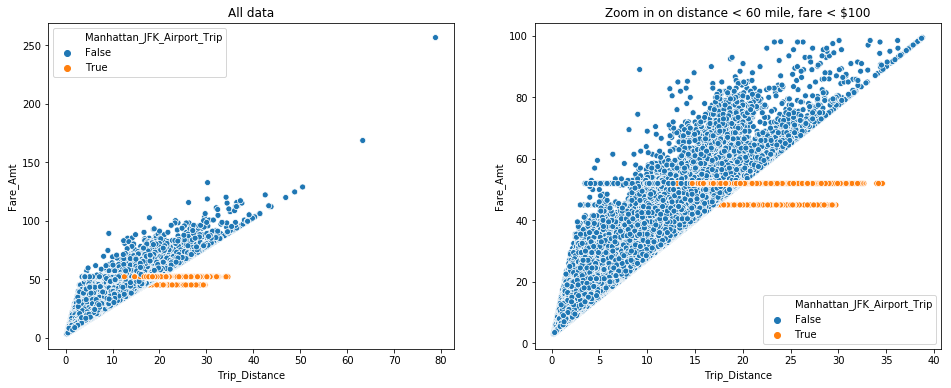

In [130]:
# scatter plot distance - fare
fig, axs = plt.subplots(1, 2, figsize=(16,6))
sns.scatterplot(data=gdf_sorted,x="Trip_Distance", y="Fare_Amt",ax=axs[0],hue="Manhattan_JFK_Airport_Trip")
axs[0].set_xlabel('Trip_Distance')
axs[0].set_ylabel('Fare_Amt')
axs[0].set_title('All data')

# zoom in on part of data
idx = (gdf_sorted.Trip_Distance < 60) & (gdf_sorted.Fare_Amt < 100)
sns.scatterplot(data=gdf_sorted,x=gdf_sorted[idx].Trip_Distance, y=gdf_sorted[idx].Fare_Amt,ax=axs[1],hue="Manhattan_JFK_Airport_Trip")
axs[1].set_xlabel('Trip_Distance')
axs[1].set_ylabel('Fare_Amt')
axs[1].set_title('Zoom in on distance < 60 mile, fare < $100');

### What about the Pickup and Dropoff Boroughs?

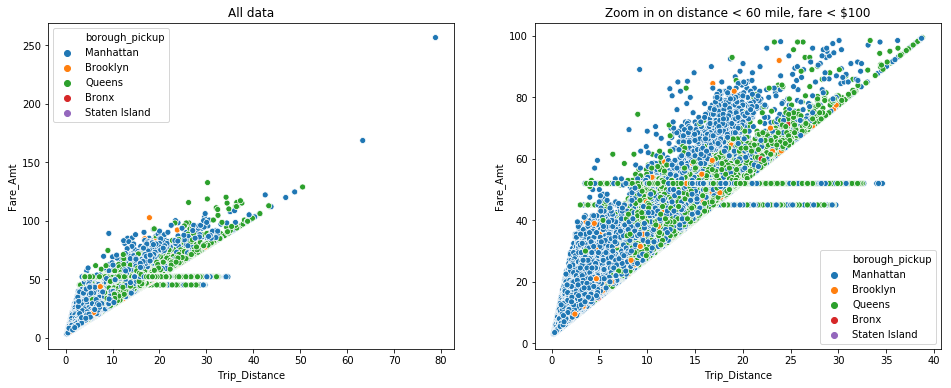

In [131]:
# scatter plot distance - fare
fig, axs = plt.subplots(1, 2, figsize=(16,6))
sns.scatterplot(data=gdf_sorted,x="Trip_Distance", y="Fare_Amt",ax=axs[0],hue="borough_pickup")
axs[0].set_xlabel('Trip_Distance')
axs[0].set_ylabel('Fare_Amt')
axs[0].set_title('All data')

# zoom in on part of data
idx = (gdf_sorted.Trip_Distance < 60) & (gdf_sorted.Fare_Amt < 100)
sns.scatterplot(data=gdf_sorted,x=gdf_sorted[idx].Trip_Distance, y=gdf_sorted[idx].Fare_Amt,ax=axs[1],hue="borough_pickup")
axs[1].set_xlabel('Trip_Distance')
axs[1].set_ylabel('Fare_Amt')
axs[1].set_title('Zoom in on distance < 60 mile, fare < $100');

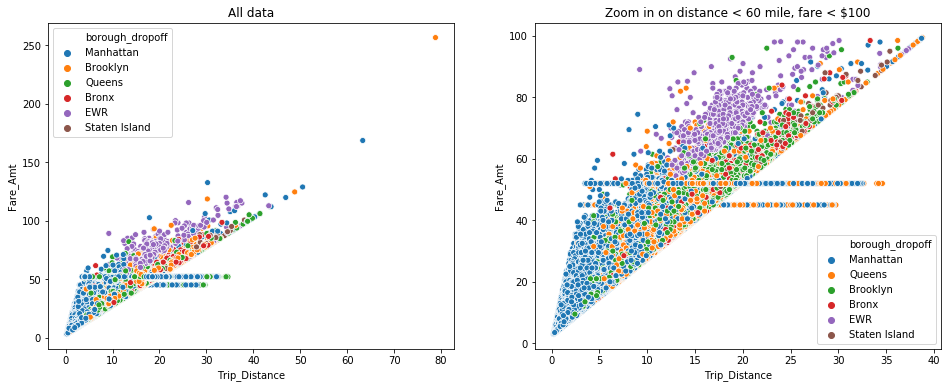

In [132]:
# scatter plot distance - fare
fig, axs = plt.subplots(1, 2, figsize=(16,6))
sns.scatterplot(data=gdf_sorted,x="Trip_Distance", y="Fare_Amt",ax=axs[0],hue="borough_dropoff")
axs[0].set_xlabel('Trip_Distance')
axs[0].set_ylabel('Fare_Amt')
axs[0].set_title('All data')

# zoom in on part of data
idx = (gdf_sorted.Trip_Distance < 60) & (gdf_sorted.Fare_Amt < 100)
sns.scatterplot(data=gdf_sorted,x=gdf_sorted[idx].Trip_Distance, y=gdf_sorted[idx].Fare_Amt,ax=axs[1],hue="borough_dropoff")
axs[1].set_xlabel('Trip_Distance')
axs[1].set_ylabel('Fare_Amt')
axs[1].set_title('Zoom in on distance < 60 mile, fare < $100');

### 3. Does the Number of Passengers affect the Fare?

Text(0.5, 1.0, 'All data')

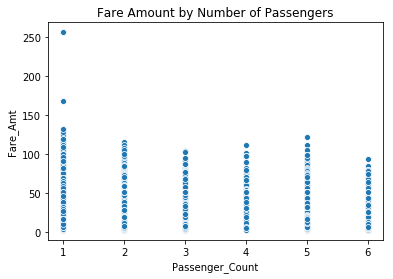

In [133]:
# scatter plot passenger count - fare
plt.title('Fare Amount by Number of Passengers')
sns.scatterplot(data=gdf_sorted,x="Passenger_Count", y="Fare_Amt")
axs[0].set_xlabel('Passenger_Count')
axs[0].set_ylabel('Fare_Amt')
axs[0].set_title('All data')

#### Observation:
#### 1. The most highest Fares are on 1 Passenger
#### 2. But have not real Correlation with Fares

### How many Fare Entries with Passenger Count?

In [134]:
print(str(len(gdf_sorted.loc[gdf_sorted["Passenger_Count"]==1])/len(gdf_sorted)*100) + " " + "% have 1 Passengers")
print(str(len(gdf_sorted.loc[gdf_sorted["Passenger_Count"]==2])/len(gdf_sorted)*100) + " " + "% have 2 Passengers")
print(str(len(gdf_sorted.loc[gdf_sorted["Passenger_Count"]==3])/len(gdf_sorted)*100) + " " + "% have 3 Passengers")
print(str(len(gdf_sorted.loc[gdf_sorted["Passenger_Count"]==4])/len(gdf_sorted)*100) + " " + "% have 4 Passengers")
print(str(len(gdf_sorted.loc[gdf_sorted["Passenger_Count"]==5])/len(gdf_sorted)*100) + " " + "% have 5 Passengers")
print(str(len(gdf_sorted.loc[gdf_sorted["Passenger_Count"]==6])/len(gdf_sorted)*100) + " " + "% have 6 Passengers")

69.61367558160208 % have 1 Passengers
14.776773161607801 % have 2 Passengers
4.363090405431996 % have 3 Passengers
2.115391412562784 % have 4 Passengers
6.7477921040650815 % have 5 Passengers
2.383277334730265 % have 6 Passengers


### Which Passenger Count has the highest and lowest Fare Amount?

In [135]:
gdf_sorted.groupby('Passenger_Count')['Fare_Amt'].agg(['min', 'max'])

,min,max
Passenger_Count,,
1,3.000063,256.500000
2,3.000495,115.500000
3,3.005376,104.500000
4,3.001217,112.000000
5,3.001750,122.000000
6,3.003633,93.671875


#### Observation
#### 1. Passenger 1 contains the highest and lowest Fare Amount of all Passenger Count

### What is the Average Fare Amount for Passenger Count?

In [136]:
gdf_sorted.groupby('Passenger_Count')['Fare_Amt'].agg(['mean', 'count'])

,mean,count
Passenger_Count,,
1,11.365076,1319585
2,11.972062,280106
3,11.779163,82706
4,11.934657,40099
5,11.551668,127910
6,12.249927,45177


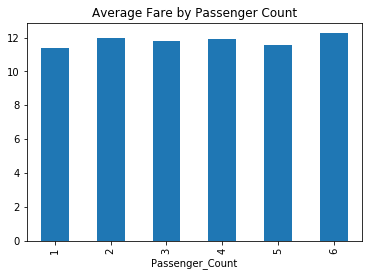

In [137]:
plt.title('Average Fare by Passenger Count')
df_avg_fare_pass=gdf_sorted.groupby('Passenger_Count')['Fare_Amt'].mean().plot.bar()

#### Observation
#### 1. 6 Passengers have the highest Average Fare Amount
#### 2. 1 Passenger has the lowest Average Fare Amount

### What about the Distribution of Fare Amount by Number of Passengers?

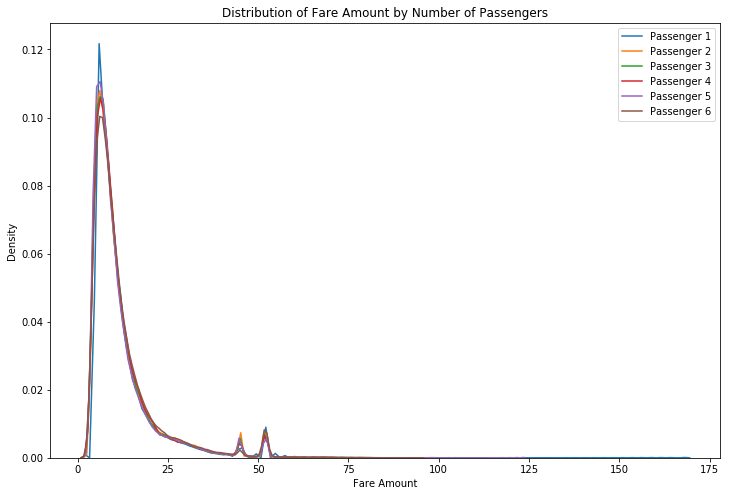

In [138]:
# Dataframe with sorted Passenger Count and Fare Amount
df_pass_fare=gdf_sorted[["Passenger_Count","Fare_Amt"]]
df_pass_fare=df_pass_fare.loc[df_pass_fare["Fare_Amt"]<200]
# Plotting Distribution of Fare Amount by Number of Passengers
plt.figure(figsize = (12, 8))
plt.xlabel('Fare Amount') 
plt.ylabel('Density')
plt.title("Distribution of Fare Amount by Number of Passengers")
sns.kdeplot(data=df_pass_fare.loc[df_pass_fare["Passenger_Count"]==1,"Fare_Amt"], label="Passenger 1")
sns.kdeplot(data=df_pass_fare.loc[df_pass_fare["Passenger_Count"]==2,"Fare_Amt"], label="Passenger 2")
sns.kdeplot(data=df_pass_fare.loc[df_pass_fare["Passenger_Count"]==3,"Fare_Amt"], label="Passenger 3")
sns.kdeplot(data=df_pass_fare.loc[df_pass_fare["Passenger_Count"]==4,"Fare_Amt"], label="Passenger 4")
sns.kdeplot(data=df_pass_fare.loc[df_pass_fare["Passenger_Count"]==5,"Fare_Amt"], label="Passenger 5")
sns.kdeplot(data=df_pass_fare.loc[df_pass_fare["Passenger_Count"]==6,"Fare_Amt"], label="Passenger 6")

#### Observation:
#### 1. The Difference between the Passenger Numbers are not too much or you can say pretty much the same

### 4. How is the Relation between Trip_Duration and Trip_Distance?

#### For Reference a Trip from Tottenville Staten Island to Bay Terrace -> approximately has 49.2 Miles and cost around 131.20 Dollars with 74 minutes Trip Duration
#### For more Information go to [Taxi Fare](https://www.taxifarefinder.com/main.php?city=NY&from=Tottenville%2C+Staten+Island%2C+New+York%2C+New+York+10307%2C+United+States&to=Bay+Terrace%2C+Queens%2C+Bay+Terrace%2C+New+York+11360%2C+United+States&fromCoord=40.5112,-74.2493&toCoord=40.79,-73.79)

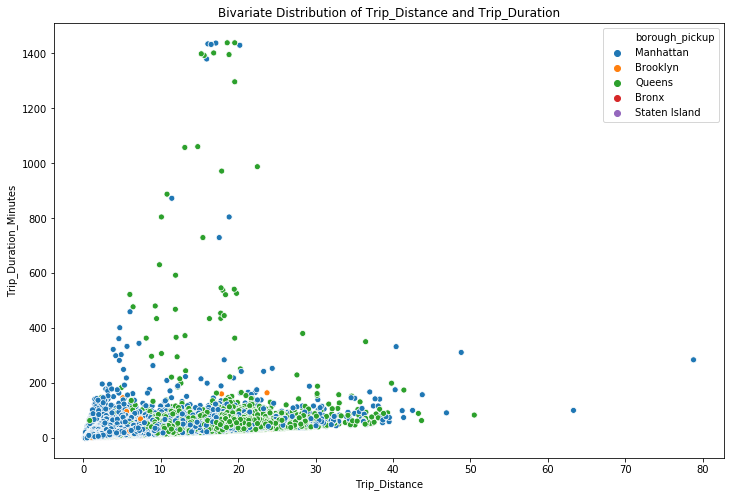

In [139]:
plt.figure(figsize = (12, 8))
plt.xlabel('Trip_Distance') 
plt.ylabel('Trip_Duration')
plt.title('Bivariate Distribution of Trip_Distance and Trip_Duration')
sns.scatterplot(data=gdf_sorted,x="Trip_Distance", y="Trip_Duration_Minutes",hue="borough_pickup")

#### Observation:
#### 1. There are some Trip Distances until 20 Miles which have very high Trip Duration

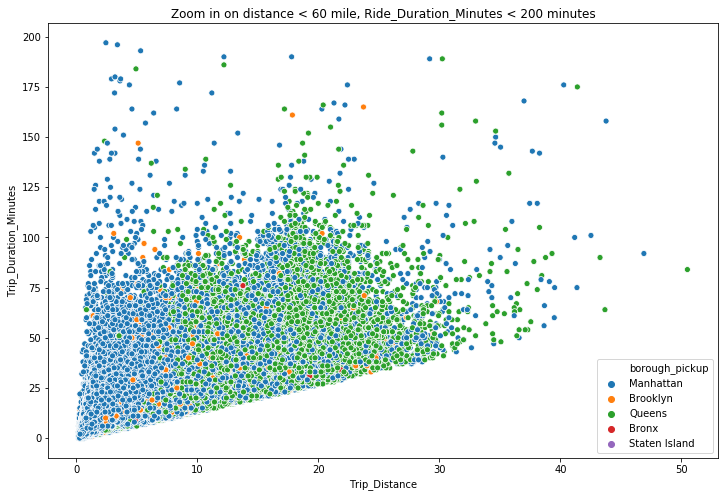

In [140]:
# zoom in on part of data
plt.figure(figsize = (12, 8))
plt.xlabel('Trip_Distance') 
plt.ylabel('Trip_Duration')
plt.title('Zoom in on distance < 60 mile, Ride_Duration_Minutes < 200 minutes')
idx = (gdf_sorted.Trip_Distance < 60) & (gdf_sorted.Trip_Duration_Minutes < 200)
sns.scatterplot(data=gdf_sorted,x=gdf_sorted[idx].Trip_Distance, y=gdf_sorted[idx].Trip_Duration_Minutes,hue="borough_pickup")

#### Observation:
#### 1. There is a Cluster with a approximately linear Correlation

### How many Trips are over 120 minutes long?

In [141]:
print(str(len(gdf_sorted.loc[gdf_sorted["Trip_Duration_Minutes"]>120])/len(gdf_sorted)*100) + " "+ "% of the Trips are over 120 minutes long")

0.01070910638046448 % of the Trips are over 120 minutes long


### How many Trips are over 50 Miles?

In [142]:
print(str(len(gdf_sorted.loc[gdf_sorted["Trip_Distance"]>50])/len(gdf_sorted)*100) + " "+ "% of the Trips are over 50 Miles")

0.0001582626558689332 % of the Trips are over 50 Miles


#### Drop Rows with those Outliers

In [143]:
indexNames = gdf_sorted.loc[gdf_sorted["Trip_Duration_Minutes"]>120].index
gdf_sorted.drop(indexNames , inplace=True)

In [144]:
indexNames = gdf_sorted.loc[gdf_sorted["Trip_Distance"]>50].index
gdf_sorted.drop(indexNames , inplace=True)

### 5. How is the Relation between Trip_Duration and Fare_Amt?

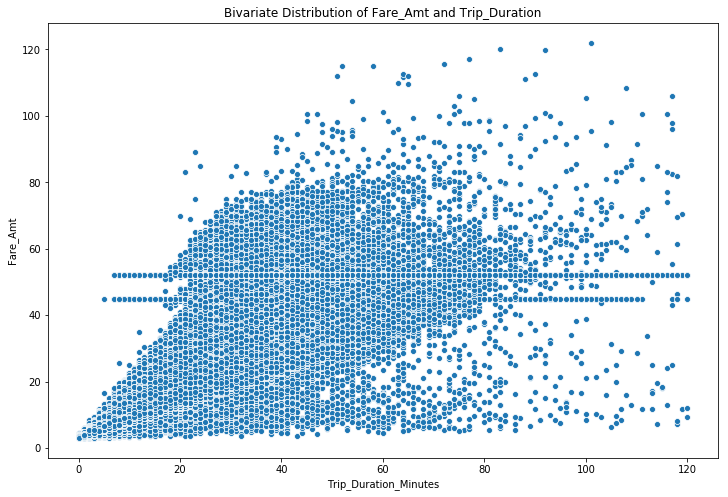

In [145]:
plt.figure(figsize = (12, 8))
plt.xlabel('Trip_Duration') 
plt.ylabel('Fare_Amt')
plt.title('Bivariate Distribution of Fare_Amt and Trip_Duration')
sns.scatterplot(data=gdf_sorted,x="Trip_Duration_Minutes", y="Fare_Amt")

#### Observation:
#### 1. The most Fare Amounts are between 20 and 90 Minutes

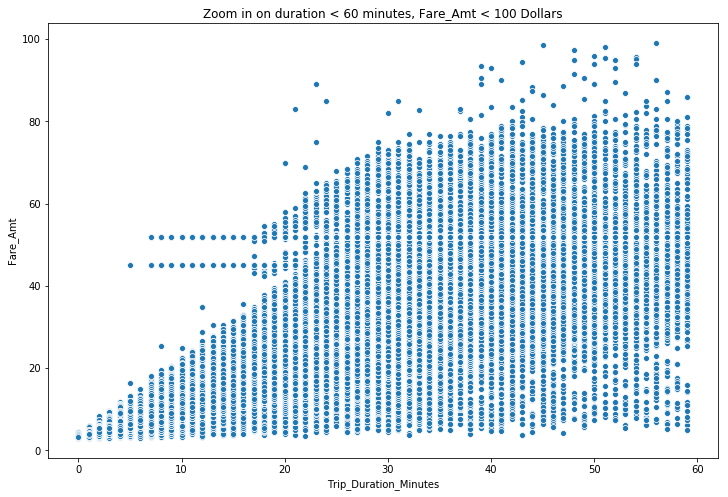

In [146]:
# zoom in on part of data
plt.figure(figsize = (12, 8))
plt.xlabel('Trip_Duration') 
plt.ylabel('Fare_Amt')
plt.title('Zoom in on duration < 60 minutes, Fare_Amt < 100 Dollars')
idx = (gdf_sorted.Trip_Duration_Minutes < 60) & (gdf_sorted.Fare_Amt < 100)
sns.scatterplot(data=gdf_sorted,x=gdf_sorted[idx].Trip_Duration_Minutes, y=gdf_sorted[idx].Fare_Amt)

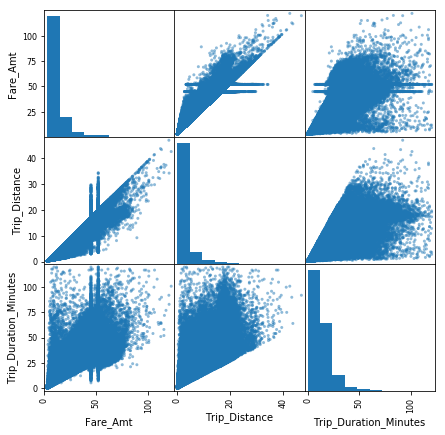

In [147]:
# Visualise the Columns Fare_Amt,Trip_Distance and Trip_Duration as Scattermatrix
pd.plotting.scatter_matrix(frame = gdf_sorted[['Fare_Amt', 'Trip_Distance', 'Trip_Duration_Minutes']], figsize=(7,7));

### 6. Does the Pick-up and Dropoff Location or Neighborhood affect the Fares?

### How is the Distribution of Pickups in Boroughs?

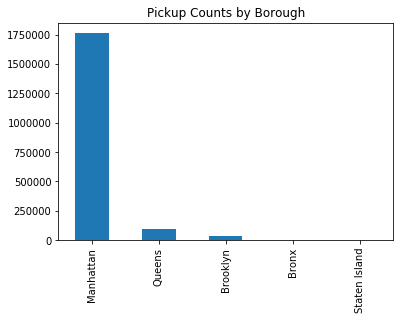

In [148]:
plt.title('Pickup Counts by Borough')
df_borough_pickup=gdf_sorted["borough_pickup"]
df_borough_pickup.value_counts().plot.bar()

#### Observation
#### 1. The most Pickups are in Manhattan
#### 2. The second most Pickups are in Queens

In [149]:
df_zone_pickup=gdf_sorted["zone_pickup"]
df_zone_pickup.value_counts()

Upper East Side South                            71154
Midtown Center                                   67976
East Village                                     65545
Times Sq/Theatre District                        64722
Upper East Side North                            63805
Midtown East                                     63667
Union Sq                                         63423
Murray Hill                                      63037
Clinton East                                     60624
Penn Station/Madison Sq West                     58928
Lincoln Square East                              54309
Gramercy                                         51811
Midtown North                                    50543
East Chelsea                                     48895
Lenox Hill West                                  45862
Upper West Side South                            45845
Midtown South                                    45777
West Village                                     44425
LaGuardia 

### How is the Distribution of Dropoffs in Boroughs?

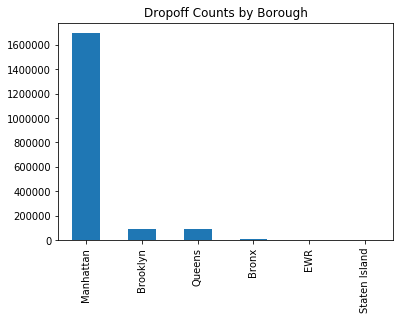

In [150]:
plt.title('Dropoff Counts by Borough')
df_borough_dropoff=gdf_sorted["borough_dropoff"]
df_borough_dropoff.value_counts().plot.bar()

#### Observation:
#### 1. The most dropoffs are in Manhattan
#### 2. The second most dropoffs are in Brooklyn
#### 3. The Third most dropoffs are in Queens

In [151]:
df_zone_dropoff=gdf_sorted["zone_dropoff"]
df_zone_dropoff.value_counts()

Midtown Center                                   75814
Times Sq/Theatre District                        63635
Upper East Side North                            63247
Upper East Side South                            63013
Murray Hill                                      61852
Midtown East                                     60422
Union Sq                                         56446
East Village                                     52415
Penn Station/Madison Sq West                     52323
Clinton East                                     50806
Lincoln Square East                              48603
Midtown North                                    46786
East Chelsea                                     45601
Lenox Hill West                                  43472
Gramercy                                         43264
Upper West Side South                            42955
Midtown South                                    41989
West Village                                     36197
TriBeCa/Ci

### What is the Average Fare by Borough_pickup?

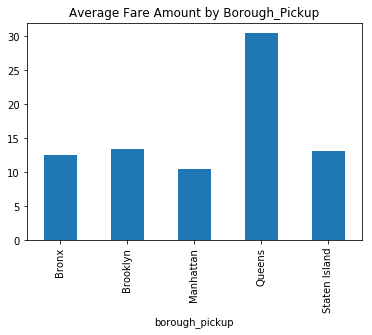

In [152]:
plt.title('Average Fare Amount by Borough_Pickup')
gdf_sorted.groupby("borough_pickup")["Fare_Amt"].agg("mean").plot.bar()

#### Observation:
#### 1. Queens has the highest Average Fare Amount in Pickups
#### 2. Brooklyn has the second highest Average Fare Amount in Pickups

In [153]:
gdf_sorted.groupby("zone_pickup")["Fare_Amt"].agg("mean").sort_values(ascending =False)

zone_pickup
Rockaway Park                          55.892979
New Dorp/Midland Beach                 47.556553
Baisley Park                           44.937595
JFK Airport                            44.079700
South Jamaica                          44.000156
Springfield Gardens South              39.344398
Flushing Meadows-Corona Park           35.091682
West Brighton                          33.349609
Jamaica                                33.228073
Eastchester                            32.355469
LaGuardia Airport                      29.407839
Hammels/Arverne                        29.184896
Rosedale                               28.120508
Broad Channel                          27.620443
Starrett City                          27.592611
Grymes Hill/Clifton                    26.838339
South Ozone Park                       26.106003
Cambria Heights                        26.004185
Briarwood/Jamaica Hills                25.095186
Randalls Island                        24.001677
Jamaica 

### What is the Average Fare by Borough_dropoff?

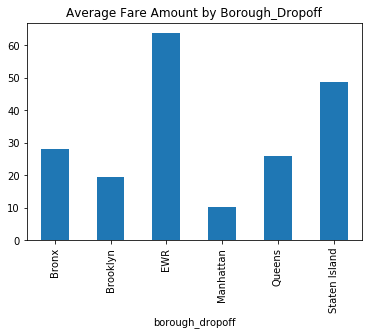

In [154]:
plt.title('Average Fare Amount by Borough_Dropoff')
gdf_sorted.groupby("borough_dropoff")["Fare_Amt"].agg("mean").plot.bar()

#### Observation:
#### 1. The Newark Airport has the highest Fare Amount in Dropoffs
#### 2. Staten Island has the second highest Fare Amount in Dropoffs

In [155]:
gdf_sorted.groupby("zone_dropoff")["Fare_Amt"].agg("mean").sort_values(ascending =False)

zone_dropoff
Rossville/Woodrow                      74.000000
Arden Heights                          68.483727
Eltingville/Annadale/Prince's Bay      66.964287
Charleston/Tottenville                 66.431198
Great Kills                            65.803589
Newark Airport                         63.777924
Port Richmond                          59.440289
Breezy Point/Fort Tilden/Riis Beach    55.950344
Oakwood                                52.728516
Westerleigh                            51.994976
Saint George/New Brighton              51.981480
New Dorp/Midland Beach                 51.854958
Rockaway Park                          50.827587
West Brighton                          50.483696
Bloomfield/Emerson Hill                47.981667
Grymes Hill/Clifton                    47.328999
JFK Airport                            47.042961
Coney Island                           46.546448
Manhattan Beach                        45.899876
City Island                            45.737362
Sheepsh

### How about the Fare Distribution of Pickups and Dropoffs in Boroughs?

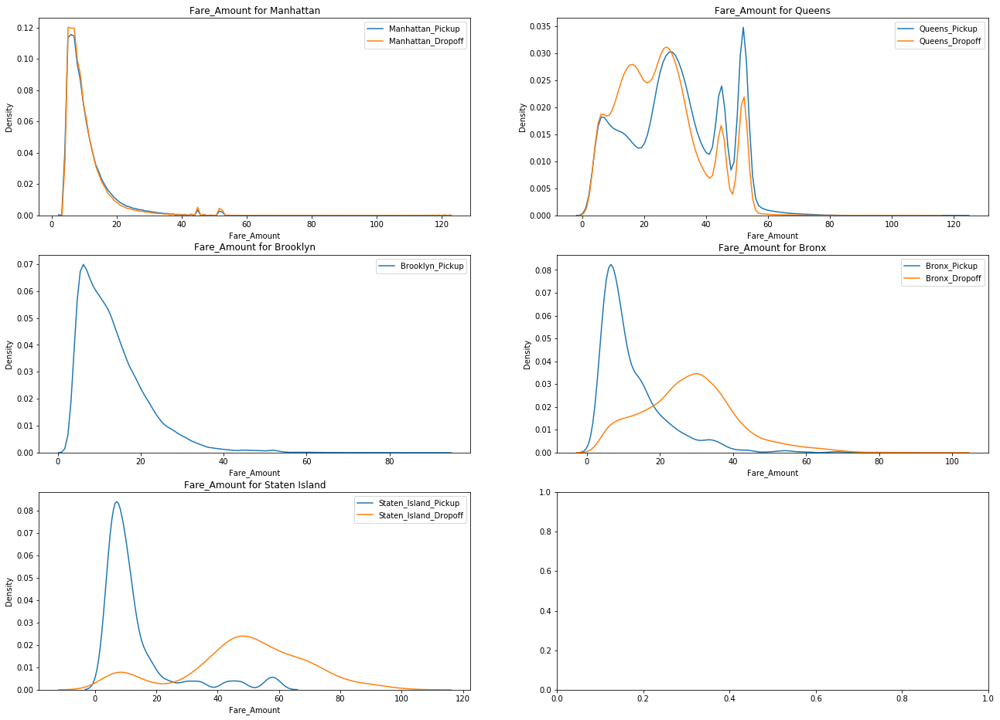

In [156]:
fig, axs = plt.subplots(3, 2, figsize=(22,16))

axs[0][0].set_title('Fare_Amount for Manhattan')
axs[0][0].set_xlabel("Fare_Amount")
axs[0][0].set_ylabel("Density")
sns.kdeplot(data=gdf_sorted.loc[gdf_sorted["borough_pickup"]=="Manhattan","Fare_Amt"],ax=axs[0][0], label="Manhattan_Pickup")
sns.kdeplot(data=gdf_sorted.loc[gdf_sorted["borough_dropoff"]=="Manhattan","Fare_Amt"],ax=axs[0][0], label="Manhattan_Dropoff")

axs[0][1].set_title('Fare_Amount for Queens')
axs[0][1].set_xlabel("Fare_Amount")
axs[0][1].set_ylabel("Density")
sns.kdeplot(data=gdf_sorted.loc[gdf_sorted["borough_pickup"]=="Queens","Fare_Amt"],ax=axs[0][1], label="Queens_Pickup")
sns.kdeplot(data=gdf_sorted.loc[gdf_sorted["borough_dropoff"]=="Queens","Fare_Amt"],ax=axs[0][1], label="Queens_Dropoff")

axs[1][0].set_title('Fare_Amount for Brooklyn')
axs[1][0].set_xlabel("Fare_Amount")
axs[1][0].set_ylabel("Density")
sns.kdeplot(data=gdf_sorted.loc[gdf_sorted["borough_pickup"]=="Brooklyn","Fare_Amt"],ax=axs[1][0], label="Brooklyn_Pickup")
sns.kdeplot(data=gdf_sorted.loc[gdf_sorted["borough_dropoff"]=="Brookyln","Fare_Amt"],ax=axs[1][0], label="Brooklyn_Dropoff")

axs[1][1].set_title('Fare_Amount for Bronx')
axs[1][1].set_xlabel("Fare_Amount")
axs[1][1].set_ylabel("Density")
sns.kdeplot(data=gdf_sorted.loc[gdf_sorted["borough_pickup"]=="Bronx","Fare_Amt"],ax=axs[1][1], label="Bronx_Pickup")
sns.kdeplot(data=gdf_sorted.loc[gdf_sorted["borough_dropoff"]=="Bronx","Fare_Amt"],ax=axs[1][1], label="Bronx_Dropoff")

axs[2][0].set_title('Fare_Amount for Staten Island')
axs[2][0].set_xlabel("Fare_Amount")
axs[2][0].set_ylabel("Density")
sns.kdeplot(data=gdf_sorted.loc[gdf_sorted["borough_pickup"]=="Staten Island","Fare_Amt"],ax=axs[2][0], label="Staten_Island_Pickup")
sns.kdeplot(data=gdf_sorted.loc[gdf_sorted["borough_dropoff"]=="Staten Island","Fare_Amt"],ax=axs[2][0], label="Staten_Island_Dropoff")

#### Observation:
#### 1.There are differences in pickups and dropoffs of Fare Amounts in each Borough except Manhattan.
#### 2.The Pickups from Queens is more expensive compared to pickups in other Boroughs
#### 3. High Differences in Pickup and Dropoff Prices in Staten Island 

### How about the Trip_Distance Distribution of Pickups and Dropoffs in Boroughs?

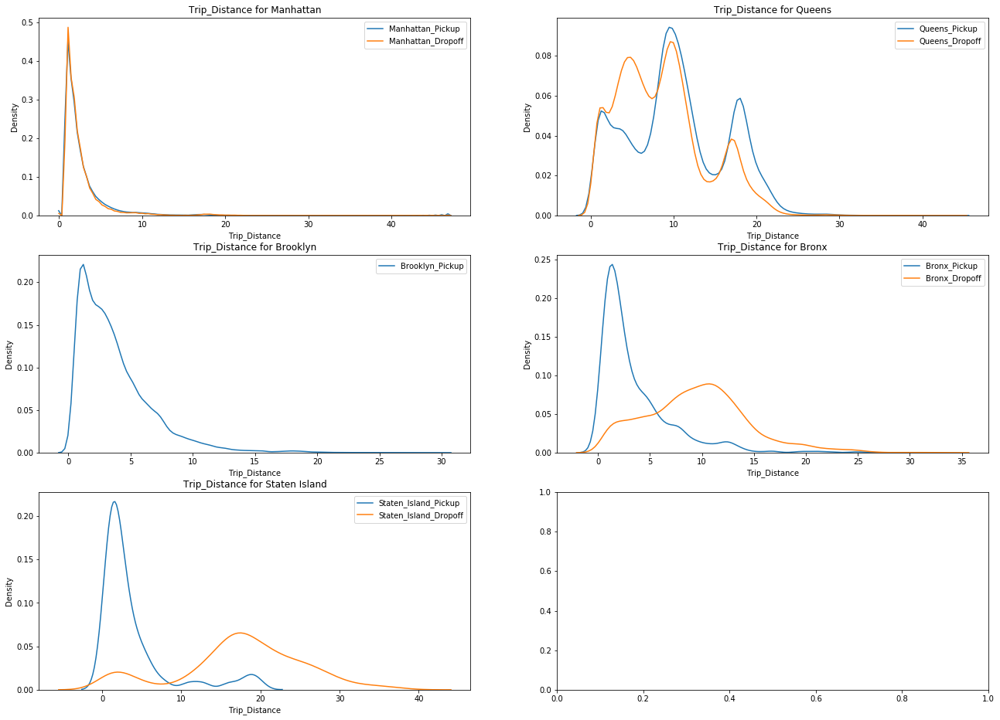

In [157]:
fig, axs = plt.subplots(3, 2, figsize=(22,16))

axs[0][0].set_title('Trip_Distance for Manhattan')
axs[0][0].set_xlabel("Trip_Distance")
axs[0][0].set_ylabel("Density")
sns.kdeplot(data=gdf_sorted.loc[gdf_sorted["borough_pickup"]=="Manhattan","Trip_Distance"],ax=axs[0][0], label="Manhattan_Pickup")
sns.kdeplot(data=gdf_sorted.loc[gdf_sorted["borough_dropoff"]=="Manhattan","Trip_Distance"],ax=axs[0][0], label="Manhattan_Dropoff")

axs[0][1].set_title('Trip_Distance for Queens')
axs[0][1].set_xlabel("Trip_Distance")
axs[0][1].set_ylabel("Density")
sns.kdeplot(data=gdf_sorted.loc[gdf_sorted["borough_pickup"]=="Queens","Trip_Distance"],ax=axs[0][1], label="Queens_Pickup")
sns.kdeplot(data=gdf_sorted.loc[gdf_sorted["borough_dropoff"]=="Queens","Trip_Distance"],ax=axs[0][1], label="Queens_Dropoff")

axs[1][0].set_title('Trip_Distance for Brooklyn')
axs[1][0].set_xlabel("Trip_Distance")
axs[1][0].set_ylabel("Density")
sns.kdeplot(data=gdf_sorted.loc[gdf_sorted["borough_pickup"]=="Brooklyn","Trip_Distance"],ax=axs[1][0], label="Brooklyn_Pickup")
sns.kdeplot(data=gdf_sorted.loc[gdf_sorted["borough_dropoff"]=="Brookyln","Trip_Distance"],ax=axs[1][0], label="Brooklyn_Dropoff")

axs[1][1].set_title('Trip_Distance for Bronx')
axs[1][1].set_xlabel("Trip_Distance")
axs[1][1].set_ylabel("Density")
sns.kdeplot(data=gdf_sorted.loc[gdf_sorted["borough_pickup"]=="Bronx","Trip_Distance"],ax=axs[1][1], label="Bronx_Pickup")
sns.kdeplot(data=gdf_sorted.loc[gdf_sorted["borough_dropoff"]=="Bronx","Trip_Distance"],ax=axs[1][1], label="Bronx_Dropoff")

axs[2][0].set_title('Trip_Distance for Staten Island')
axs[2][0].set_xlabel("Trip_Distance")
axs[2][0].set_ylabel("Density")
sns.kdeplot(data=gdf_sorted.loc[gdf_sorted["borough_pickup"]=="Staten Island","Trip_Distance"],ax=axs[2][0], label="Staten_Island_Pickup")
sns.kdeplot(data=gdf_sorted.loc[gdf_sorted["borough_dropoff"]=="Staten Island","Trip_Distance"],ax=axs[2][0], label="Staten_Island_Dropoff")

#### Observation:
#### 1. Dropoffs to Bronx and Staten Island are long Trips.
#### 2. Even here Manhattan has the same Distribution for Trip Distance

### How about the Trip_Duration Distribution of Pickups and Dropoffs in Boroughs?

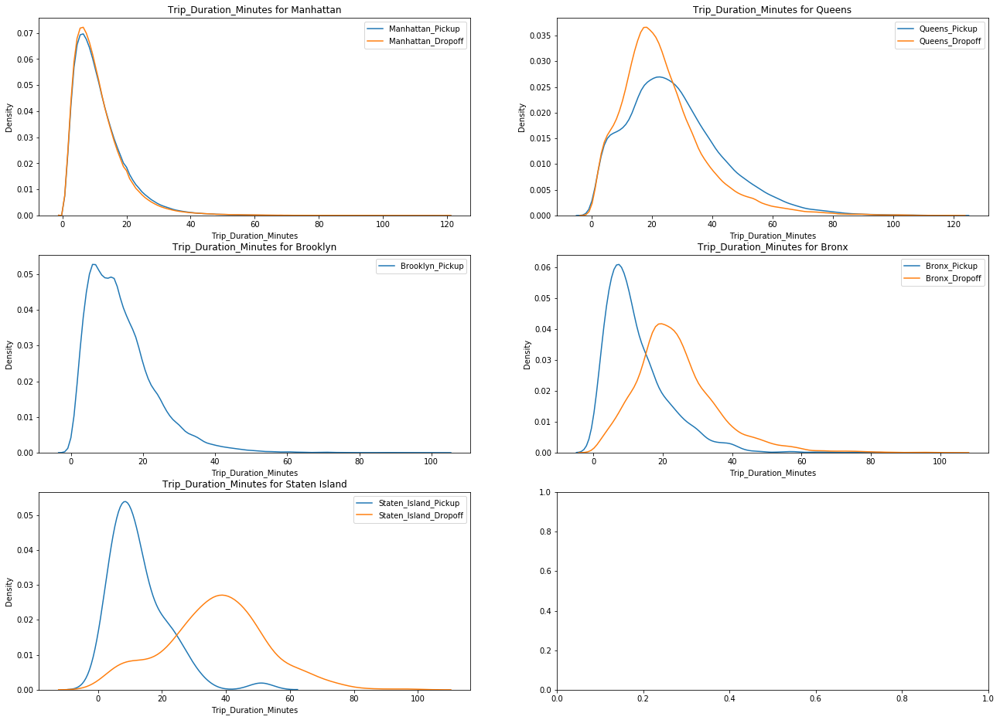

In [158]:
fig, axs = plt.subplots(3, 2, figsize=(22,16))

axs[0][0].set_title('Trip_Duration_Minutes for Manhattan')
axs[0][0].set_xlabel("Trip_Duration_Minutes")
axs[0][0].set_ylabel("Density")
sns.kdeplot(data=gdf_sorted.loc[gdf_sorted["borough_pickup"]=="Manhattan","Trip_Duration_Minutes"],ax=axs[0][0], label="Manhattan_Pickup")
sns.kdeplot(data=gdf_sorted.loc[gdf_sorted["borough_dropoff"]=="Manhattan","Trip_Duration_Minutes"],ax=axs[0][0], label="Manhattan_Dropoff")

axs[0][1].set_title('Trip_Duration_Minutes for Queens')
axs[0][1].set_xlabel("Trip_Duration_Minutes")
axs[0][1].set_ylabel("Density")
sns.kdeplot(data=gdf_sorted.loc[gdf_sorted["borough_pickup"]=="Queens","Trip_Duration_Minutes"],ax=axs[0][1], label="Queens_Pickup")
sns.kdeplot(data=gdf_sorted.loc[gdf_sorted["borough_dropoff"]=="Queens","Trip_Duration_Minutes"],ax=axs[0][1], label="Queens_Dropoff")

axs[1][0].set_title('Trip_Duration_Minutes for Brooklyn')
axs[1][0].set_xlabel("Trip_Duration_Minutes")
axs[1][0].set_ylabel("Density")
sns.kdeplot(data=gdf_sorted.loc[gdf_sorted["borough_pickup"]=="Brooklyn","Trip_Duration_Minutes"],ax=axs[1][0], label="Brooklyn_Pickup")
sns.kdeplot(data=gdf_sorted.loc[gdf_sorted["borough_dropoff"]=="Brookyln","Trip_Duration_Minutes"],ax=axs[1][0], label="Brooklyn_Dropoff")

axs[1][1].set_title('Trip_Duration_Minutes for Bronx')
axs[1][1].set_xlabel("Trip_Duration_Minutes")
axs[1][1].set_ylabel("Density")
sns.kdeplot(data=gdf_sorted.loc[gdf_sorted["borough_pickup"]=="Bronx","Trip_Duration_Minutes"],ax=axs[1][1], label="Bronx_Pickup")
sns.kdeplot(data=gdf_sorted.loc[gdf_sorted["borough_dropoff"]=="Bronx","Trip_Duration_Minutes"],ax=axs[1][1], label="Bronx_Dropoff")

axs[2][0].set_title('Trip_Duration_Minutes for Staten Island')
axs[2][0].set_xlabel("Trip_Duration_Minutes")
axs[2][0].set_ylabel("Density")
sns.kdeplot(data=gdf_sorted.loc[gdf_sorted["borough_pickup"]=="Staten Island","Trip_Duration_Minutes"],ax=axs[2][0], label="Staten_Island_Pickup")
sns.kdeplot(data=gdf_sorted.loc[gdf_sorted["borough_dropoff"]=="Staten Island","Trip_Duration_Minutes"],ax=axs[2][0], label="Staten_Island_Dropoff")

#### Observation
#### 1. Dropoffs Staten Island tend to be longer Trip Duration
#### 2. Even here Manhattan has  almost the same Distribution for Trip Duration
#### 3. The Distribution of Pickups are everywhere almost the same except for Queens

### Where do the long Trip Distance originate and end?
#### Long Distances are over 10 Miles, because a Trip from Hamburg to Harburg is round about 10 Miles
#### We know Trip_Distance and Fare_Amt has a linear Relationship

#### Long Trip Distance Pickup

In [159]:
#1. Plot on Map to see where does these Trips happen
Pickup_High_Distance=gdf_sorted.loc[(gdf_sorted["Trip_Distance"]>=20) & ((gdf_sorted["Manhattan_JFK_Airport_Trip"]!=True))]

Pickup_High_Distance=Pickup_High_Distance[['Pickup_Lat','Pickup_Lon']]

In [160]:
########################Lat,Lon#################################
m_Pickup_High_Distance = folium.Map(location=[40.730610, -73.935242])

for row in Pickup_High_Distance.itertuples(index=False):

    folium.CircleMarker(
        location=[row[0],row[1]],
        radius=1,
        color="green",
        fill=True,
        fill_opacity=0.5
    ).add_to(m_Pickup_High_Distance)

In [161]:
m_Pickup_High_Distance

#### Observation:
#### 1.Most of the Long Distances originates in Lower and Midtown Manhattan and Airports

#### Long Trip Distance Dropoff

In [162]:
#1. Plot on Map to see where does these Trips happen
Dropoff_High_Distance=gdf_sorted.loc[(gdf_sorted["Trip_Distance"]>=20) & ((gdf_sorted["Manhattan_JFK_Airport_Trip"]!=True))]

Dropoff_High_Distance=Dropoff_High_Distance[['Dropoff_Lat','Dropoff_Lon']]

In [163]:
########################Lat,Lon#################################
m_Dropoff_High_Distance = folium.Map(location=[40.730610, -73.935242])

for row in Dropoff_High_Distance.itertuples(index=False):

    folium.CircleMarker(
        location=[row[0],row[1]],
        radius=1,
        color="red",
        fill=True,
        fill_opacity=0.5
    ).add_to(m_Dropoff_High_Distance)

In [164]:
m_Dropoff_High_Distance

#### Observation:
#### 1. Most Dropoffs are in Manhattan, Brooklyn, Airports

### Create Feature "is_area_lower_midtown_manhattan" to differentiate between Rest of Manhattan

#### For getting a Bounding Box for Lower and Midtown Manhattan go to [Bounding Box:](https://boundingbox.klokantech.com/)

In [165]:
# Coordinates of Bounding Box:-74.037727,40.690513,-73.946953,40.776624
# At the Beginning set it to False and if the Coordinate is in Bounding Box set it to True
gdf_sorted["Pickup_Is_Area_Lower_Midtown_Manhattan"]=False
gdf_sorted["Dropoff_Is_Area_Lower_Midtown_Manhattan"]=False
gdf_sorted.loc[(gdf_sorted['Pickup_Lat'].between(40.690513, 40.776624)) & (gdf_sorted['Pickup_Lon'].between(-74.037727, -73.946953)),["Pickup_Is_Area_Lower_Midtown_Manhattan"]]=True
gdf_sorted.loc[(gdf_sorted['Dropoff_Lat'].between(40.690513, 40.776624)) & (gdf_sorted['Dropoff_Lon'].between(-74.037727, -73.946953)),["Dropoff_Is_Area_Lower_Midtown_Manhattan"]]=True 

### How does the Distribution of the Fare Amount look like in Lower and Midtown Manhattan vs. Rest of Manhattan for Pickups?

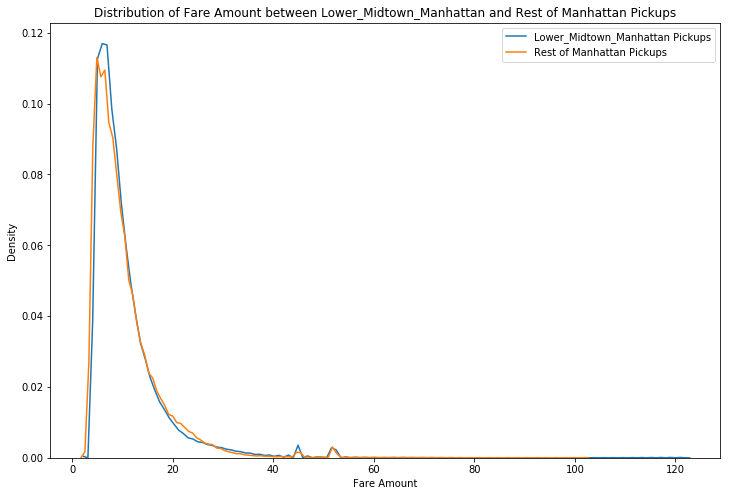

In [166]:
# Dataframe with sorted Passenger Count and Fare Amount
df_is_area_lower_midtown_manhattan_fare=gdf_sorted[["borough_pickup","Pickup_Is_Area_Lower_Midtown_Manhattan","Fare_Amt"]]
# Plotting Distribution of Fare Amount by Number of Passengers
plt.figure(figsize = (12, 8))
plt.xlabel('Fare Amount') 
plt.ylabel('Density')
plt.title("Distribution of Fare Amount between Lower_Midtown_Manhattan and Rest of Manhattan Pickups")
sns.kdeplot(data=df_is_area_lower_midtown_manhattan_fare.loc[(df_is_area_lower_midtown_manhattan_fare["Pickup_Is_Area_Lower_Midtown_Manhattan"]==True) & (df_is_area_lower_midtown_manhattan_fare["borough_pickup"]=="Manhattan"),"Fare_Amt"], label="Lower_Midtown_Manhattan Pickups")
sns.kdeplot(data=df_is_area_lower_midtown_manhattan_fare.loc[(df_is_area_lower_midtown_manhattan_fare["Pickup_Is_Area_Lower_Midtown_Manhattan"]==False) & (df_is_area_lower_midtown_manhattan_fare["borough_pickup"]=="Manhattan"),"Fare_Amt"], label="Rest of Manhattan Pickups")

#### Observation:
#### 1. Almost the same

### How does the Distribution of the Fare Amount look like in Lower and Midtown Manhattan vs. Rest of Manhattan for Dropoffs?

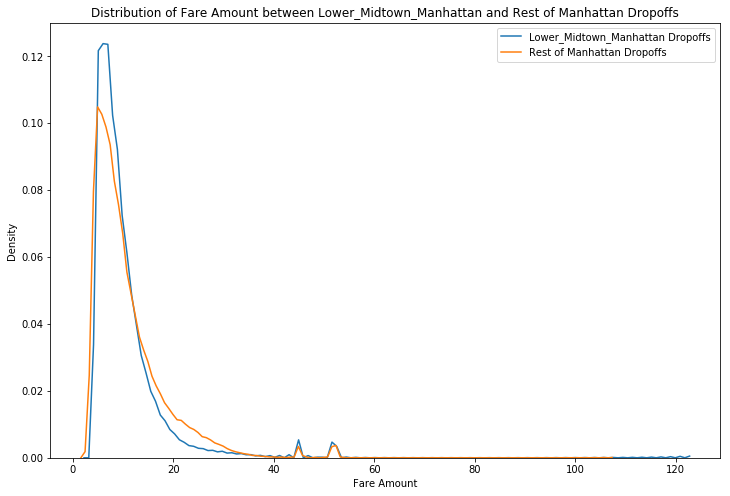

In [167]:
# Dataframe with sorted Passenger Count and Fare Amount
df_is_area_lower_midtown_manhattan_fare=gdf_sorted[["borough_dropoff","Dropoff_Is_Area_Lower_Midtown_Manhattan","Fare_Amt"]]
# Plotting Distribution of Fare Amount by Number of Passengers
plt.figure(figsize = (12, 8))
plt.xlabel('Fare Amount') 
plt.ylabel('Density')
plt.title("Distribution of Fare Amount between Lower_Midtown_Manhattan and Rest of Manhattan Dropoffs")
sns.kdeplot(data=df_is_area_lower_midtown_manhattan_fare.loc[(df_is_area_lower_midtown_manhattan_fare["Dropoff_Is_Area_Lower_Midtown_Manhattan"]==True) & (df_is_area_lower_midtown_manhattan_fare["borough_dropoff"]=="Manhattan"),"Fare_Amt"], label="Lower_Midtown_Manhattan Dropoffs")
sns.kdeplot(data=df_is_area_lower_midtown_manhattan_fare.loc[(df_is_area_lower_midtown_manhattan_fare["Dropoff_Is_Area_Lower_Midtown_Manhattan"]==False) & (df_is_area_lower_midtown_manhattan_fare["borough_dropoff"]=="Manhattan"),"Fare_Amt"], label="Rest of Manhattan Dropoffs")

### What about the Distribution of Trip_Distance and Fare_Amt of Lower_Midtown Manhattan vs Rest of Manhattan?

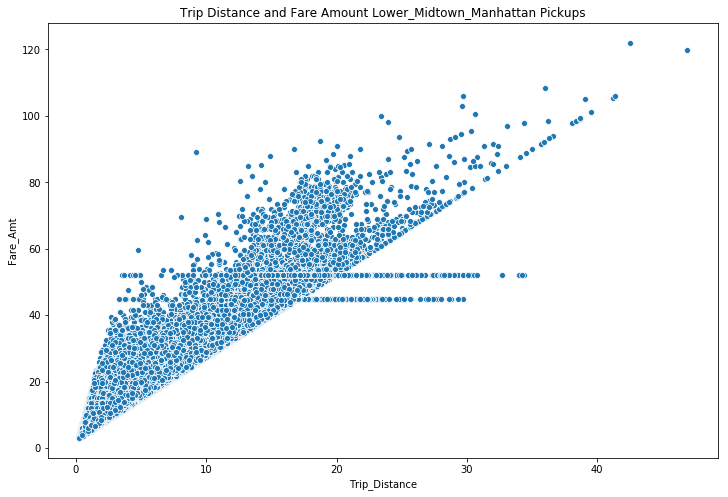

In [168]:
# scatter plot distance - fare
plt.figure(figsize = (12, 8))
plt.xlabel('Trip_Distance') 
plt.ylabel('Fare_Amt')
plt.title('Trip Distance and Fare Amount Lower_Midtown_Manhattan Pickups')
sns.scatterplot(data=gdf_sorted,x=gdf_sorted.loc[(gdf_sorted["Pickup_Is_Area_Lower_Midtown_Manhattan"]==True) & (gdf_sorted["borough_pickup"]=="Manhattan"),"Trip_Distance"], y=gdf_sorted.loc[(gdf_sorted["Pickup_Is_Area_Lower_Midtown_Manhattan"]==True) & (gdf_sorted["borough_pickup"]=="Manhattan"),"Fare_Amt"])

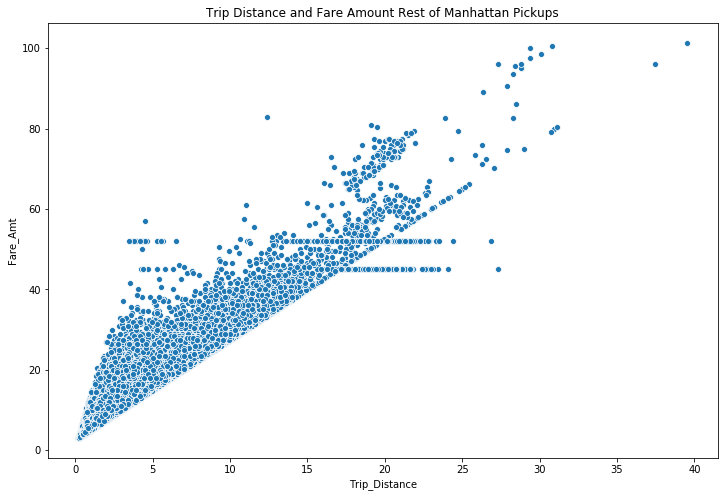

In [169]:
# scatter plot distance - fare
plt.figure(figsize = (12, 8))
plt.xlabel('Trip_Distance') 
plt.ylabel('Fare_Amt')
plt.title('Trip Distance and Fare Amount Rest of Manhattan Pickups')
sns.scatterplot(data=gdf_sorted,x=gdf_sorted.loc[(gdf_sorted["Pickup_Is_Area_Lower_Midtown_Manhattan"]==False) & (gdf_sorted["borough_pickup"]=="Manhattan"),"Trip_Distance"], y=gdf_sorted.loc[(gdf_sorted["Pickup_Is_Area_Lower_Midtown_Manhattan"]==False) & (gdf_sorted["borough_pickup"]=="Manhattan"),"Fare_Amt"])

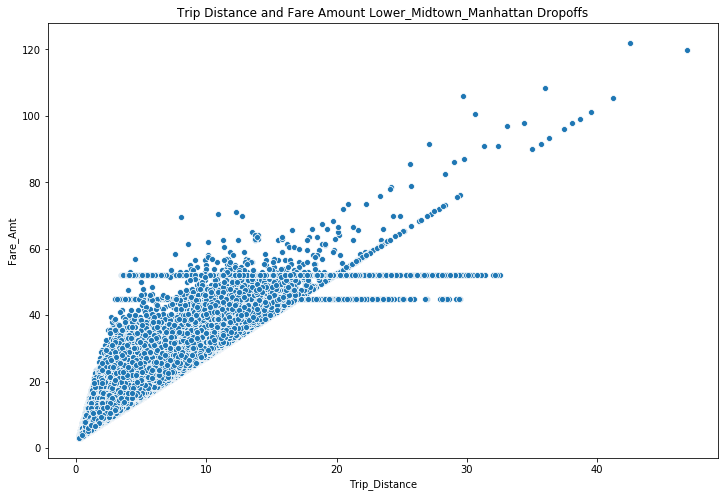

In [170]:
# scatter plot distance - fare
plt.figure(figsize = (12, 8))
plt.xlabel('Trip_Distance') 
plt.ylabel('Fare_Amt')
plt.title('Trip Distance and Fare Amount Lower_Midtown_Manhattan Dropoffs')
sns.scatterplot(data=gdf_sorted,x=gdf_sorted.loc[(gdf_sorted["Dropoff_Is_Area_Lower_Midtown_Manhattan"]==True) & (gdf_sorted["borough_dropoff"]=="Manhattan"),"Trip_Distance"], y=gdf_sorted.loc[(gdf_sorted["Dropoff_Is_Area_Lower_Midtown_Manhattan"]==True) & (gdf_sorted["borough_dropoff"]=="Manhattan"),"Fare_Amt"])

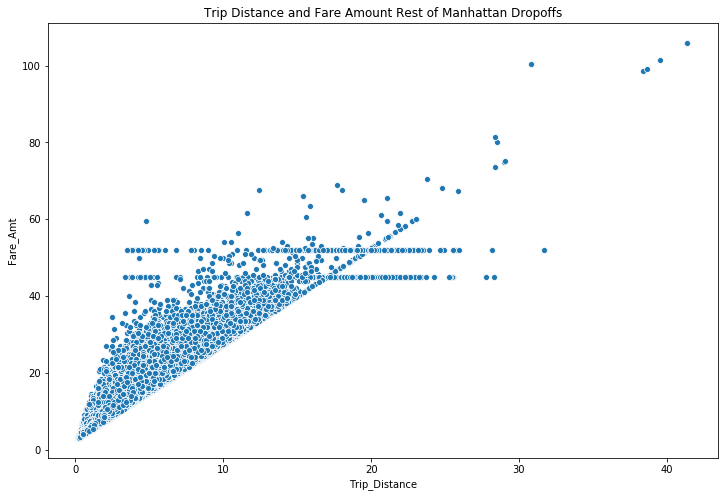

In [171]:
# scatter plot distance - fare
plt.figure(figsize = (12, 8))
plt.xlabel('Trip_Distance') 
plt.ylabel('Fare_Amt')
plt.title('Trip Distance and Fare Amount Rest of Manhattan Dropoffs')
sns.scatterplot(data=gdf_sorted,x=gdf_sorted.loc[(gdf_sorted["Dropoff_Is_Area_Lower_Midtown_Manhattan"]==False) & (gdf_sorted["borough_dropoff"]=="Manhattan"),"Trip_Distance"], y=gdf_sorted.loc[(gdf_sorted["Dropoff_Is_Area_Lower_Midtown_Manhattan"]==False) & (gdf_sorted["borough_dropoff"]=="Manhattan"),"Fare_Amt"])

### 7.What is the Relationship between the Time and the Fare?

#### How does the Amount of Trips developed over the Years?

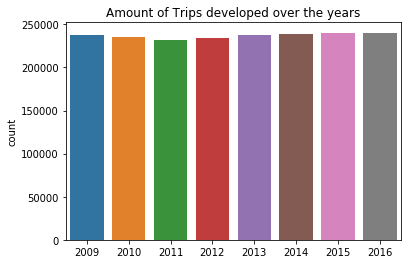

In [172]:
#extract pickup_year and value counts of Dataframe
df_year=gdf_sorted["Pickup_Year"].value_counts()
df_year=df_year.to_frame(name="count")
# Plot the Amount of Trips developed over the years
plt.title("Amount of Trips developed over the years")
sns.barplot(x=df_year.index,y="count",data=df_year)

#### Observation:
#### 1. The Amount of Trips are almost the same

### How does the average Fare Amount developed over the years?

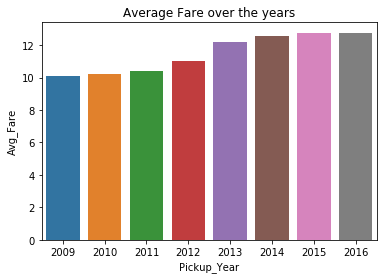

In [173]:
#extract pickup_year and Fare_Amt of Dataframe
df_year_fare=data=gdf_sorted.groupby("Pickup_Year")["Fare_Amt"].mean()
df_year_fare=df_year_fare.to_frame(name="Avg_Fare")
plt.title("Average Fare over the years")
sns.barplot(x=df_year_fare.index,y="Avg_Fare",data=df_year_fare)

#### Observation:
#### 1. The Average Fare Amount has increased over the Years

### What about the Number of Pickups and Average Fare Amount over the months?

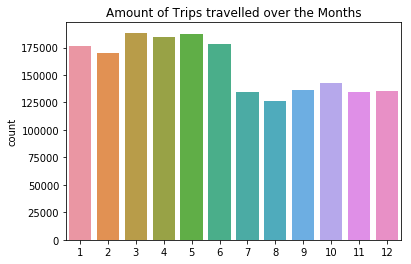

In [174]:
#extract pickup_year and value counts of Dataframe
df_month=gdf_sorted["Pickup_Month"].value_counts()
df_month=df_month.to_frame(name="count")
# Plot the Amount of Trips developed over the years
plt.title("Amount of Trips travelled over the Months")
sns.barplot(x=df_month.index,y="count",data=df_month)

#### Observation:
#### 1. Number of Trips are lower from July to December

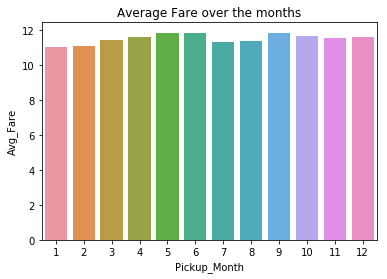

In [175]:
#extract pickup_year and Fare_Amt of Dataframe
df_month_fare=data=gdf_sorted.groupby("Pickup_Month")["Fare_Amt"].mean()
df_month_fare=df_month_fare.to_frame(name="Avg_Fare")
plt.title("Average Fare over the months")
sns.barplot(x=df_month_fare.index,y="Avg_Fare",data=df_month_fare)

#### The Average Fare Amount across the Months look constant

### What about the Number of Pickups and Average Fare Amount over Day of Weeks?

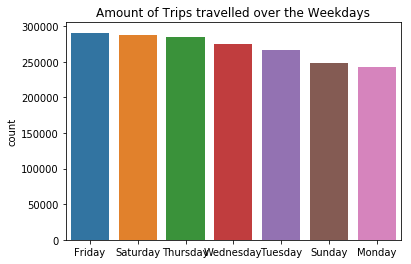

In [176]:
#extract pickup_weekday and value counts of Dataframe
df_weekday=gdf_sorted["Pickup_Weekday"].value_counts()
df_weekday=df_weekday.to_frame(name="count")
# Plot the Amount of Trips developed over the weekdays
plt.title("Amount of Trips travelled over the Weekdays")
sns.barplot(x=df_weekday.index,y="count",data=df_weekday)

#### Observation:
#### 1. The most Trips are on Friday,Saturday and Thursday

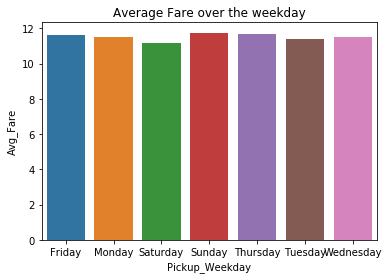

In [177]:
#extract pickup_year and Fare_Amt of Dataframe
df_weekday_fare=data=gdf_sorted.groupby("Pickup_Weekday")["Fare_Amt"].mean()
df_weekday_fare=df_weekday_fare.to_frame(name="Avg_Fare")
plt.title("Average Fare over the weekday")
sns.barplot(x=df_weekday_fare.index,y="Avg_Fare",data=df_weekday_fare)

#### Observation:
#### 1. Saturday has low avg fare amount, compared to other days though there are a lot of trips of saturday. On sunday and monday though the number of trips are lower, avg fare amount is higher

### What about the Number of Pickups and Average Fare Amount over Hour of Days?

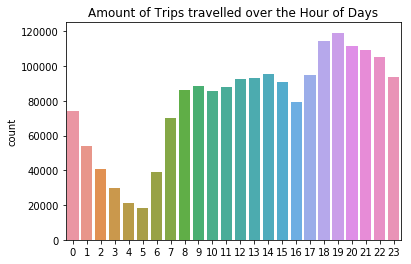

In [178]:
#extract pickup_hour and value counts of Dataframe
df_hour=gdf_sorted["Pickup_Hour"].value_counts()
df_hour=df_hour.to_frame(name="count")
# Plot the Amount of Trips developed over the weekdays
plt.title("Amount of Trips travelled over the Hour of Days")
sns.barplot(x=df_hour.index,y="count",data=df_hour)

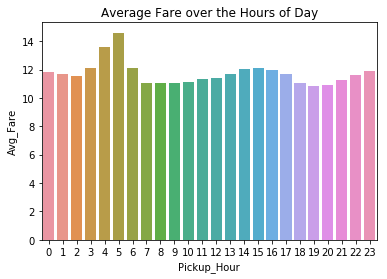

In [179]:
#extract pickup_year and Fare_Amt of Dataframe
df_hour_fare=data=gdf_sorted.groupby("Pickup_Hour")["Fare_Amt"].mean()
df_hour_fare=df_hour_fare.to_frame(name="Avg_Fare")
plt.title("Average Fare over the Hours of Day")
sns.barplot(x=df_hour_fare.index,y="Avg_Fare",data=df_hour_fare)

#### Observation:
#### 1. The avg fare amount at 5am is the higher while the number of trips at 5 am are the least. -> Trips to Airport
#### 2.The number of trips are highest in 18 and 19 hours -> Trips to Night Clubs and Nightlife

### 8.How is the Relation of RateCodeID to Fare Amount?

### How is the Distribution of RateCodeID's?

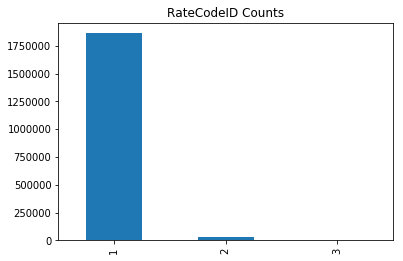

In [180]:
plt.title('RateCodeID Counts')
df_borough_pickup=gdf_sorted["RateCodeID"]
df_borough_pickup.value_counts().plot.bar()

#### Observation
#### 1. The most Trips are RateCodeID 1
#### 2. The second most Trips are RateCodeID 2

### What is the Average Fare for RateCodeID's?

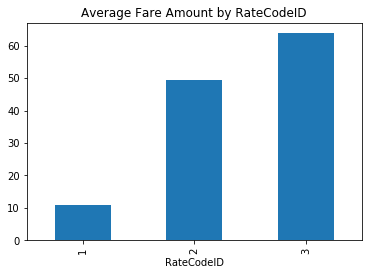

In [181]:
plt.title('Average Fare Amount by RateCodeID')
gdf_sorted.groupby("RateCodeID")["Fare_Amt"].agg("mean").plot.bar()

#### Observation:
#### 1. RateCodeID 3 has the highest average Fare Amount 
#### 2. RateCodeID 2 has the second highest average Fare Amount
#### 3. RateCodeID 1 has the third highest Fare Amount

### How is the Distribution of Fare_Amount by RateCodeID?

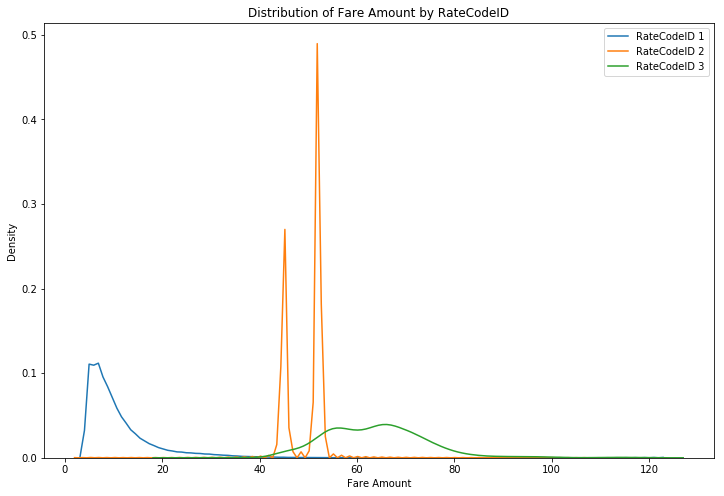

In [182]:
# Dataframe with sorted Passenger Count and Fare Amount
df_rate_fare=gdf_sorted[["RateCodeID","Fare_Amt"]]
# Plotting Distribution of Fare Amount by Number of Passengers
plt.figure(figsize = (12, 8))
plt.xlabel('Fare Amount') 
plt.ylabel('Density')
plt.title("Distribution of Fare Amount by RateCodeID")
sns.kdeplot(data=df_rate_fare.loc[df_rate_fare["RateCodeID"]==1,"Fare_Amt"], label="RateCodeID 1")
sns.kdeplot(data=df_rate_fare.loc[df_rate_fare["RateCodeID"]==2,"Fare_Amt"], label="RateCodeID 2")
sns.kdeplot(data=df_rate_fare.loc[df_rate_fare["RateCodeID"]==3,"Fare_Amt"], label="RateCodeID 3")

#### Observation:
#### 1. Most of the Trips of RateCodeID 2 has high Fare Amounts
#### 2. RateCodeID 1 has more small Fare Amounts
#### 3. RateCodeID 3 has high Fare Amounts, but not so frequently

### 9. How does the Fare Amount developed over the Time?

### How does the Fare Amount developed over the Years?

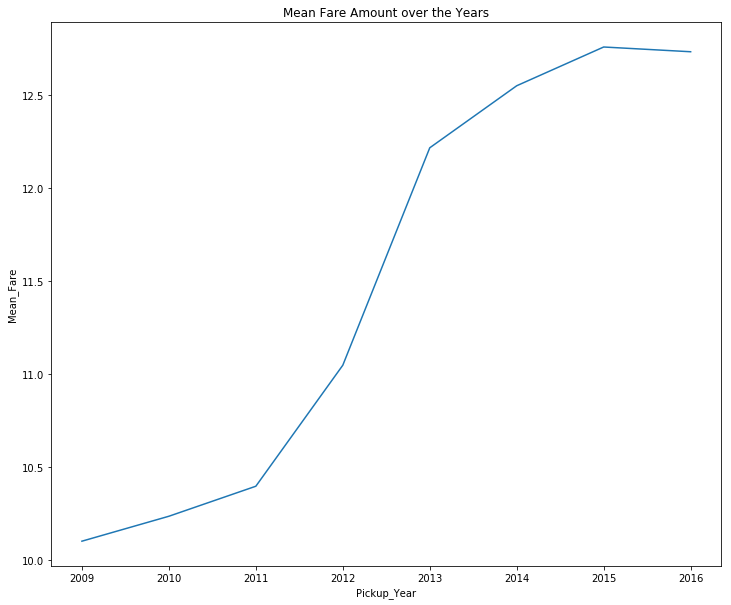

In [183]:
df_year_fare_mean=gdf_sorted.groupby("Pickup_Year")["Fare_Amt"].mean()
df_year_fare_mean=df_year_fare_mean.to_frame(name="Mean_Fare")
plt.figure(figsize=(12,10))
plt.title("Mean Fare Amount over the Years")
sns.lineplot(x=df_year_fare_mean.index,y="Mean_Fare",markers=True, dashes=False,data=df_year_fare_mean)
#sns.lineplot(x="pickup_year", y="Fare_Amt",markers=True, dashes=False, data=gdf_sorted)

#### Observation:
#### 1. There is a tremendous Fare increase between 2011 and 2013 ->

### How does the Fare Amount developed over the Months?

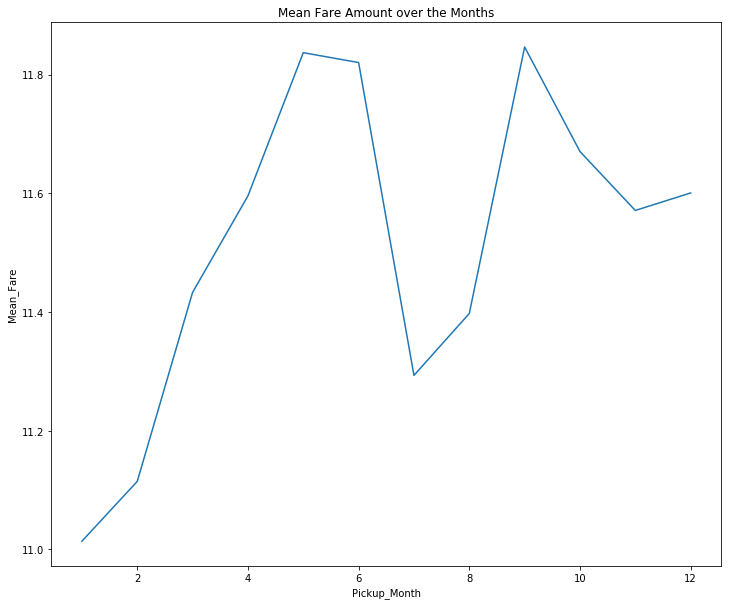

In [184]:
df_month_fare_mean=gdf_sorted.groupby("Pickup_Month")["Fare_Amt"].mean()
df_month_fare_mean=df_month_fare_mean.to_frame(name="Mean_Fare")
plt.figure(figsize=(12,10))
plt.title("Mean Fare Amount over the Months")
sns.lineplot(x=df_month_fare_mean.index,y="Mean_Fare",markers=True, dashes=False,data=df_month_fare_mean)
#sns.lineplot(x="pickup_year", y="Fare_Amt",markers=True, dashes=False, data=gdf_sorted)

#### Observation:
#### 1. The Fare Amount dropped tremendously at beginning in June -> less Trips beginning in July

### How does the Fare Amount developed over the Days?

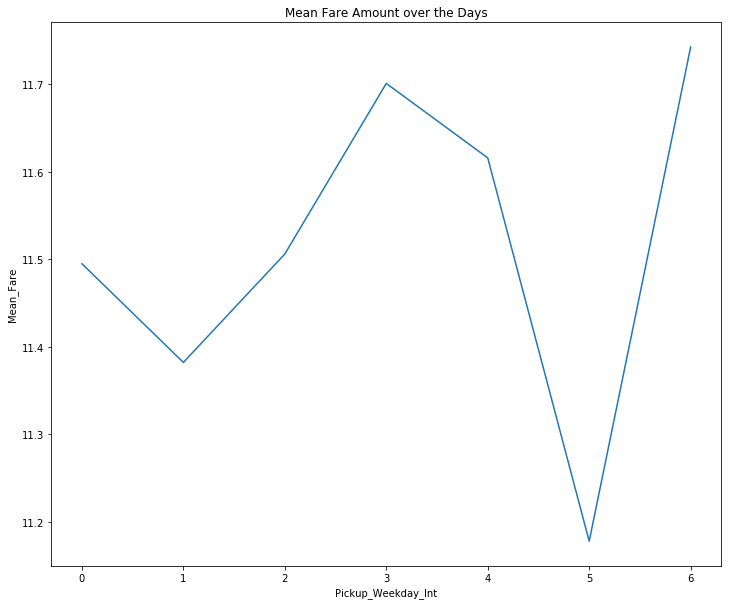

In [185]:
df_weekday_fare_mean=gdf_sorted.groupby("Pickup_Weekday_Int")["Fare_Amt"].mean()
df_weekday_fare_mean=df_weekday_fare_mean.to_frame(name="Mean_Fare")
plt.figure(figsize=(12,10))
plt.title("Mean Fare Amount over the Days")
sns.lineplot(x=df_weekday_fare_mean.index,y="Mean_Fare",markers=True, dashes=False,data=df_weekday_fare_mean)
#sns.lineplot(x="pickup_year", y="Fare_Amt",markers=True, dashes=False, data=gdf_sorted)

#### Observation:
#### 1. The Fare Amount dropped tremendously at Friday

### How does the Fare Amount developed over the Hours?

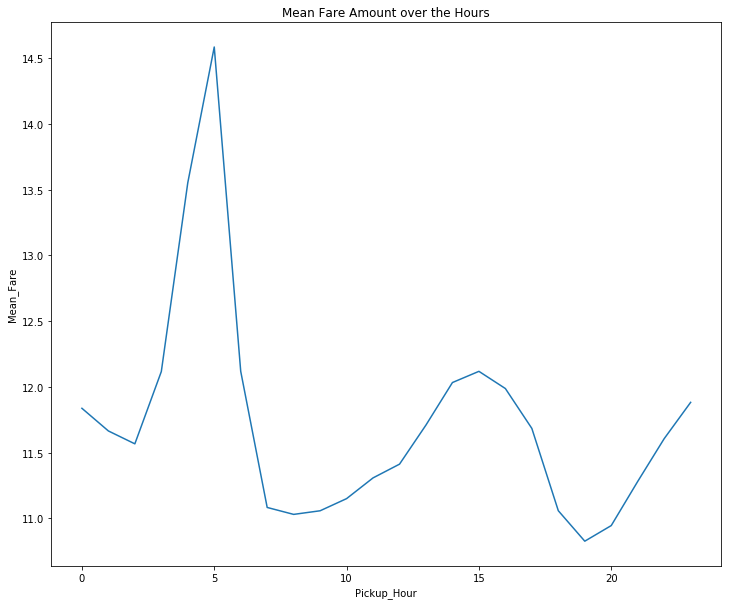

In [186]:
df_hour_fare_mean=gdf_sorted.groupby("Pickup_Hour")["Fare_Amt"].mean()
df_hour_fare_mean=df_hour_fare_mean.to_frame(name="Mean_Fare")
plt.figure(figsize=(12,10))
plt.title("Mean Fare Amount over the Hours")
sns.lineplot(x=df_hour_fare_mean.index,y="Mean_Fare",markers=True, dashes=False,data=df_hour_fare_mean)
#sns.lineplot(x="pickup_year", y="Fare_Amt",markers=True, dashes=False, data=gdf_sorted)

#### Observation:
#### 1. At 5 am are the least Trips

### How does the Fare Amount changed for each Year?

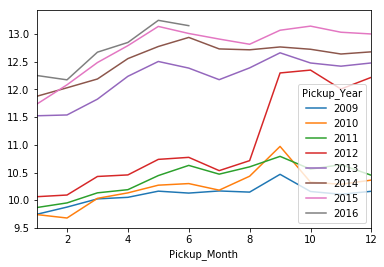

In [187]:
df_year_month_fare_mean=gdf_sorted.groupby(["Pickup_Month","Pickup_Year"])["Fare_Amt"].mean()
df_year_month_fare_mean=df_year_month_fare_mean.unstack()
df_year_month_fare_mean.plot()

In [188]:
# How many Data is left?
origin_length=2000000
print(str(len(gdf_sorted)/origin_length *100) + " "+ " % is left of the origin")

94.7689  % is left of the origin


In [189]:
gdf_sorted

,Pickup_DateTime,Dropoff_DateTime,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,geometry_pickup,zone_pickup,LocationID_pickup,borough_pickup,Dropoff_Lon,Dropoff_Lat,geometry_dropoff,zone_dropoff,LocationID_dropoff,borough_dropoff,Airport_Trip,Manhattan_JFK_Airport_Trip,Trip_Duration,Trip_Duration_Seconds,Trip_Duration_Minutes,computed_haversine,Calculated_Fare_Amt_normal,Calculated_Fare_Amt_haversine,is_Haversine_Distance,is_haversine_fare,is_normal_fare,Pickup_Year,Pickup_Month,Pickup_Day,Pickup_Weekday,Pickup_Weekday_Int,Pickup_Hour,Speed,Fare_Per_Mile,Pickup_Is_Area_Lower_Midtown_Manhattan,Dropoff_Is_Area_Lower_Midtown_Manhattan
index,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
110742,2009-01-01 00:15:31,2009-01-01 00:26:47,4,4.398438,-73.961845,40.800648,1,13.496094,POINT (-73.96184539794922 40.8006477355957),Bloomingdale,24,Manhattan,-73.936188,40.848152,POINT (-73.93618774414063 40.84815216064453),Washington Heights South,244,Manhattan,False,False,00:11:16,676.0,11.0,3.549594,13.496094,11.373985,False,False,True,2009,1,1,Thursday,3,0,37.0,3.068384,False,False
107744,2009-01-01 00:18:28,2009-01-01 00:26:30,4,2.300781,-73.975883,40.775955,1,8.251953,POINT (-73.97588348388672 40.77595520019531),Central Park,43,Manhattan,-73.964355,40.804085,POINT (-73.96435546875 40.80408477783203),Morningside Heights,166,Manhattan,False,False,00:08:02,482.0,8.0,2.036933,8.251953,7.592333,False,False,True,2009,1,1,Thursday,3,0,27.0,3.586587,True,False
210569,2009-01-01 00:19:58,2009-01-01 00:27:00,2,1.000000,-73.959457,40.767616,1,5.699219,POINT (-73.95945739746094 40.76761627197266),Lenox Hill West,141,Manhattan,-73.961426,40.777248,POINT (-73.96142578125 40.77724838256836),Upper East Side North,236,Manhattan,False,False,00:07:02,422.0,7.0,0.674116,5.000000,4.185290,False,False,False,2009,1,1,Thursday,3,0,13.0,5.699219,True,False
241310,2009-01-01 00:20:22,2009-01-01 00:34:22,1,1.200195,-73.992119,40.748291,1,9.000000,POINT (-73.99211883544922 40.748291015625),Penn Station/Madison Sq West,186,Manhattan,-73.977127,40.743259,POINT (-73.97712707519531 40.74325942993164),Kips Bay,137,Manhattan,False,False,00:14:00,840.0,14.0,0.859251,5.500488,4.648127,False,False,False,2009,1,1,Thursday,3,0,8.0,7.498779,True,True
123511,2009-01-01 00:20:27,2009-01-01 00:22:31,2,0.399902,-73.979027,40.777214,1,3.499756,POINT (-73.97902679443359 40.77721405029297),Lincoln Square East,142,Manhattan,-73.979668,40.773609,POINT (-73.97966766357422 40.77360916137695),Lincoln Square East,142,Manhattan,False,False,00:02:04,124.0,2.0,0.251423,3.499756,3.128557,False,False,True,2009,1,1,Thursday,3,0,18.0,8.751526,False,True
58781,2009-01-01 00:20:31,2009-01-01 00:35:57,1,3.099609,-73.973984,40.751244,1,11.398438,POINT (-73.97398376464844 40.75124359130859),UN/Turtle Bay South,233,Manhattan,-73.999573,40.719433,POINT (-73.99957275390625 40.71943283081055),Little Italy/NoLiTa,144,Manhattan,False,False,00:15:26,926.0,15.0,2.577000,10.249023,8.942501,False,False,False,2009,1,1,Thursday,3,0,19.0,3.677379,True,True
103740,2009-01-01 00:21:33,2009-01-01 00:28:31,1,1.000000,-73.975723,40.744865,1,6.199219,POINT (-73.97572326660156 40.74486541748047),Murray Hill,170,Manhattan,-73.969849,40.751698,POINT (-73.9698486328125 40.7516975402832),UN/Turtle Bay South,233,Manhattan,False,False,00:06:58,418.0,6.0,0.564062,5.000000,3.910154,False,False,False,2009,1,1,Thursday,3,0,13.0,6.199219,True,True
234,2009-01-01 00:22:24,2009-01-01 00:47:14,1,4.101562,-73.978012,40.725197,1,15.796875,POINT (-73.97801208496094 40.72519683837891),Alphabet City,4,Manhattan,-73.987656,40.760220,POINT (-73.98765563964844 40.76021957397461),Clinton East,48,Manhattan,False,False,00:24:50,1490.0,24.0,2.474593,12.753906,8.686483,False,False,False,2009,1,1,Thursday,3,0,15.0,3.851429,True,True
205837,2009-01-01 00:24:21,2009-01-01 00:35:37,2,3.000000,-73.989807,40.739082,1,10.203125,POINT (-73.98980712890625 40.73908233642578),Union Sq,234,Manhattan,-74.016190,40.706070,POINT (-74.01618957519

In [190]:
gdf_sorted.describe()

,Passenger_Count,Trip_Distance,Pickup_Lon,Pickup_Lat,RateCodeID,Fare_Amt,LocationID_pickup,Dropoff_Lon,Dropoff_Lat,LocationID_dropoff,Trip_Duration,Trip_Duration_Seconds,Trip_Duration_Minutes,computed_haversine,Calculated_Fare_Amt_normal,Calculated_Fare_Amt_haversine,Pickup_Year,Pickup_Month,Pickup_Day,Pickup_Weekday_Int,Pickup_Hour,Speed,Fare_Per_Mile
count,1.895378e+06,1.895378e+06,1.895378e+06,1.895378e+06,1.895378e+06,1.895378e+06,1.895378e+06,1.895378e+06,1.895378e+06,1.895378e+06,1895378,1.895378e+06,1.895378e+06,1.895378e+06,1.895378e+06,1.895378e+06,1.895378e+06,1.895378e+06,1.895378e+06,1.895378e+06,1.895378e+06,1.895378e+06,1.895378e+06
mean,1.687557e+00,2.887868e+00,-7.397546e+01,4.075098e+01,1.018240e+00,1.151458e+01,1.607536e+02,-7.397465e+01,4.075144e+01,1.590079e+02,0 days 00:12:52.360890,7.723609e+02,1.256389e+01,2.091624e+00,9.673084e+00,7.729062e+00,2.012518e+03,6.089221e+00,1.570399e+01,3.040412e+00,1.354091e+01,2.006727e+01,5.200887e+00
std,1.309711e+00,3.280632e+00,3.409396e-02,2.659778e-02,1.427763e-01,8.876041e+00,6.640540e+01,3.265892e-02,3.052449e-02,6.932422e+01,0 days 00:09:35.705144,5.757051e+02,9.596075e+00,2.215811e+00,8.202104e+00,5.539528e+00,2.296767e+00,3.416765e+00,8.689029e+00,1.949287e+00,6.494854e+00,1.016159e+01,1.953178e+00
min,1.000000e+00,2.000251e-01,-7.423065e+01,4.051488e+01,1.000000e+00,3.000063e+00,2.000000e+00,-7.424289e+01,4.050939e+01,1.000000e+00,0 days 00:00:25,2.500000e+01,0.000000e+00,2.362194e-04,2.525005e+00,2.500591e+00,2.009000e+03,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.513400e+00
25%,1.000000e+00,1.089844e+00,-7.399225e+01,4.073677e+01,1.000000e+00,6.101562e+00,1.130000e+02,-7.399152e+01,4.073571e+01,1.070000e+02,0 days 00:06:21,3.810000e+02,6.000000e+00,8.045854e-01,5.148926e+00,4.511463e+00,2.011000e+03,3.000000e+00,8.000000e+00,1.000000e+00,9.000000e+00,1.300000e+01,3.776715e+00
50%,1.000000e+00,1.799805e+00,-7.398211e+01,4.075345e+01,1.000000e+00,8.525391e+00,1.610000e+02,-7.398053e+01,4.075396e+01,1.610000e+02,0 days 00:10:21,6.210000e+02,1.000000e+01,1.356058e+00,6.975098e+00,5.890144e+00,2.013000e+03,6.000000e+00,1.600000e+01,3.000000e+00,1.400000e+01,1.800000e+01,4.773535e+00
75%,2.000000e+00,3.199219e+00,-7.396842e+01,4.076770e+01,1.000000e+00,1.300000e+01,2.310000e+02,-7.396521e+01,4.076859e+01,2.310000e+02,0 days 00:16:24,9.840000e+02,1.600000e+01,2.452085e+00,1.049805e+01,8.630213e+00,2.015000e+03,9.000000e+00,2.300000e+01,5.000000e+00,1.900000e+01,2.400000e+01,6.124542e+00
max,6.000000e+00,4.690625e+01,-7.371025e+01,4.091128e+01,3.000000e+00,1.220000e+02,2.630000e+02,-7.370098e+01,4.091288e+01,2.630000e+02,0 days 02:00:52,7.252000e+03,1.200000e+02,2.448074e+01,1.197656e+02,6.370184e+01,2.016000e+03,1.200000e+01,3.100000e+01,6.000000e+00,2.300000e+01,7.000000e+01,1.500000e+01


### How does the Airport Destination Newark Airport affect the Fare?

In [191]:
# Trips with Destination Newark Airport
# Create Manhattan_JFK_Airport_Trip with boolean values to show if trip is Manhattan_JFK Airport Trip or not
gdf_sorted["Is_Destination_Newark_Airport"]=False
gdf_sorted.loc[(gdf_sorted['zone_dropoff'] == "Newark Airport"),['Is_Destination_Newark_Airport']] = True

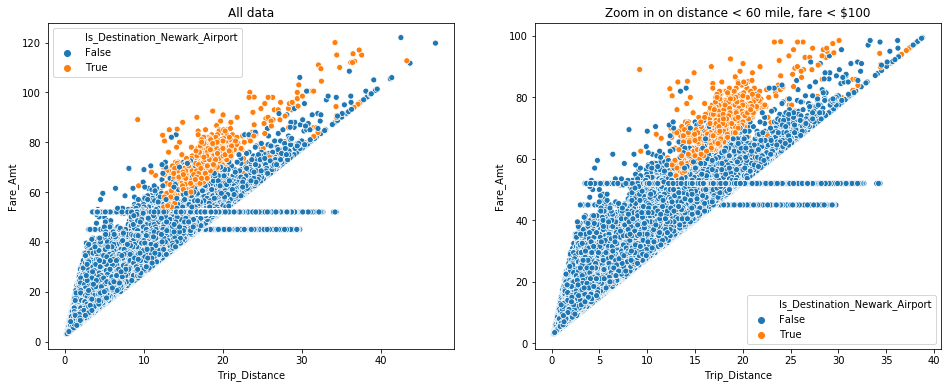

In [192]:
# scatter plot distance - fare
fig, axs = plt.subplots(1, 2, figsize=(16,6))
sns.scatterplot(data=gdf_sorted,x="Trip_Distance", y="Fare_Amt",ax=axs[0],hue="Is_Destination_Newark_Airport")
axs[0].set_xlabel('Trip_Distance')
axs[0].set_ylabel('Fare_Amt')
axs[0].set_title('All data')

# zoom in on part of data
idx = (gdf_sorted.Trip_Distance < 60) & (gdf_sorted.Fare_Amt < 100)
sns.scatterplot(data=gdf_sorted,x=gdf_sorted[idx].Trip_Distance, y=gdf_sorted[idx].Fare_Amt,ax=axs[1],hue="Is_Destination_Newark_Airport")
axs[1].set_xlabel('Trip_Distance')
axs[1].set_ylabel('Fare_Amt')
axs[1].set_title('Zoom in on distance < 60 mile, fare < $100');

### How does Trips from and to La Guardia Airport affect the Fare Amount?

In [193]:
# Trips with Destination Newark Airport
# Create Manhattan_JFK_Airport_Trip with boolean values to show if trip is Manhattan_JFK Airport Trip or not
gdf_sorted["Is_Destination_LaGuardia_Airport"]=False
gdf_sorted["Is_Origin_LaGuardia_Airport"]=False
gdf_sorted.loc[(gdf_sorted['zone_dropoff'] == "LaGuardia Airport"),['Is_Destination_LaGuardia_Airport']] = True
gdf_sorted.loc[(gdf_sorted['zone_pickup'] == "LaGuardia Airport"),['Is_Origin_LaGuardia_Airport']] = True

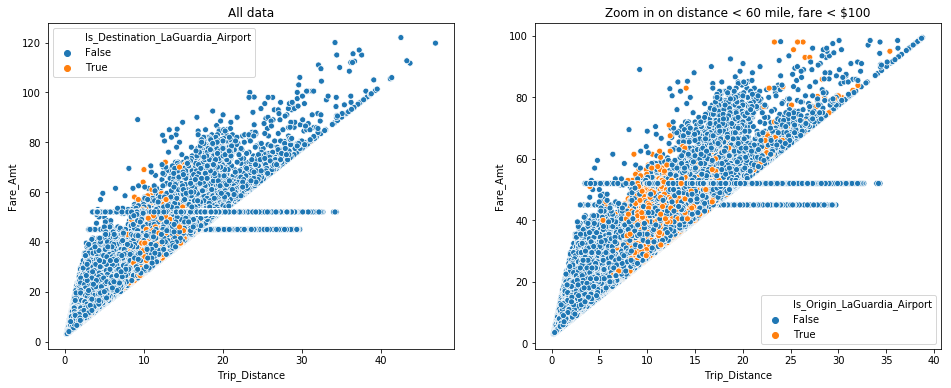

In [194]:
# scatter plot distance - fare
fig, axs = plt.subplots(1, 2, figsize=(16,6))
sns.scatterplot(data=gdf_sorted,x="Trip_Distance", y="Fare_Amt",ax=axs[0],hue="Is_Destination_LaGuardia_Airport")
axs[0].set_xlabel('Trip_Distance')
axs[0].set_ylabel('Fare_Amt')
axs[0].set_title('All data')

# zoom in on part of data
idx = (gdf_sorted.Trip_Distance < 60) & (gdf_sorted.Fare_Amt < 100)
sns.scatterplot(data=gdf_sorted,x=gdf_sorted[idx].Trip_Distance, y=gdf_sorted[idx].Fare_Amt,ax=axs[1],hue="Is_Origin_LaGuardia_Airport")
axs[1].set_xlabel('Trip_Distance')
axs[1].set_ylabel('Fare_Amt')
axs[1].set_title('Zoom in on distance < 60 mile, fare < $100');

#### Create Feature Columns Distance to Time Square,Wall Street,Manhattan Mall,JFK Airport, Newark Airport and La Guardia Airport, Brooklyn Bridge, Park Slope Brookyln
#### because of the most dropoffs are in these Areas

In [197]:
# Define Coordinates of special Places from Google 
time_square = (-73.984379, 40.759929)
wall_street = (-74.008798, 40.706189)
manhattan_mall = (-73.989225, 40.750079)
jfk_airport = (-73.778096, 40.641734)
newark_airport = (-74.174634, 40.689596)
laguardia_airport = (-73.873837, 40.776635)
brooklyn_bridge=(-73.996864, 40.706183)
park_slope=(-73.981108, 40.670313)

gdf_sorted["Distance_to_Time_Square"]=haversine(gdf_sorted['Pickup_Lon'], gdf_sorted['Pickup_Lat'],time_square[0], time_square[1])
gdf_sorted["Distance_to_Wall_Street"]=haversine(gdf_sorted['Pickup_Lon'], gdf_sorted['Pickup_Lat'],wall_street[0], wall_street[1])
gdf_sorted["Distance_to_Manhattan_Mall"]=haversine(gdf_sorted['Pickup_Lon'], gdf_sorted['Pickup_Lat'],manhattan_mall[0], manhattan_mall[1])
gdf_sorted["Distance_to_JFK_Airport"]=haversine(gdf_sorted['Pickup_Lon'], gdf_sorted['Pickup_Lat'],jfk_airport[0], jfk_airport[1])
gdf_sorted["Distance_to_Newark_Airport"]=haversine(gdf_sorted['Pickup_Lon'], gdf_sorted['Pickup_Lat'],newark_airport[0], newark_airport[1])
gdf_sorted["Distance_to_LaGuardia_Airport"]=haversine(gdf_sorted['Pickup_Lon'], gdf_sorted['Pickup_Lat'],laguardia_airport[0], laguardia_airport[1])
gdf_sorted["Distance_to_Brooklyn_Bridge"]=haversine(gdf_sorted['Pickup_Lon'], gdf_sorted['Pickup_Lat'],brooklyn_bridge[0], brooklyn_bridge[1])
gdf_sorted["Distance_to_Park_Slope"]=haversine(gdf_sorted['Pickup_Lon'], gdf_sorted['Pickup_Lat'],park_slope[0], park_slope[1])

### Convert Dataframe to Parquet, because the notebook would be too big later on

In [198]:
# Convert to parquet for quick reloading
# Set Path for Parquet Files
path="F:/1_Bachelorarbeit/1_Daten/1_Yellow_Cab_Trips_2009-June_2016/6_Preprocessed_Data"
gdf_sorted.to_parquet(os.path.join(path, "Preprocessed_Tripdata" + "." + "parquet"),engine="fastparquet")